<a href="https://colab.research.google.com/github/danort92/Clients-Creditworthiness/blob/main/Clients_Creditworthiness.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IMPORT FUNCTIONS/LIBRARIES

In [2]:
#basics
import pandas as pd
import numpy as np
import time

#viz
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

#sklearn preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

#sklearn classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import RandomizedSearchCV

#sklearn metrics
from sklearn.metrics import roc_curve, auc, classification_report, f1_score, make_scorer, confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score

#sklearn dimensionality reduction
from sklearn.decomposition import PCA

#xgboost classifiers
import xgboost
from xgboost import XGBClassifier


#sampling techniques
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import ADASYN
from imblearn.combine import SMOTEENN

In [3]:
#say no to warnings!
import warnings
warnings.filterwarnings("ignore")
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# DATA IMPORT

In [4]:
app=pd.read_csv("https://raw.githubusercontent.com/danort92/Clients-Creditworthiness/main/credit_card_approval/application_record.csv")
app.head(10)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
5,5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
6,5008811,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
7,5008812,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0
8,5008813,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0
9,5008814,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0


In [5]:
cred=pd.read_csv("https://raw.githubusercontent.com/danort92/Clients-Creditworthiness/main/credit_card_approval/credit_record.csv")
cred.head(10)

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C
5,5001712,-1,C
6,5001712,-2,C
7,5001712,-3,C
8,5001712,-4,C
9,5001712,-5,C


# DATAFRAME MERGING

In [6]:
len(app["ID"]), app["ID"].nunique() # some rows have the same ID client

(438557, 438510)

In [7]:
len(cred["ID"]), cred["ID"].nunique()

(1048575, 45985)

In [8]:
len(set(app["ID"]).intersection(set(cred["ID"]))) # among all IDs only 36457 are in common

36457

In [9]:
common_ids = set(app["ID"]).intersection(cred["ID"]) # the analysis is performed only on common IDs
app_common = app[app["ID"].isin(common_ids)]
cred_common = cred[cred["ID"].isin(common_ids)]
len(app_common["ID"]), len(set(cred_common["ID"]))

(36457, 36457)

In [10]:
acc_age=cred_common.groupby(['ID'])['MONTHS_BALANCE'].agg(min) # age of the account
acc_age=acc_age*-1
app_common=pd.merge(app_common, acc_age, how="left", on ="ID") # merge with the application dataframe
app_common.head(50)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,MONTHS_BALANCE
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,15
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,14
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,29
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,4
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,26
5,5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,26
6,5008811,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,38
7,5008812,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0,20
8,5008813,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0,16
9,5008814,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0,17


In [11]:
app_common=app_common.rename(columns={
    'CODE_GENDER':'Gender',
    'FLAG_OWN_CAR':'Has a car',
    'FLAG_OWN_REALTY':'Has a property',
    'CNT_CHILDREN':'Children number',
    'AMT_INCOME_TOTAL':'Income',
    'NAME_INCOME_TYPE':'Income type',
    'NAME_EDUCATION_TYPE':'Education level',
    'NAME_FAMILY_STATUS':'Marital status',
    'NAME_HOUSING_TYPE':'Dwelling',
    'DAYS_BIRTH':'Age',
    'DAYS_EMPLOYED': 'Employment length',
    'FLAG_MOBIL': 'Has a mobile phone',
    'FLAG_WORK_PHONE': 'Has a work phone',
    'FLAG_PHONE': 'Has a phone',
    'FLAG_EMAIL': 'Has an email',
    'OCCUPATION_TYPE': 'Job title',
    'CNT_FAM_MEMBERS': 'Family members',
    'MONTHS_BALANCE': 'Account age'
    })

# EDA

*EDA is performed to analyse potential interesting patterns and anomalies*

## FUNCTIONS

In [12]:
def create_bar_plot(df, feature, xlabel_rotation=0):
    plt.figure(figsize=(8, 6))

    counts = df[feature].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=counts.index, y=counts.values, palette=sns.color_palette('Set2'))
    plt.title("{} count".format(feature))
    plt.ylabel("Number of clients")
    plt.xticks(rotation=xlabel_rotation)

    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom', fontsize=7)

    plt.show()

In [13]:
# Function to create a pie chart
def create_pie_chart(df, feature):
    plt.figure(figsize=(8, 8))

    values = df[feature].value_counts()
    ax = plt.pie(values, labels=values.index, autopct='%1.1f%%', colors=sns.color_palette('Set2'), startangle=140)
    plt.title("{} count".format(feature))

    plt.show()

In [14]:
# Function to create a histogram
def create_hist(df, feature, n_bins=10, norm=True, kde=True, label_sc_annotation=True):
    plt.figure(figsize=(8, 6))
    min_length = abs(df[feature]).min()
    max_length = abs(df[feature]).max()
    num_bins = n_bins

    if norm:
        sns.histplot(abs(df[feature]) / 365.25, bins=num_bins, color='skyblue', edgecolor='black', kde=kde)
        plt.xlabel("{}".format(feature))
    else:
        sns.histplot(abs(df[feature]), bins=num_bins, color='skyblue', edgecolor='black', kde=kde)
        plt.xlabel("{}".format(feature))
        def income_formatter(x, _):
          if x >= 1e6:
              return f'{x / 1e6:.1f}M'
          elif x >= 1e3:
              return f'{x / 1e3:.0f}K'
          else:
              return f'{x:.0f}'
        if not label_sc_annotation:
          plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(income_formatter))

    plt.ylabel("Number of clients")
    plt.title("Clients {}".format(feature))
    plt.show()

In [15]:
  # Function to create a boxplot
  def create_boxplot(df, feature):

      plt.figure(figsize=(6, 8))
      sns.boxplot(y=df[feature], color='skyblue')
      plt.title("Boxplot clients {}".format(feature))
      plt.ylabel("{}".format(feature))

      def income_formatter(x, _):
          if x >= 1e6:
              return f'{x/1e6:.1f}M'
          elif x < 1e6 and x>=1e3:
              return f'{x/1e3:.0f}K'
          else:
              return f'{x:.0f}'

      plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(income_formatter))

      plt.show()

In [16]:
# function to create a boxplot
def create_boxplot_target(df, feature, target_feature):
    plt.figure(figsize=(6, 8))
    sns.boxplot(x=df[target_feature], y=df[feature], palette=['skyblue', 'salmon'])
    plt.title("Boxplot clients {} by {}".format(feature, target_feature))
    plt.xlabel("{}".format(target_feature))
    plt.ylabel("{}".format(feature))

    def income_formatter(x, _):
        if x >= 1e6:
            return f'{x/1e6:.1f}M'
        elif x < 1e6 and x >= 1e3:
            return f'{x/1e3:.0f}K'
        else:
            return f'{x:.0f}'

    plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(income_formatter))

    plt.show()

In [17]:
# function to calculate statistics
def calculate_stats(df, feature):
    if feature not in df.columns:
        raise ValueError(f"Feature '{feature}' not found in the DataFrame.")

    if pd.api.types.is_numeric_dtype(df[feature]):
        quantile_25 = df[feature].quantile(0.25)
        quantile_75 = df[feature].quantile(0.75)
        median = df[feature].median()
        minimum = df[feature].min()
        maximum = df[feature].max()
        mean = df[feature].mean()
        std_dev = df[feature].std()
        kurt = df[feature].kurt()
        skewness = df[feature].skew()

        feature_stats = pd.DataFrame({
            'Statistic': ['Minimum', 'Quantile 25%', 'Median', 'Quantile 75%', 'Maximum', 'Mean', 'Standard Deviation', 'Kurtosis', 'Skewness'],
            'Value': [minimum, quantile_25, median, quantile_75, maximum, mean, std_dev, kurt, skewness]
        })
    else:
        mode = df[feature].mode().values[0]

        feature_stats = pd.DataFrame({
            'Statistic': ['Mode'],
            'Value': [mode]
        })

    return feature_stats

## GENDER

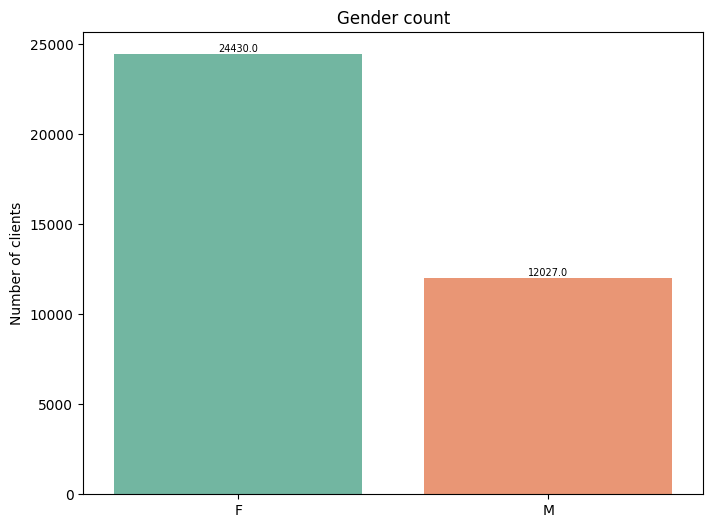

In [18]:
create_bar_plot(app_common, "Gender")

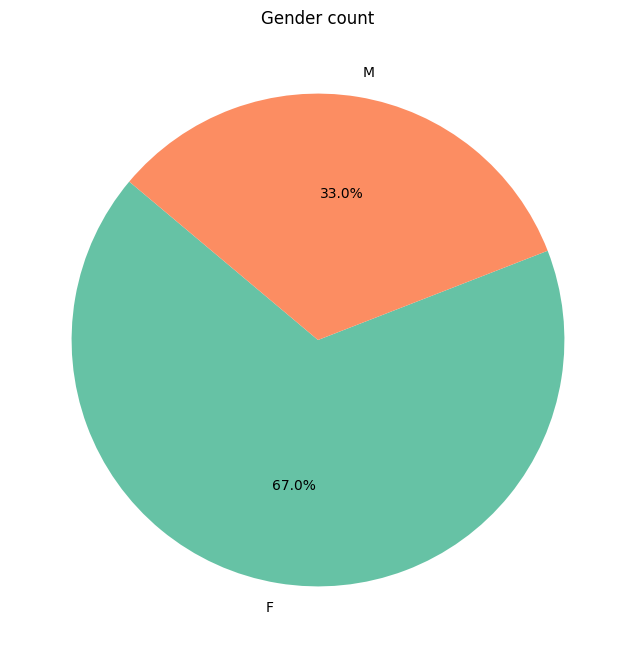

In [19]:
create_pie_chart(app_common, "Gender")

*Females are more than two times males, representing the 67% of the whole dataset*

## CAR OWNERSHIP

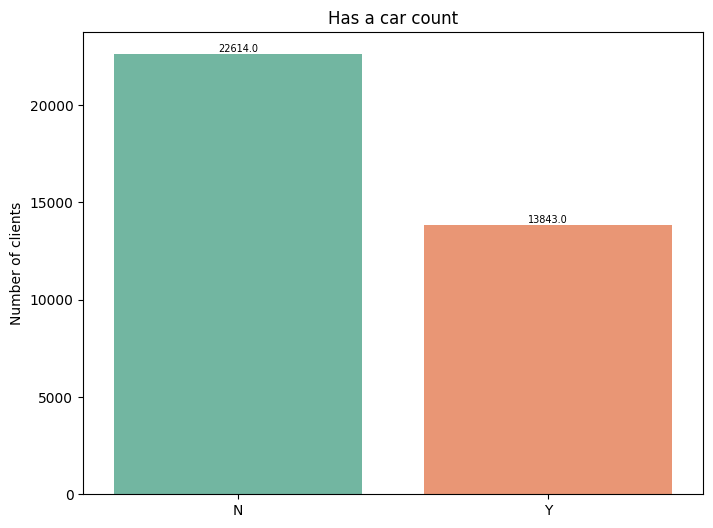

In [20]:
create_bar_plot(app_common, "Has a car")

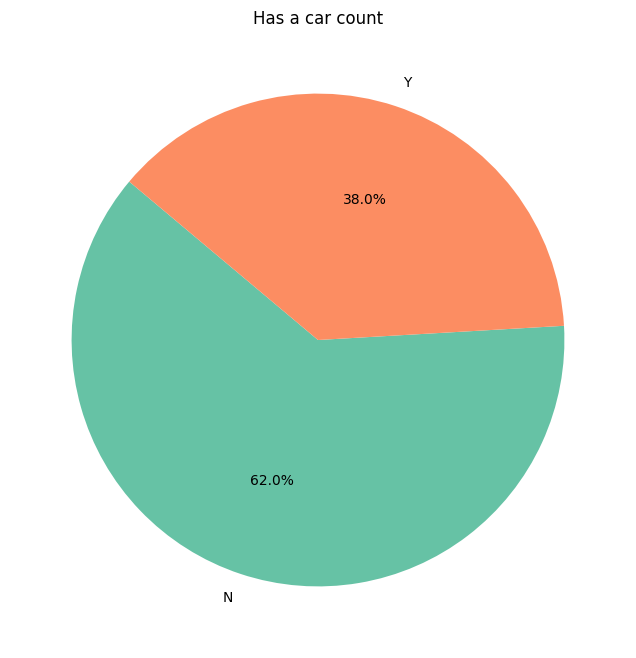

In [21]:
create_pie_chart(app_common, "Has a car")

*62% of clients does not have a car, that's quiet a surprising data. Being a real dataset of a bank in Japan it could represent japanese habits: most people move with public transport and don't need a car*

## PROPERTY OWNERSHIP

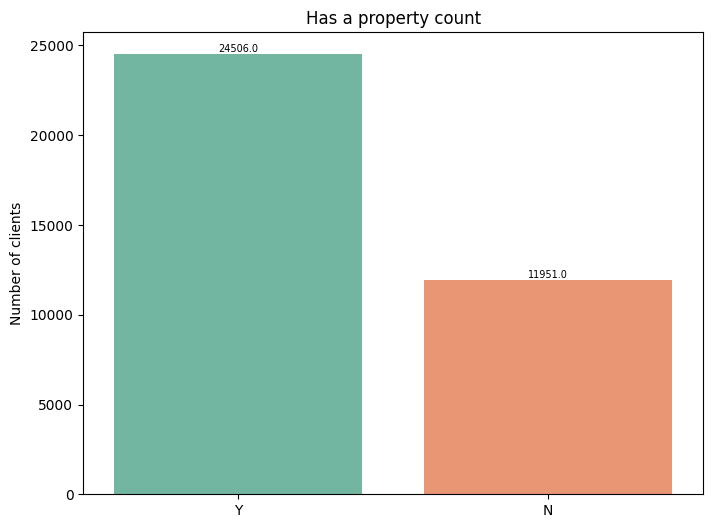

In [22]:
create_bar_plot(app_common, "Has a property")

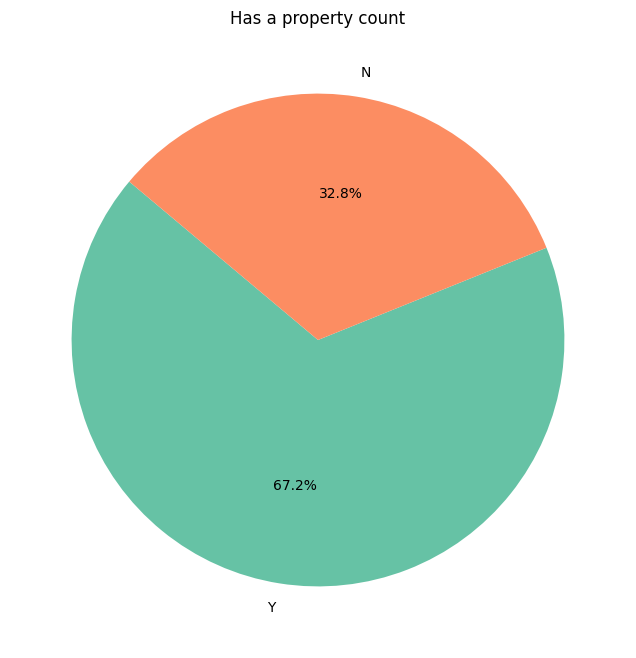

In [23]:
create_pie_chart(app_common, "Has a property")

*Nearly 70% of clients own a property*

## CHILDREN NUMBER

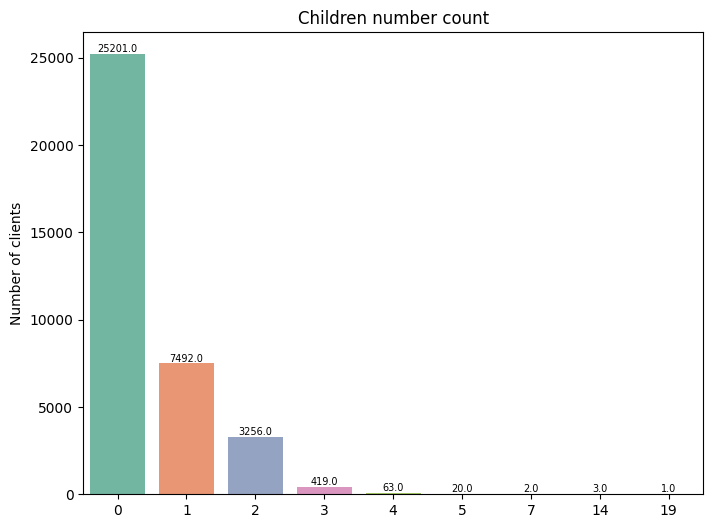

In [24]:
create_bar_plot(app_common, "Children number")

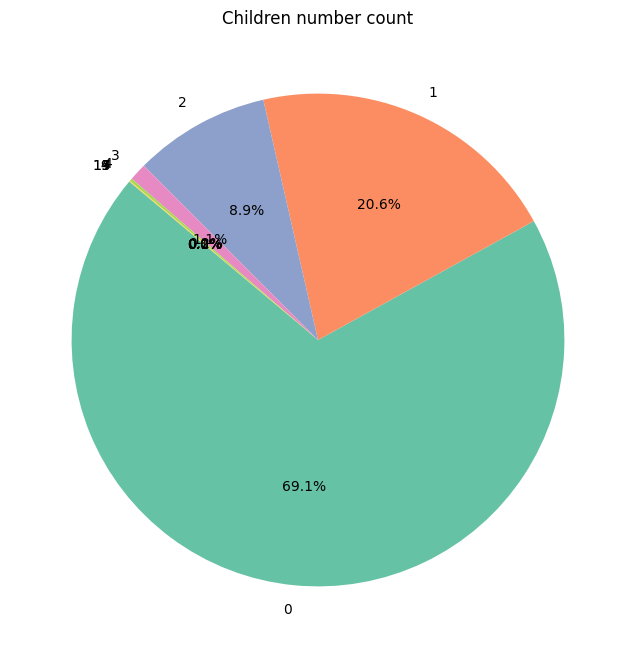

In [25]:
create_pie_chart(app_common, "Children number")

*Vast majority of clients don't have children (69%). That's interesting and coherent with the fact that Japan's population is the world's oldest (mean age of 48 years)*

In [26]:
calculate_stats(app_common, "Children number")

,Statistic,Value
0,Minimum,0.000000
1,Quantile 25%,0.000000
2,Median,0.000000
3,Quantile 75%,1.000000
4,Maximum,19.000000
5,Mean,0.430315
6,Standard Deviation,0.742367
7,Kurtosis,22.562434
8,Skewness,2.569382


## INCOME

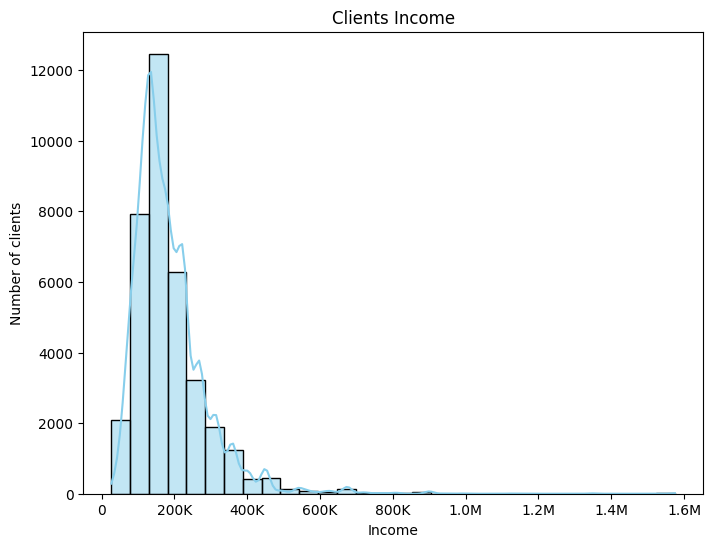

In [27]:
create_hist(app_common, "Income", n_bins=30, norm=False, kde=True, label_sc_annotation=False)

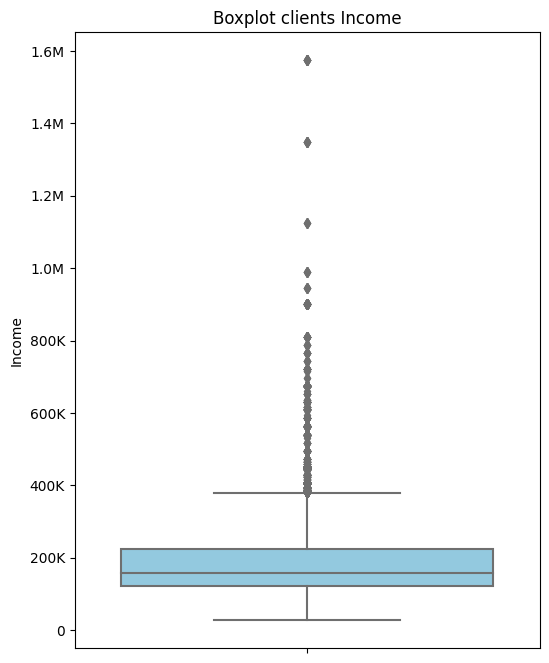

In [28]:
create_boxplot(app_common, "Income")

*Median value is circa 150k, while 3 clients hit an income higher than 1 Million*

In [29]:
calculate_stats(app_common, "Income")

,Statistic,Value
0,Minimum,2.700000e+04
1,Quantile 25%,1.215000e+05
2,Median,1.575000e+05
3,Quantile 75%,2.250000e+05
4,Maximum,1.575000e+06
5,Mean,1.866857e+05
6,Standard Deviation,1.017892e+05
7,Kurtosis,1.759808e+01
8,Skewness,2.739010e+00


## INCOME TYPE

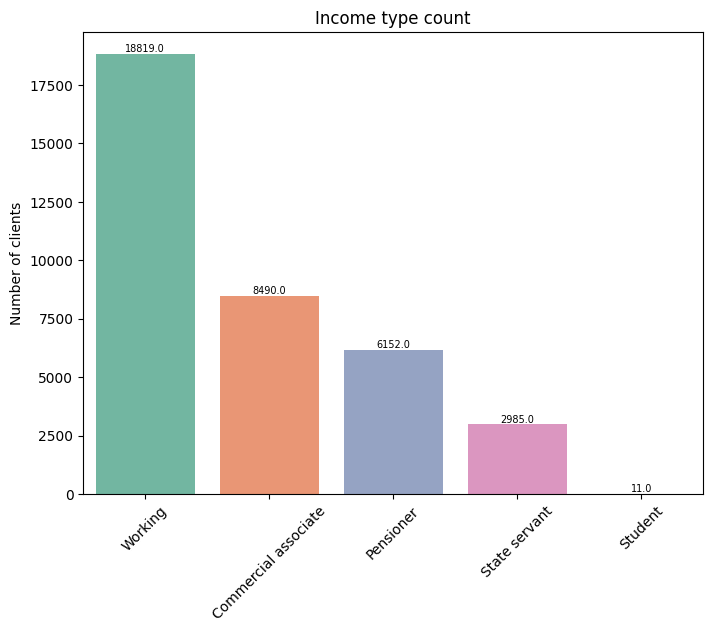

In [30]:
create_bar_plot(app_common, "Income type", xlabel_rotation=45)

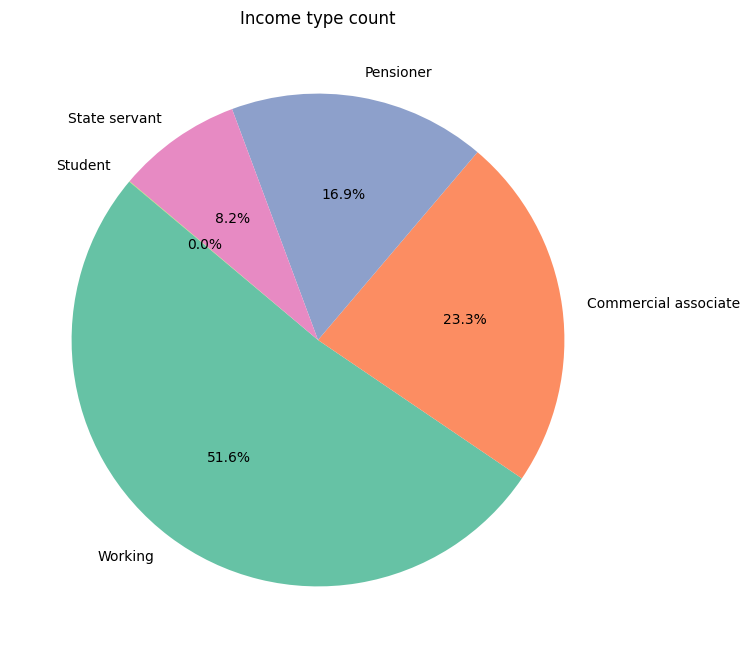

In [31]:
create_pie_chart(app_common, "Income type")

*50% of clients have income through work, 17% are pensioners and there are just 11 students*

In [32]:
app_common[app_common["Income"]>1000000]

,ID,Gender,Has a car,Has a property,Children number,Income,Income type,Education level,Marital status,Dwelling,Age,Employment length,Has a mobile phone,Has a work phone,Has a phone,Has an email,Job title,Family members,Account age
705,5009694,M,Y,N,0,1350000.0,Commercial associate,Higher education,Married,Municipal apartment,-12999,-1560,1,0,1,1,Managers,2.0,45
706,5009695,M,Y,N,0,1350000.0,Commercial associate,Higher education,Married,Municipal apartment,-12999,-1560,1,0,1,1,Managers,2.0,6
707,5009698,M,Y,N,0,1350000.0,Commercial associate,Higher education,Married,Municipal apartment,-12999,-1560,1,0,1,1,Managers,2.0,27
708,5009699,M,Y,N,0,1350000.0,Commercial associate,Higher education,Married,Municipal apartment,-12999,-1560,1,0,1,1,Managers,2.0,27
709,5009700,M,Y,N,0,1350000.0,Commercial associate,Higher education,Married,Municipal apartment,-12999,-1560,1,0,1,1,Managers,2.0,8
710,5090752,M,Y,N,0,1350000.0,Commercial associate,Higher education,Married,Municipal apartment,-12999,-1560,1,0,1,1,Managers,2.0,27
5041,5025201,M,Y,N,0,1125000.0,Commercial associate,Secondary / secondary special,Married,Rented apartment,-15960,-1646,1,0,0,0,Managers,2.0,33
21584,5090777,F,Y,Y,2,1125000.0,Commercial associate,Higher education,Married,House / apartment,-14339,-2653,1,1,1,0,Managers,4.0,18
26646,5112948,M,Y,Y,1,1125000.0,Working,Higher education,Married,House / apartment,-16616,-1624,1,0,0,0,Managers,3.0,29
33985,5143231,F,Y,Y,1,1575000.0,Commercial associate,Higher education,Single / not married,House / apartment,-10142,-2479,1,0,0,0,Managers,2.0,39


All clients who earn > 1M are managers. It's important to note that some rows have the same data apart from account age: they may be duplicates or simply the same client has more than one account. I won't delete rows not having further information

## EDUCATION LEVEL

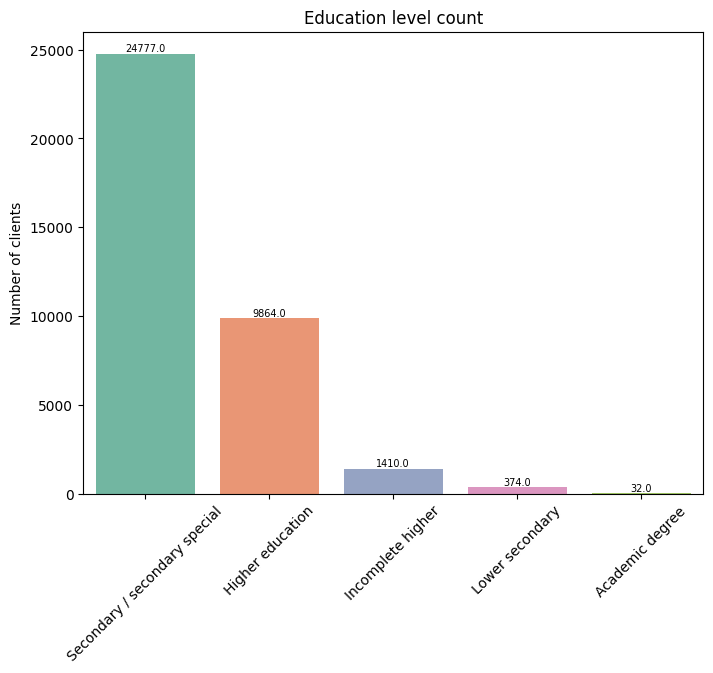

In [33]:
create_bar_plot(app_common, "Education level", xlabel_rotation=45)

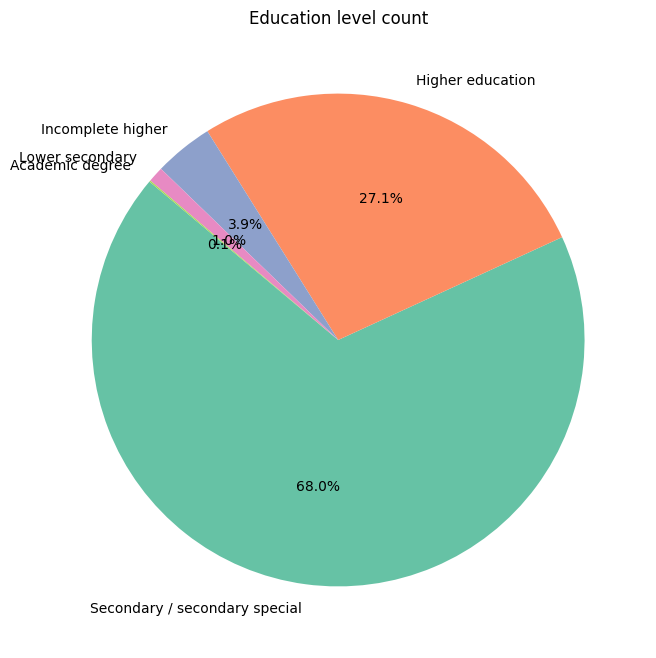

In [34]:
create_pie_chart(app_common, "Education level")

*Nearly 70% of clients have a secondary school education, just 32 clients have an academic degree! That's surprising, just 0.1%!*

## MARITAL STATUS

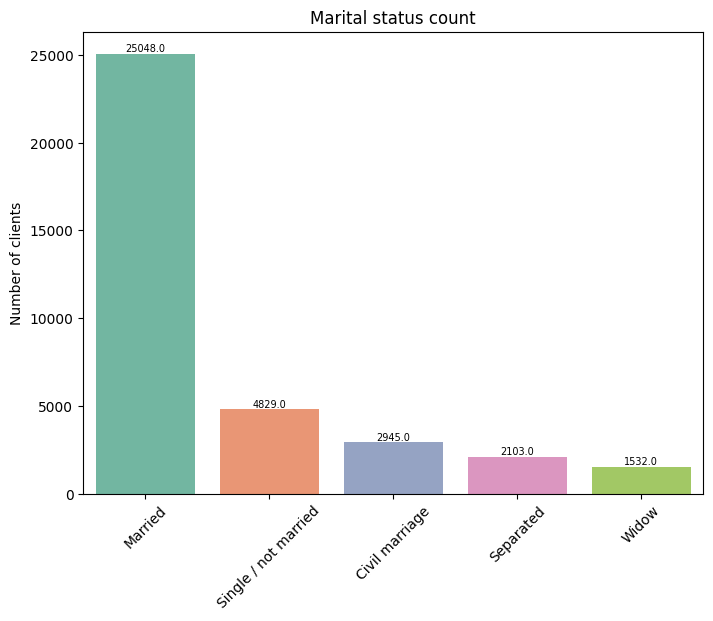

In [35]:
create_bar_plot(app_common, "Marital status", xlabel_rotation=45)

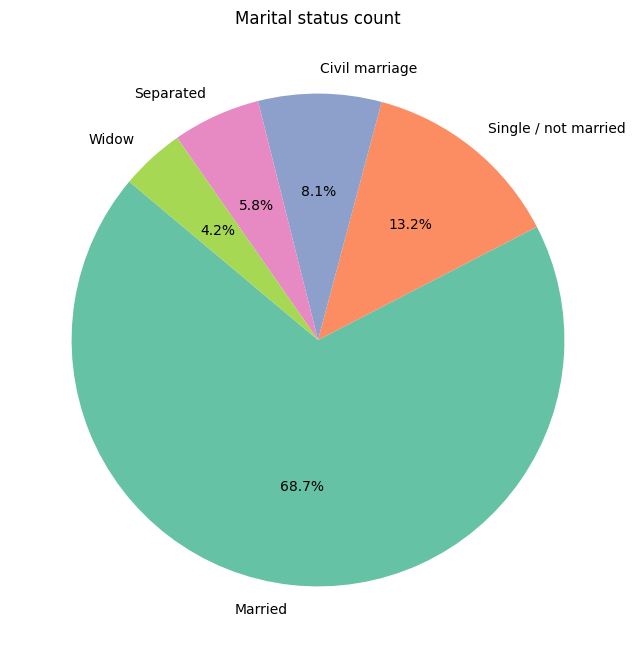

In [36]:
create_pie_chart(app_common, "Marital status")

*Majority of clients are married*

## DWELLING

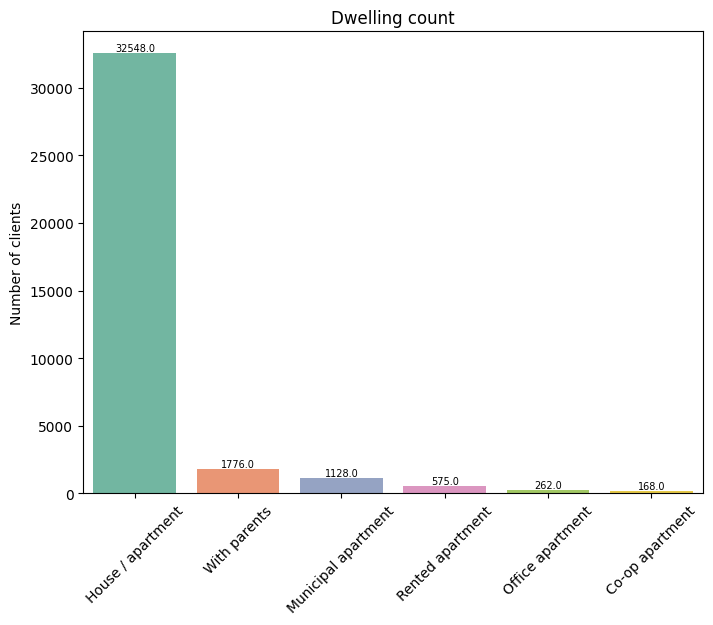

In [37]:
create_bar_plot(app_common, "Dwelling", xlabel_rotation=45)

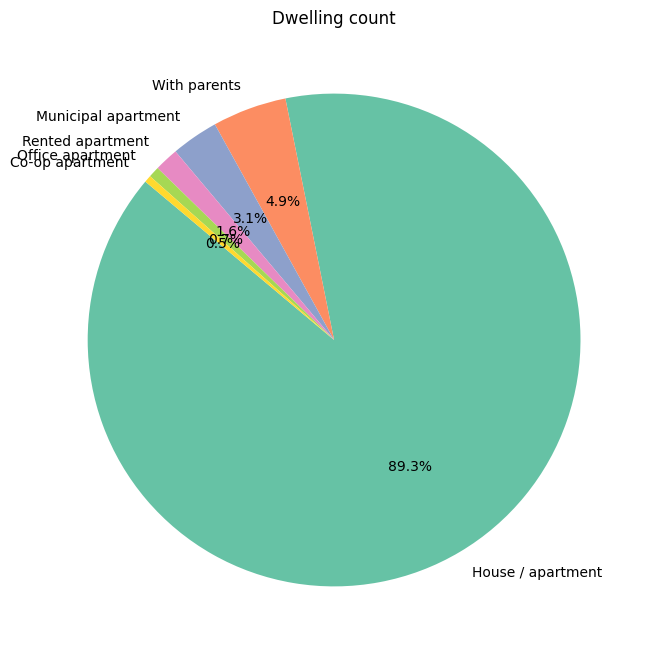

In [38]:
create_pie_chart(app_common, "Dwelling")

*Nearly all clients (90%) live in their house/apartment*

## AGE

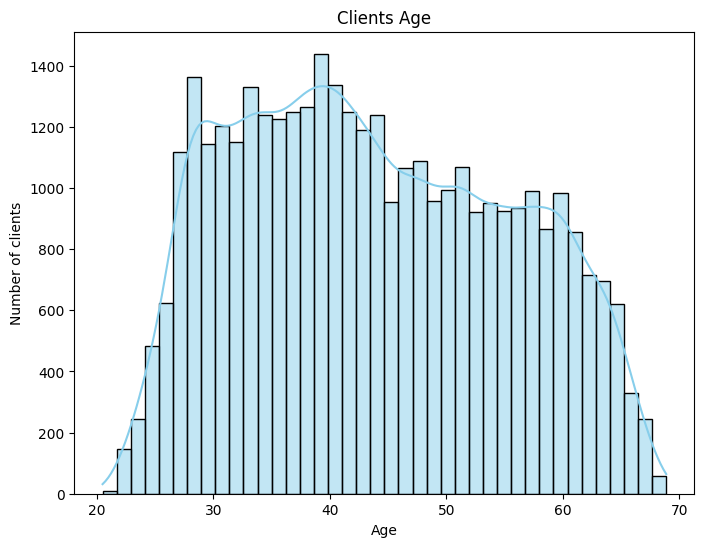

In [39]:
create_hist(app_common, "Age", n_bins=40, norm=True, kde=True)

In [40]:
calculate_stats(app_common, "Age")

,Statistic,Value
0,Minimum,-25152.000000
1,Quantile 25%,-19438.000000
2,Median,-15563.000000
3,Quantile 75%,-12462.000000
4,Maximum,-7489.000000
5,Mean,-15975.173382
6,Standard Deviation,4200.549944
7,Kurtosis,-1.045644
8,Skewness,-0.184230


*Age distribution has a slightly right skewnwess*

## EMPLOYMENT LENGTH

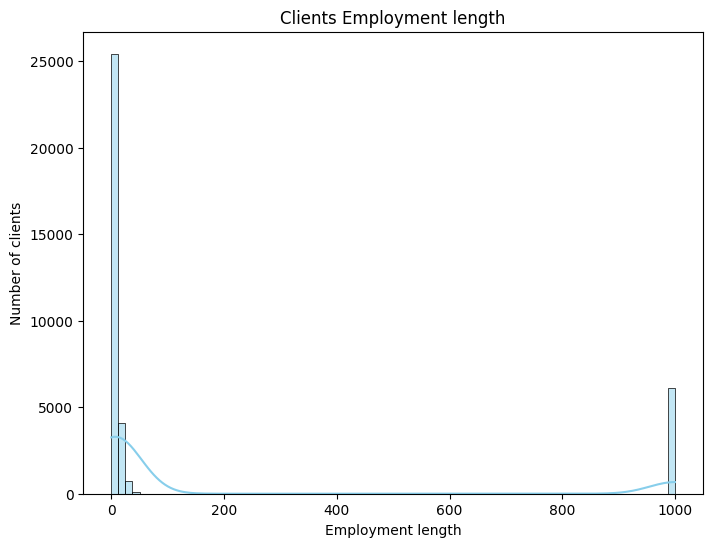

In [41]:
create_hist(app_common, 'Employment length', n_bins=80, norm=True, kde=True)

In [42]:
calculate_stats(app_common, "Employment length")

,Statistic,Value
0,Minimum,-15713.000000
1,Quantile 25%,-3153.000000
2,Median,-1552.000000
3,Quantile 75%,-408.000000
4,Maximum,365243.000000
5,Mean,59262.935568
6,Standard Deviation,137651.334859
7,Kurtosis,1.143399
8,Skewness,1.772443


*Clearly an abnormal value: it will be evaluated in the next paragraph "Abnormal values"*

## HAS A MOBILE PHONE

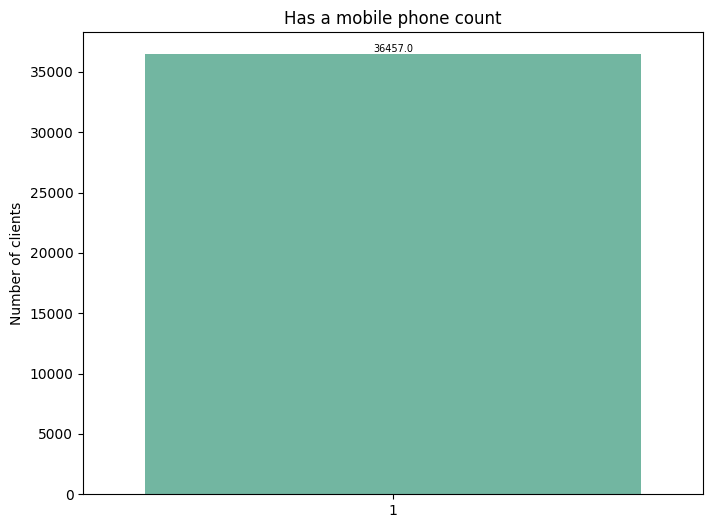

In [43]:
create_bar_plot(app_common, "Has a mobile phone")

## HAS A WORK PHONE

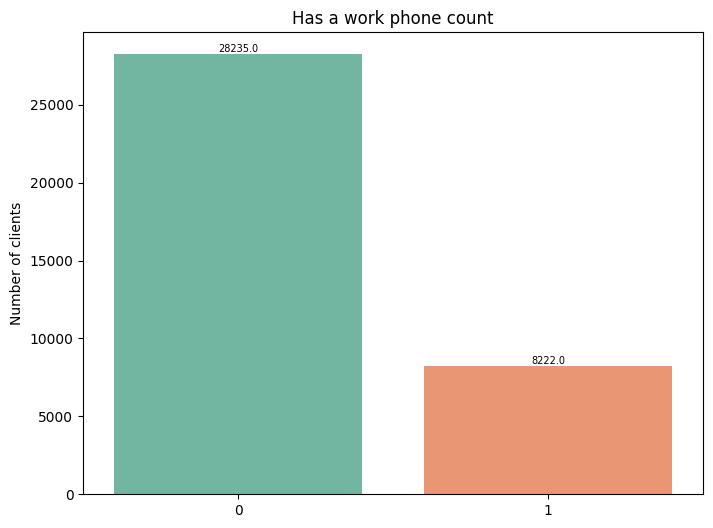

In [44]:
create_bar_plot(app_common, "Has a work phone")

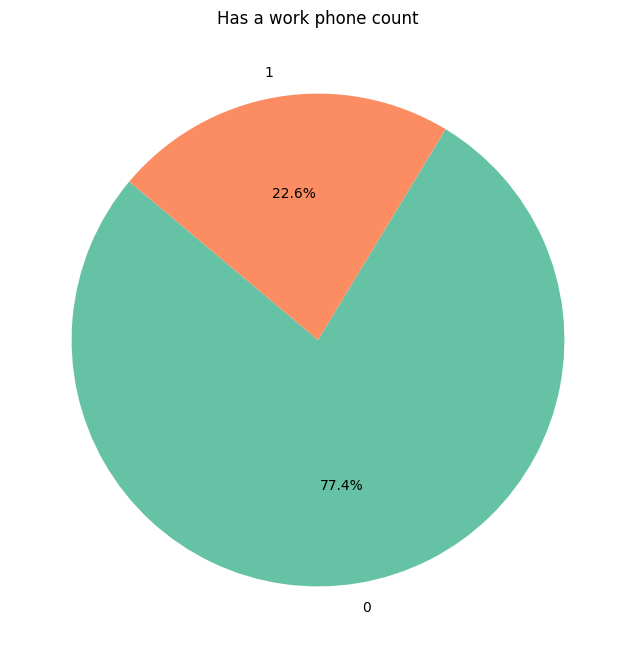

In [45]:
create_pie_chart(app_common, "Has a work phone")

## HAS A PHONE

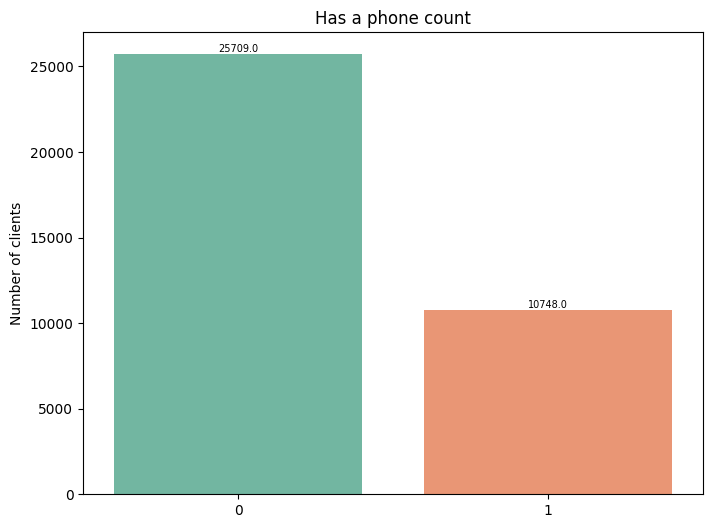

In [46]:
create_bar_plot(app_common, "Has a phone")

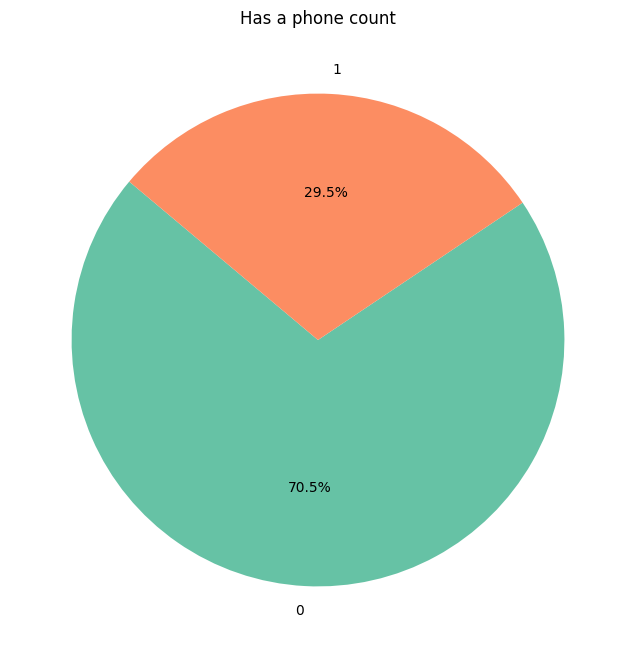

In [47]:
create_pie_chart(app_common, "Has a phone")

## HAS AN EMAIL

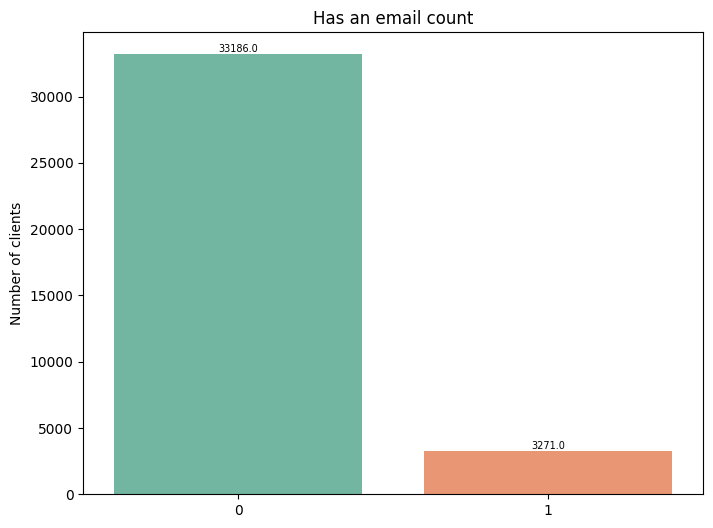

In [48]:
create_bar_plot(app_common, "Has an email")

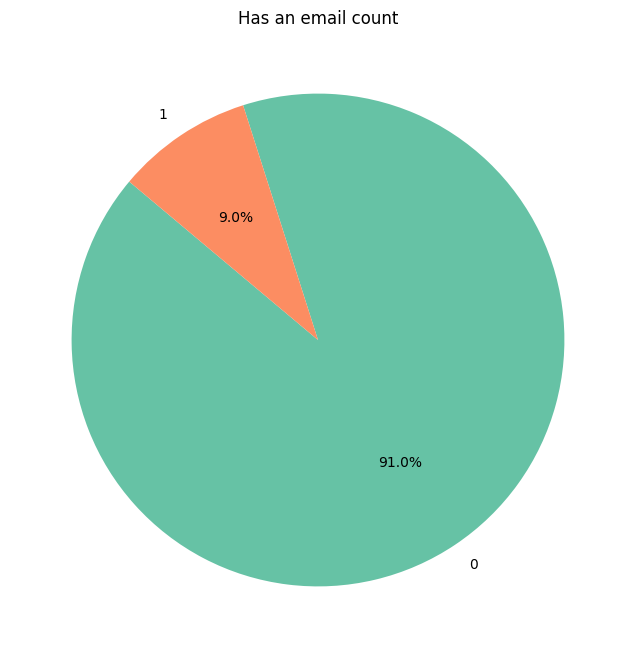

In [49]:
create_pie_chart(app_common, "Has an email")

## JOB TITLE

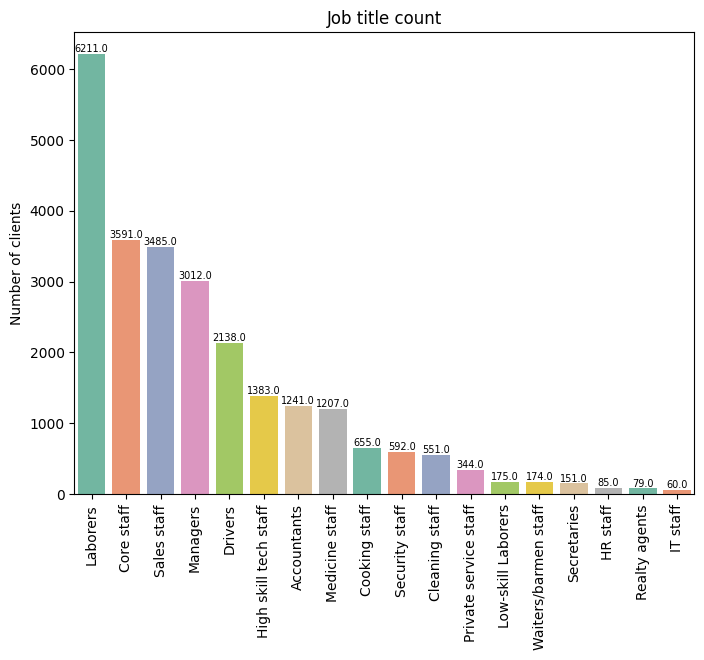

In [50]:
create_bar_plot(app_common, "Job title", xlabel_rotation=90)

## FAMILY MEMBERS

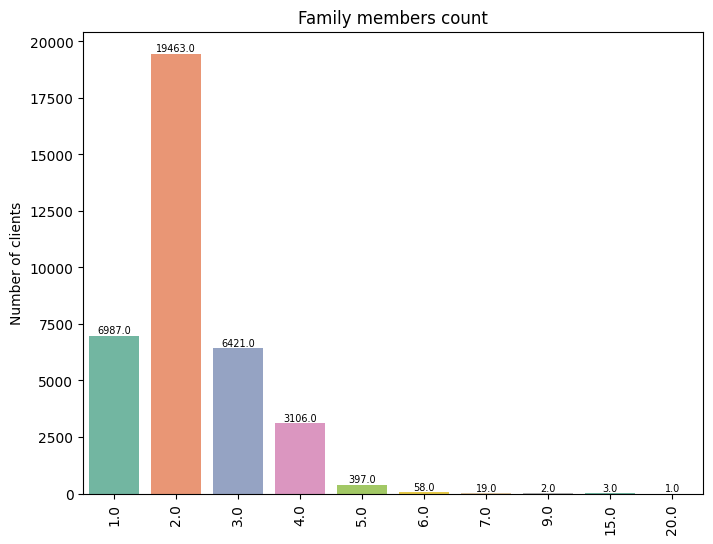

In [51]:
create_bar_plot(app_common, "Family members", xlabel_rotation=90)

## ACCOUNT AGE

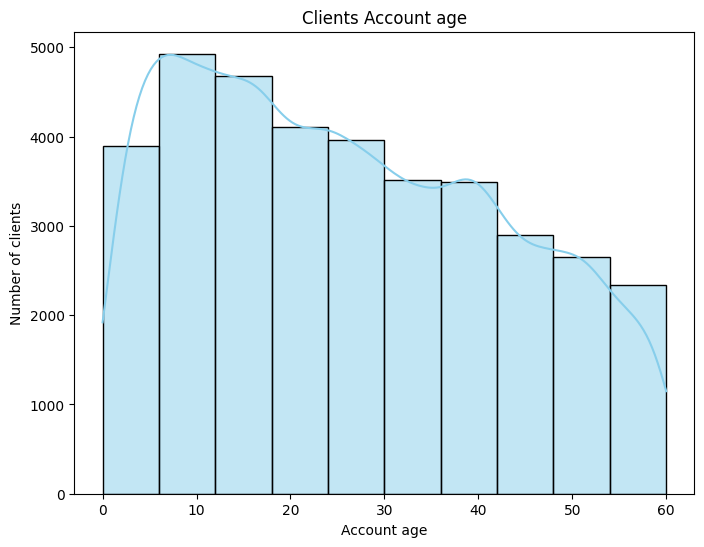

In [52]:
create_hist(app_common, "Account age", n_bins=10, norm=False, kde=True)

In [53]:
calculate_stats(app_common, "Account age")

,Statistic,Value
0,Minimum,0.000000
1,Quantile 25%,12.000000
2,Median,24.000000
3,Quantile 75%,39.000000
4,Maximum,60.000000
5,Mean,26.164193
6,Standard Deviation,16.501854
7,Kurtosis,-1.037762
8,Skewness,0.286395


## ABNORMAL VALUES

In [54]:
app_common.drop(['ID'], axis=1).describe()

,Children number,Income,Age,Employment length,Has a mobile phone,Has a work phone,Has a phone,Has an email,Family members,Account age
count,36457.000000,3.645700e+04,36457.000000,36457.000000,36457.0,36457.000000,36457.000000,36457.000000,36457.000000,36457.000000
mean,0.430315,1.866857e+05,-15975.173382,59262.935568,1.0,0.225526,0.294813,0.089722,2.198453,26.164193
std,0.742367,1.017892e+05,4200.549944,137651.334859,0.0,0.417934,0.455965,0.285787,0.911686,16.501854
min,0.000000,2.700000e+04,-25152.000000,-15713.000000,1.0,0.000000,0.000000,0.000000,1.000000,0.000000
25%,0.000000,1.215000e+05,-19438.000000,-3153.000000,1.0,0.000000,0.000000,0.000000,2.000000,12.000000
50%,0.000000,1.575000e+05,-15563.000000,-1552.000000,1.0,0.000000,0.000000,0.000000,2.000000,24.000000
75%,1.000000,2.250000e+05,-12462.000000,-408.000000,1.0,0.000000,1.000000,0.000000,3.000000,39.000000
max,19.000000,1.575000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000,60.000000


In [55]:
app_common.isna().sum()

ID                        0
Gender                    0
Has a car                 0
Has a property            0
Children number           0
Income                    0
Income type               0
Education level           0
Marital status            0
Dwelling                  0
Age                       0
Employment length         0
Has a mobile phone        0
Has a work phone          0
Has a phone               0
Has an email              0
Job title             11323
Family members            0
Account age               0
dtype: int64

*There's an abnormal max value in "Employment length": it's positive and much bigger than other values and there are several NaN values in "Job title". They could be pensioners, let's check it*

In [56]:
pensioners=app_common[app_common["Income type"]=="Pensioner"]
pensioners_anomaly=pensioners[pensioners["Employment length"]==365243]
len(app_common[app_common["Employment length"]==365243]), len(pensioners_anomaly)

(6135, 6135)

*As we thought, all abnormal values correspond to pensioners*

In [57]:
pensioners_no_anomaly=pensioners[pensioners["Employment length"]!=365243]
len(pensioners), len(pensioners_anomaly), len(pensioners_no_anomaly)

(6152, 6135, 17)

*Pensioners are in total 6152. But as we have just seen, 6135 have an abnormal value of "Employment length". So, there are 17 pensioners who have a non-abnormal negative employment length*

In [58]:
len(pensioners_anomaly), pensioners_anomaly["Job title"].isna().sum(), app_common["Job title"].isna().sum()

(6135, 6135, 11323)

*All rows with the abnormal value (6135) in "Employment length" have NaN in "Job title". Total NaN values are higher (11323): they must be referring to unemployed clients (pensioners are by all effects classifiable as unemployed)*

In [59]:
app_common = app_common.copy()
app_common["Employment length"]=app_common["Employment length"].replace(365243,0)
condition = (app_common['Job title'].isna()) & (app_common['Employment length'] == 0)
app_common.loc[condition, 'Job title'] = 'Pensioners'
app_common=app_common.fillna('Not specified')
app_common.isna().sum()

ID                    0
Gender                0
Has a car             0
Has a property        0
Children number       0
Income                0
Income type           0
Education level       0
Marital status        0
Dwelling              0
Age                   0
Employment length     0
Has a mobile phone    0
Has a work phone      0
Has a phone           0
Has an email          0
Job title             0
Family members        0
Account age           0
dtype: int64

*All abnormal values are put equal to 0 to identify pensioners' employment length. All NaN values in Job title are put equal to "Unemployed"*

# MODELS

*After the EDA, preprocessing is necessary to prepare the data for the training phase. We'll:*


1.   *define the target label since it's not included in the original dataframe;*
2.   *preprocess the data and resampling due to high imbalance with different resampling techniques - SMOTE, RUS, ADASYN, SMOTEENN*


##FUNCTIONS

In [60]:
def preprocess_data(X_train, X_test, categorical_features, resampling_technique):
    # Get Dummies for categorical features
    X_train_dummies = pd.get_dummies(X_train[categorical_features], drop_first=True)
    X_test_dummies = pd.get_dummies(X_test[categorical_features], drop_first=True)

    # Combine numerical and encoded categorical variables
    X_train_combined = pd.concat([X_train.select_dtypes(include=[np.number]), X_train_dummies], axis=1)
    X_test_combined = pd.concat([X_test.select_dtypes(include=[np.number]), X_test_dummies], axis=1)

    # Standard Scaling for all features
    scaler = StandardScaler()
    X_train_preprocessed = scaler.fit_transform(X_train_combined)
    X_test_preprocessed = scaler.transform(X_test_combined)

    # different resampling techniques
    if resampling_technique == 'smote':
        resampler = SMOTE(sampling_strategy='auto', random_state=42)
    elif resampling_technique == 'undersampling':
        resampler = RandomUnderSampler(random_state=42)
    elif resampling_technique == 'adasyn':
        resampler = ADASYN(sampling_strategy='auto', random_state=42)
    elif resampling_technique == 'smoteenn':
        resampler = SMOTEENN(sampling_strategy='auto', random_state=42)
    else:
        raise ValueError("Invalid resampling technique specified. Supported options: 'smote', 'undersampling', 'adasyn', 'smoteenn'")

    X_train_resampled, y_train_resampled = resampler.fit_resample(X_train_preprocessed, y_train)

    # Create DataFrames with feature names for resampled data
    X_train_resampled_df = pd.DataFrame(X_train_resampled, columns=X_train_combined.columns)
    X_test_preprocessed_df = pd.DataFrame(X_test_preprocessed, columns=X_test_combined.columns)

    return X_train_resampled_df, X_test_preprocessed_df, y_train_resampled

In [61]:
def train_model(X_train, y_train, model):

    print(f"Training {model}...")
    start_time = time.time()

    model.fit(X_train, y_train)

    end_time = time.time()
    training_time = end_time - start_time
    print(f"{model} training completed in {training_time:.2f} seconds.")
    print('-------------------------------------------------------------------\n')

    return model

In [62]:
def plot_confusion_matrix(conf_matrix, model_name):
    plt.figure(figsize=(6, 4))
    plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'{model_name} Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(2)
    plt.xticks(tick_marks, ['Negative', 'Positive'])
    plt.yticks(tick_marks, ['Negative', 'Positive'])

    # Add text annotations inside each cell
    for row in range(conf_matrix.shape[0]):
        for col in range(conf_matrix.shape[1]):
            if row == 0 and col == 0:
                plt.text(col, row, f"TN={conf_matrix[row, col]}",
                         horizontalalignment="center", color="white" if conf_matrix[row, col] > conf_matrix.max() / 2 else "black")
            elif row == 0 and col == 1:
                plt.text(col, row, f"FP={conf_matrix[row, col]}",
                         horizontalalignment="center", color="white" if conf_matrix[row, col] > conf_matrix.max() / 2 else "black")
            elif row == 1 and col == 0:
                plt.text(col, row, f"FN={conf_matrix[row, col]}",
                         horizontalalignment="center", color="white" if conf_matrix[row, col] > conf_matrix.max() / 2 else "black")
            elif row == 1 and col == 1:
                plt.text(col, row, f"TP={conf_matrix[row, col]}",
                         horizontalalignment="center", color="white" if conf_matrix[row, col] > conf_matrix.max() / 2 else "black")

    plt.ylabel('True Labels')
    plt.xlabel('Predicted Labels')
    plt.tight_layout()
    plt.show()

In [63]:
def plot_roc_curve(fpr, tpr, roc_auc, model_name):
    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name}')
    plt.legend(loc="lower right")
    plt.show()
    print('\n')

In [64]:
def plot_f1_score(model_names, f1_scores):
    plt.figure(figsize=(6, 4))
    plt.bar(model_names, f1_scores)
    plt.xlabel('Model')
    plt.ylabel('F1-Score')
    plt.title('F1-Scores for Different Models')
    plt.xticks(rotation=45, ha='right')
    plt.show()

In [65]:
def fine_tune_model(model, param_grid, X_train, y_train, scoring, n_iter=10, cv=3, random_state=42):
    """
    Fine-tunes a machine learning model using RandomizedSearchCV.

    Parameters:
        model (estimator): The machine learning model to be fine-tuned.
        param_grid (dict): The parameter grid for RandomizedSearchCV.
        X_train (array-like): Training data features.
        y_train (array-like): Training data labels.
        scoring (str): The scoring metric to optimize.
        n_iter (int, optional): Number of iterations for RandomizedSearchCV. Default is 10.
        cv (int, optional): Number of cross-validation folds. Default is 3.
        random_state (int, optional): Random state for reproducibility. Default is 42.

    Returns:
        best_model (estimator): The best estimator found during fine-tuning.
    """
    random_search = RandomizedSearchCV(model, param_distributions=param_grid, n_iter=n_iter, scoring=scoring, cv=cv, random_state=random_state)
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_
    return best_model

In [66]:
# Define the custom scoring function using f-beta score
def custom_scoring(y_true, y_pred):
    return fbeta_score(y_true, y_pred, beta=beta)

## TARGET DEFINITION

*Since we don't have a label target we can try to define one considering the credit report: for each ID client, we have a monthly debts report characterized by the following values:*

*   C --> debt paid of the month;
*   X --> no loan for the month;
*   0 --> 1 - 29 days past due;
*   1 --> 20 - 59 days past due;
*   2 --> 60 - 89 days past due;
*   3 --> 90 - 119 days past due;
*   4 --> 120 - 149 days past due;
*   5 --> Overdue or bad debts, write-offs for more than 150 days

*To C, X, and 0 I decided to attribute 0 penalization, while for the other I assigned an increasing value. Then I made the sum for each client and normalized by the account age.*

*Ultimately I defined the target label Risk, that is 0 for normalized Penalization values lower than a threshold and 1 for the higher ones.*



In [68]:
cred_common = cred_common.assign(Penalization=0)

cred_common.loc[cred_common["STATUS"]=="1", "Penalization"] = 10
cred_common.loc[cred_common["STATUS"]=="2", "Penalization"] = 20
cred_common.loc[cred_common["STATUS"]=="3", "Penalization"] = 30
cred_common.loc[cred_common["STATUS"]=="4", "Penalization"] = 40
cred_common.loc[cred_common["STATUS"]=="5", "Penalization"] = 50

norm_pen=cred_common.groupby(['ID'])['Penalization'].agg("sum")
app_common=pd.merge(app_common, norm_pen, on ="ID")
app_common["Penalization"]=app_common["Penalization"]/app_common["Account age"]

In [69]:
app_common=app_common.fillna(0)
app_common.replace([np.inf, -np.inf], 0, inplace=True)

In [70]:
app_common = app_common.assign(Risk=0)
app_common.loc[app_common["Penalization"] > 2, "Risk"] = 1

In [72]:
app_common.head()

,ID,Gender,Has a car,Has a property,Children number,Income,Income type,Education level,Marital status,Dwelling,...,Employment length,Has a mobile phone,Has a work phone,Has a phone,Has an email,Job title,Family members,Account age,Penalization,Risk
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,-4542,1,1,0,0,Not specified,2.0,15,0.666667,0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,-4542,1,1,0,0,Not specified,2.0,14,0.714286,0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,...,-1134,1,0,0,0,Security staff,2.0,29,0.000000,0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,Sales staff,1.0,4,0.000000,0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,Sales staff,1.0,26,0.000000,0


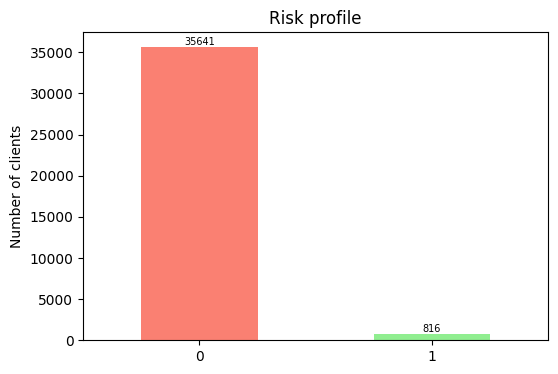

In [73]:
plt.figure(figsize=(6, 4))
ax=app_common["Risk"].value_counts().plot(kind='bar', color=['salmon','lightgreen'])
plt.title(f"Risk profile")
plt.ylabel("Number of clients")
plt.xticks(rotation = 0)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom', fontsize=7)

plt.show()

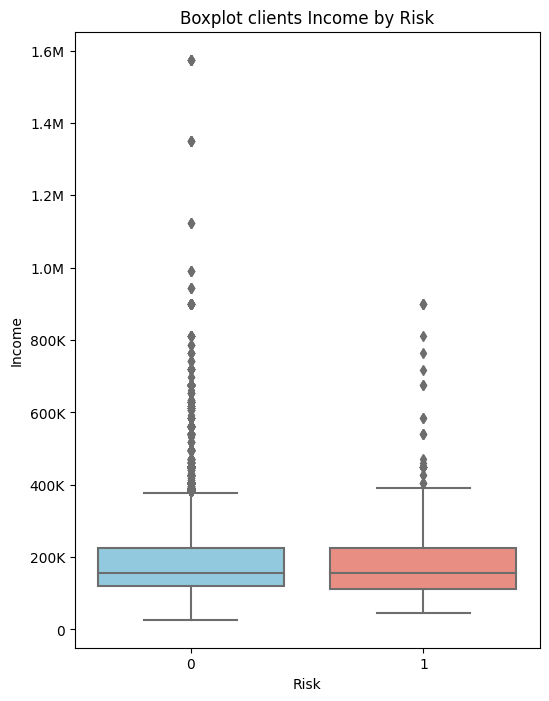

In [74]:
create_boxplot_target(app_common, "Income", "Risk")

In [75]:
# Calculate target class distribution
target_distribution = app_common['Risk'].value_counts(normalize=True)

# Print the target class distribution
print("Target Class Distribution:")
print(target_distribution)

Target Class Distribution:
0    0.977617
1    0.022383
Name: Risk, dtype: float64


*Highly imbalanced dataframe: a sampling technique must be used before training*

## TRAIN TEST SPLIT

In [76]:
X = app_common.drop('Risk', axis=1)
y = app_common['Risk']

In [77]:
# stratify to have a balanced division of positive targets on train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

## PREPROCESS TECHNIQUE: SMOTE

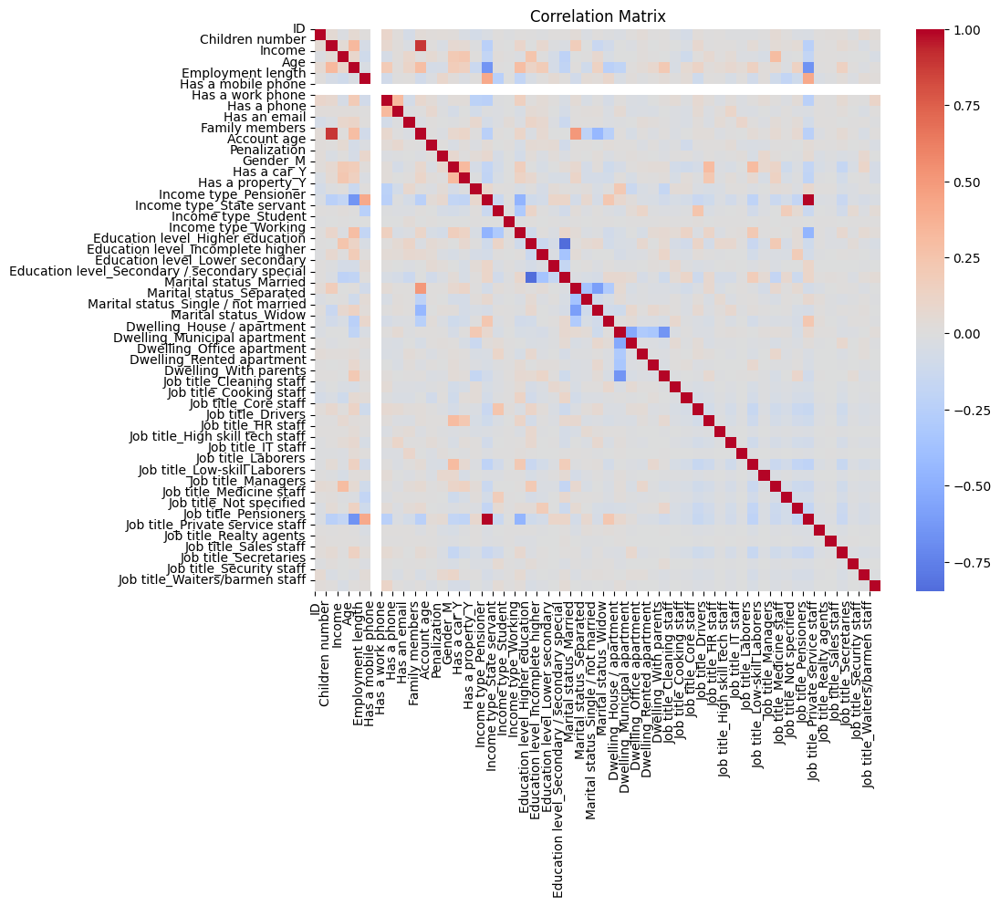

In [100]:
# Preprocess data
categorical_features = X.select_dtypes(include=['object']).columns.tolist()
X_train_resampled, X_test_preprocessed, y_train_resampled = preprocess_data(X_train, X_test, categorical_features, resampling_technique='smote')

# calculate correlation matrix
corr_matrix = X_train_resampled.corr()
feature_names = X_train_resampled.columns
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0)
plt.title(f'Correlation Matrix')
plt.xticks(ticks=range(len(feature_names)), labels=feature_names, rotation=90)
plt.yticks(ticks=range(len(feature_names)), labels=feature_names, rotation=0)
plt.show()

### FEATURES CORRELATION

*Drop features 'Penalization' and 'Account age' (used to calculate target label Risk), 'ID' (it doesn't give any information) and 'Has a mobile phone' (100% of clients has one so it's not useful)*

In [101]:
X_train_resampled=X_train_resampled.drop(['Penalization','ID', 'Has a mobile phone', 'Account age'], axis=1)
X_test_preprocessed=X_test_preprocessed.drop(['Penalization','ID', 'Has a mobile phone', 'Account age'], axis=1)

*From the correlation matrix we can also see that some features have high multicollinearity with each others. Let's drop them for both X_train and X_test*

In [102]:
X_train_resampled=X_train_resampled.drop(['Children number', 'Job title_Pensioners', 'Education level_Higher education',
                                          'Income type_Pensioner', 'Dwelling_With parents'], axis=1)
X_test_preprocessed=X_test_preprocessed.drop(['Children number', 'Job title_Pensioners', 'Education level_Higher education',
                                          'Income type_Pensioner', 'Dwelling_With parents'], axis=1)

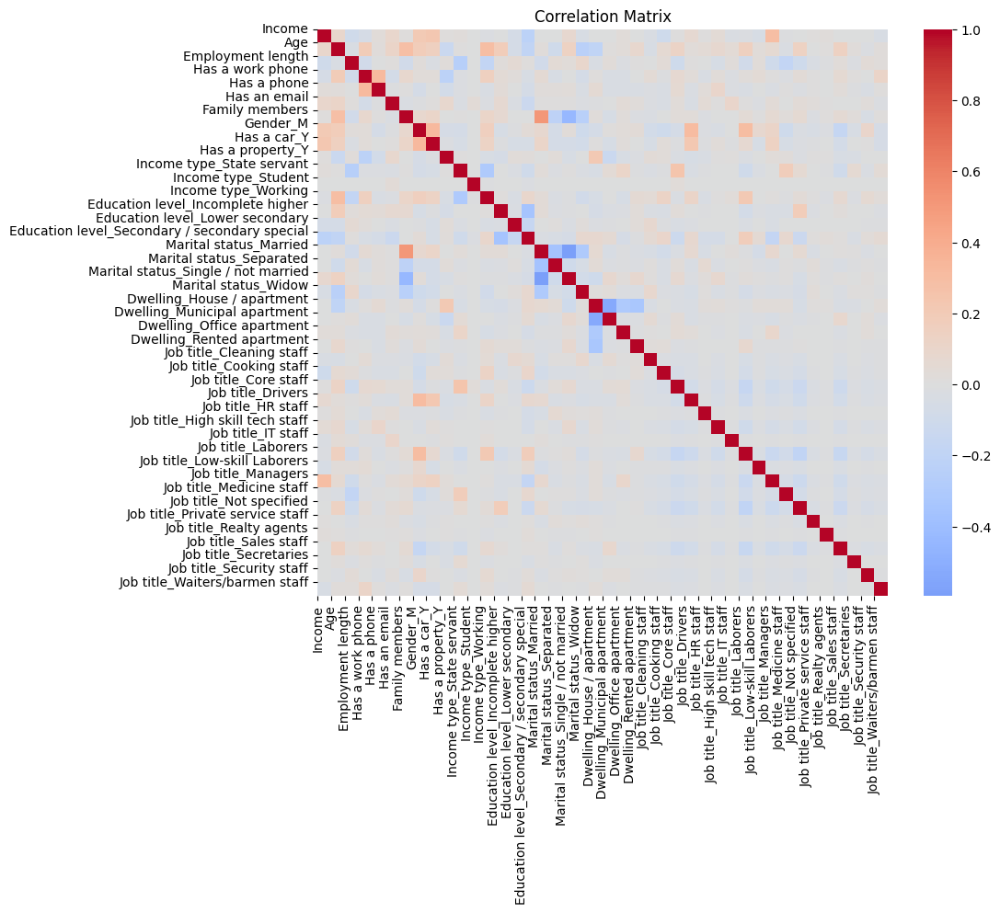

In [103]:
corr_matrix = X_train_resampled.corr()
feature_names = X_train_resampled.columns
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0)
plt.title(f'Correlation Matrix')
plt.xticks(ticks=range(len(feature_names)), labels=feature_names, rotation=90)
plt.yticks(ticks=range(len(feature_names)), labels=feature_names, rotation=0)
plt.show()

In [104]:
y_train_resampled.value_counts(normalize=True) # performed resampling on training set, train target is balanced

0    0.5
1    0.5
Name: Risk, dtype: float64

### TRAINING AND TESTING

*We consider some classifiers: Logistic Regression, Decision Tree, Random Forest, SGD, KNN, Gradient Boostind and XGBoost and fine tune them to find their best hyperparameters*

#### CASE A: FINE TUNING (F1 SCORE) - CLASS WEIGHTS FIXED TO 'BALANCED', WHERE FEASIBLE

*We fine tune the hyperparamters considering balanced class weights where possibile. The scoring for fine tuning is f1 (armonic mena between precision and recall)*

In [105]:
# Dictionary of models and their corresponding hyperparameter grids for RandomizedSearchCV
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001, class_weight='balanced'), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs']
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42, class_weight='balanced'), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0, class_weight='balanced'), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3]
    }),
    'SGD': (SGDClassifier(random_state=42, class_weight='balanced', loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0]
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0]
    })

}

In [106]:
# Initialize an empty DataFrame to store the evaluation metrics
evaluation_df_SMOTE = pd.DataFrame(columns=['Model Name', 'Class Weights', 'Scoring Parameter', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])

Fine-tuning Logistic Regression...
Training LogisticRegression(C=1, class_weight='balanced', max_iter=1000, random_state=42,
                   tol=0.001)...
LogisticRegression(C=1, class_weight='balanced', max_iter=1000, random_state=42,
                   tol=0.001) training completed in 0.49 seconds.
-------------------------------------------------------------------



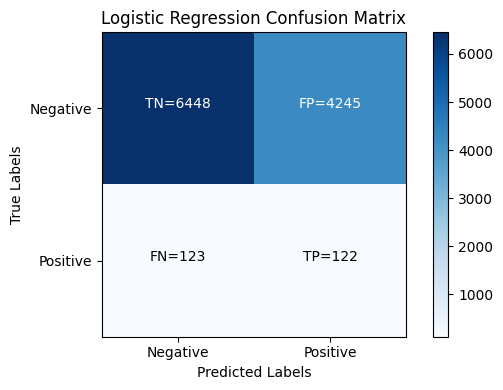


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.60      0.75     10693
           1       0.03      0.50      0.05       245

    accuracy                           0.60     10938
   macro avg       0.50      0.55      0.40     10938
weighted avg       0.96      0.60      0.73     10938



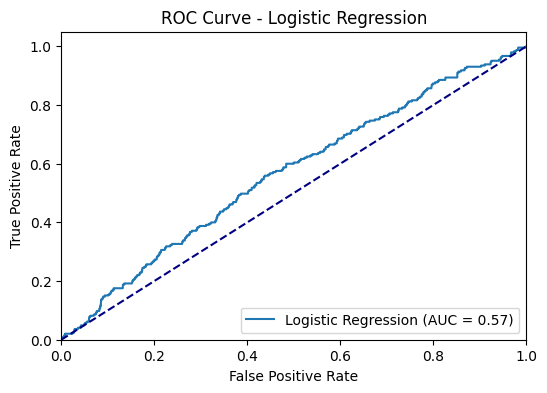



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42)...
DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42) training completed in 0.34 seconds.
-------------------------------------------------------------------



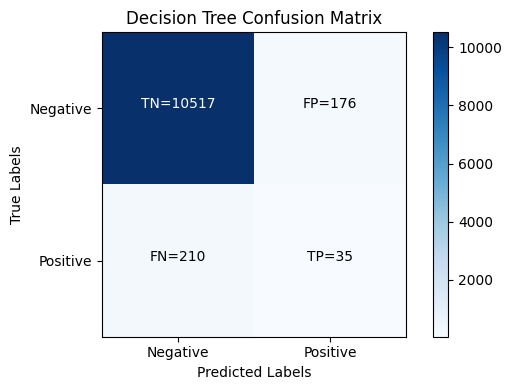


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.17      0.14      0.15       245

    accuracy                           0.96     10938
   macro avg       0.57      0.56      0.57     10938
weighted avg       0.96      0.96      0.96     10938



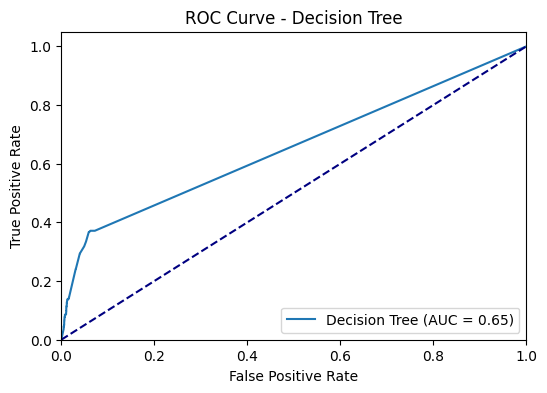



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(class_weight='balanced', max_features='log2',
                       min_samples_split=5, random_state=42)...
RandomForestClassifier(class_weight='balanced', max_features='log2',
                       min_samples_split=5, random_state=42) training completed in 5.00 seconds.
-------------------------------------------------------------------



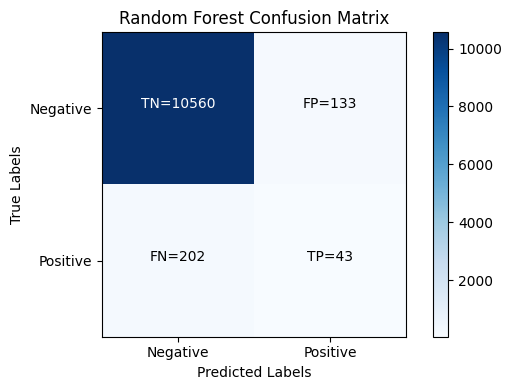


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.24      0.18      0.20       245

    accuracy                           0.97     10938
   macro avg       0.61      0.58      0.59     10938
weighted avg       0.96      0.97      0.97     10938



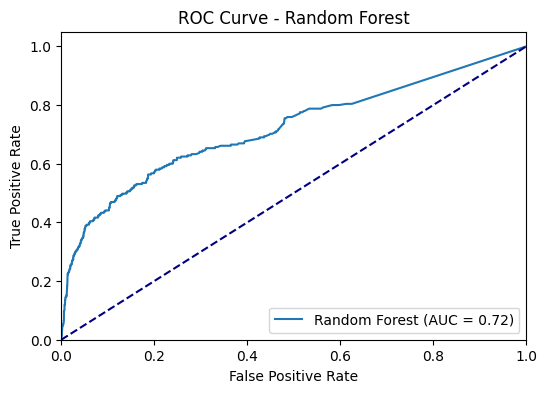



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight='balanced', loss='log', random_state=42)...
SGDClassifier(alpha=0.01, class_weight='balanced', loss='log', random_state=42) training completed in 0.14 seconds.
-------------------------------------------------------------------



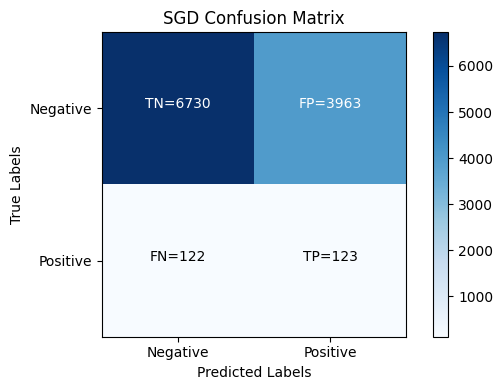


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.98      0.63      0.77     10693
           1       0.03      0.50      0.06       245

    accuracy                           0.63     10938
   macro avg       0.51      0.57      0.41     10938
weighted avg       0.96      0.63      0.75     10938



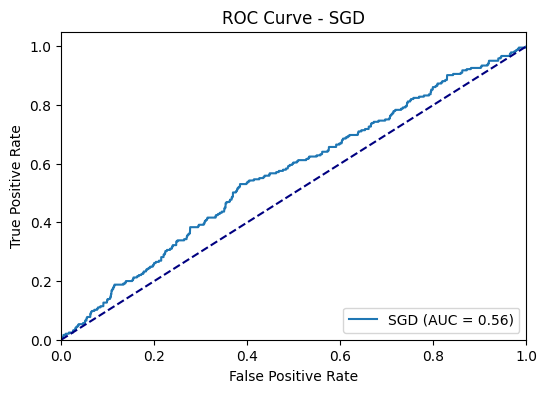



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance')...
KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance') training completed in 0.01 seconds.
-------------------------------------------------------------------



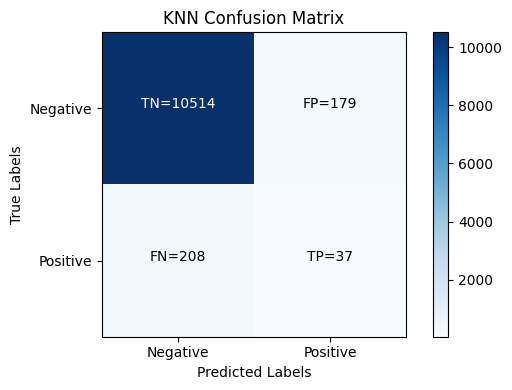


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.17      0.15      0.16       245

    accuracy                           0.96     10938
   macro avg       0.58      0.57      0.57     10938
weighted avg       0.96      0.96      0.96     10938



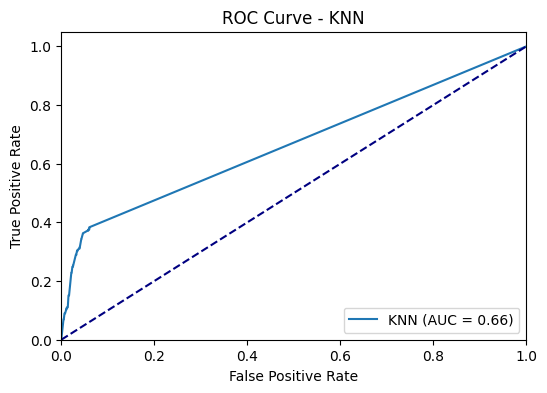



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)...
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8) training completed in 38.03 seconds.
-------------------------------------------------------------------



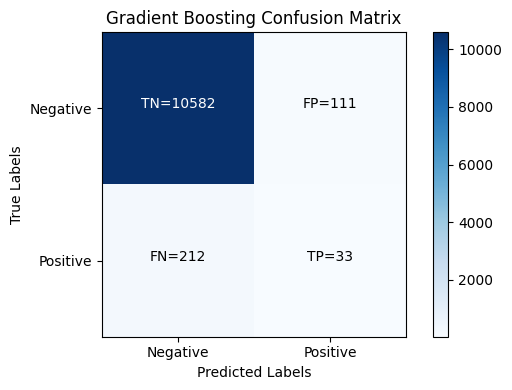


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.23      0.13      0.17       245

    accuracy                           0.97     10938
   macro avg       0.60      0.56      0.58     10938
weighted avg       0.96      0.97      0.97     10938



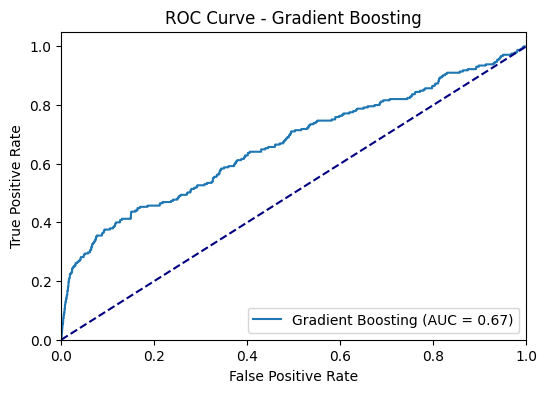



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

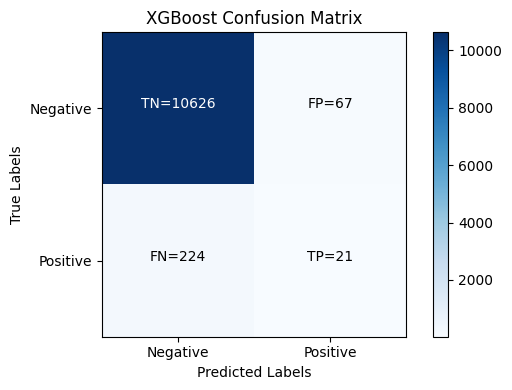


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     10693
           1       0.24      0.09      0.13       245

    accuracy                           0.97     10938
   macro avg       0.61      0.54      0.56     10938
weighted avg       0.96      0.97      0.97     10938



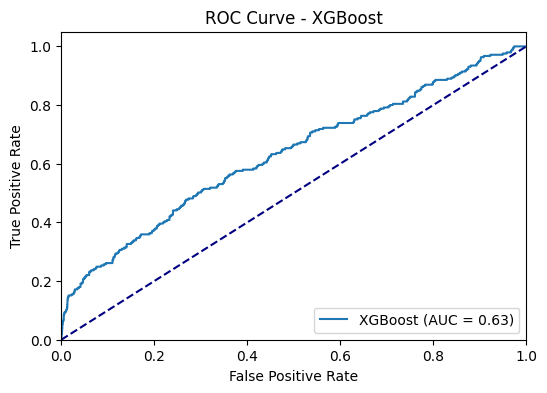



XGBoost finished.
___________________________________________________________________



In [107]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring='f1')

    used_scoring = 'f1'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_SMOTE = evaluation_df_SMOTE.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_SMOTE = evaluation_df_SMOTE.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [108]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_SMOTE.to_csv('model_evaluation_metrics_SMOTE.csv', index=False)
evaluation_df_SMOTE

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.600658,0.027937,0.497959,0.052905
1,Decision Tree,balanced,f1,0.964710,0.165877,0.142857,0.153509
2,Random Forest,balanced,f1,0.969373,0.244318,0.175510,0.204276
3,SGD,balanced,f1,0.626531,0.030103,0.502041,0.056800
4,KNN,None,f1,0.964619,0.171296,0.151020,0.160521
5,Gradient Boosting,None,f1,0.970470,0.229167,0.134694,0.169666
6,XGBoost,None,f1,0.973396,0.238636,0.085714,0.126126


#### CASE B: FINE TUNING (F1 SCORE) - INCLUDING CLASS WEIGHTS, WHERE FEASIBLE

*We fine tune the hyperparamters including class weights: the dataframe is highly imbalanced so a heavier weight on positive target label may be better. The scoring for fine tuning is f1 (armonic mena between precision and recall)*

In [109]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

Fine-tuning Logistic Regression...
Training LogisticRegression(C=10, class_weight='balanced', max_iter=1000,
                   random_state=42, solver='liblinear', tol=0.001)...
LogisticRegression(C=10, class_weight='balanced', max_iter=1000,
                   random_state=42, solver='liblinear', tol=0.001) training completed in 0.35 seconds.
-------------------------------------------------------------------



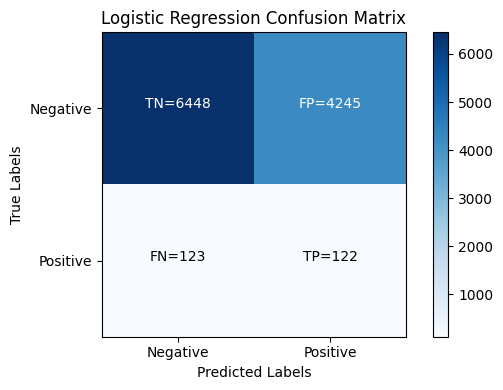


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.60      0.75     10693
           1       0.03      0.50      0.05       245

    accuracy                           0.60     10938
   macro avg       0.50      0.55      0.40     10938
weighted avg       0.96      0.60      0.73     10938



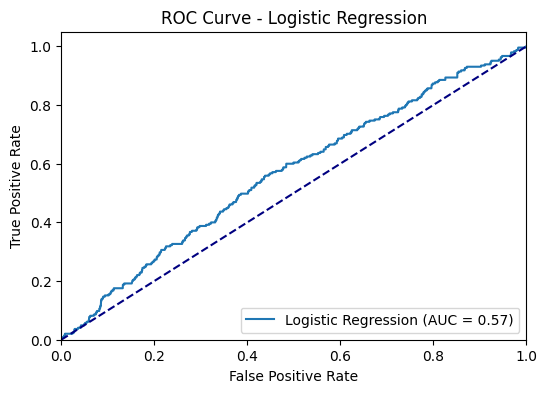



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42)...
DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42) training completed in 0.33 seconds.
-------------------------------------------------------------------



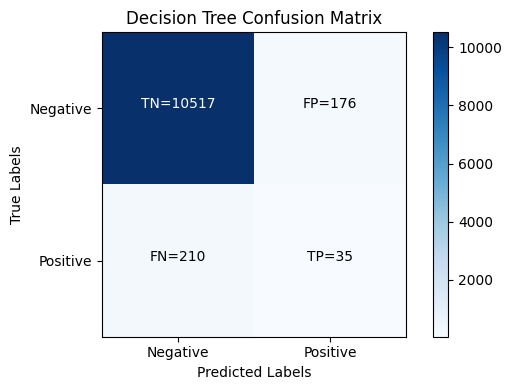


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.17      0.14      0.15       245

    accuracy                           0.96     10938
   macro avg       0.57      0.56      0.57     10938
weighted avg       0.96      0.96      0.96     10938



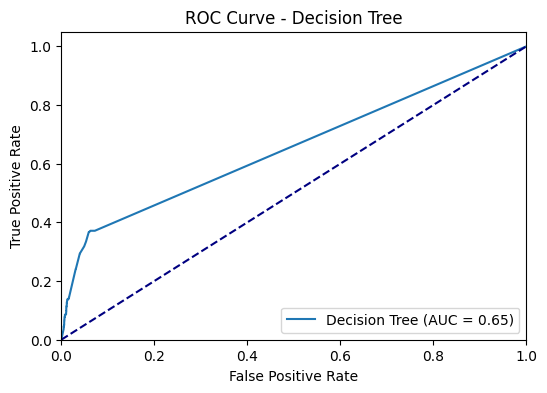



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_features='log2', n_estimators=200, random_state=42)...
RandomForestClassifier(max_features='log2', n_estimators=200, random_state=42) training completed in 10.34 seconds.
-------------------------------------------------------------------



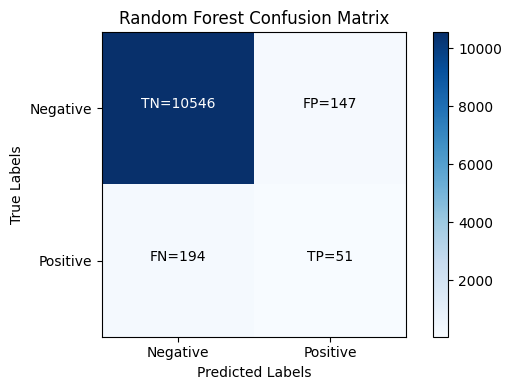


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.26      0.21      0.23       245

    accuracy                           0.97     10938
   macro avg       0.62      0.60      0.61     10938
weighted avg       0.97      0.97      0.97     10938



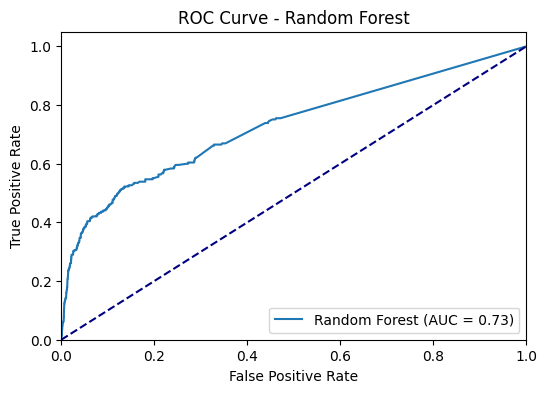



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log',
              random_state=42) training completed in 0.16 seconds.
-------------------------------------------------------------------



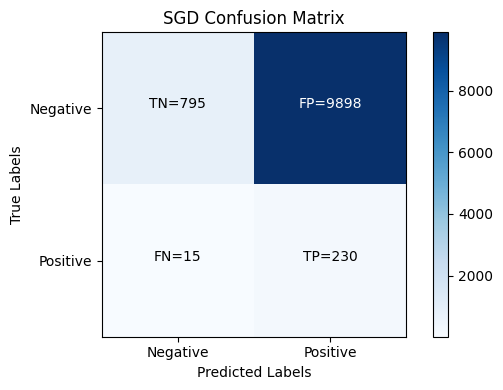


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.98      0.07      0.14     10693
           1       0.02      0.94      0.04       245

    accuracy                           0.09     10938
   macro avg       0.50      0.51      0.09     10938
weighted avg       0.96      0.09      0.14     10938



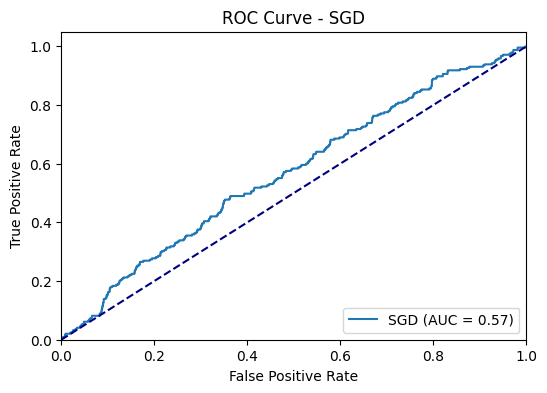



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance')...
KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance') training completed in 0.01 seconds.
-------------------------------------------------------------------



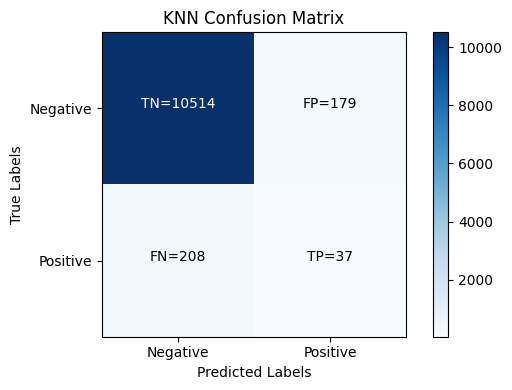


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.17      0.15      0.16       245

    accuracy                           0.96     10938
   macro avg       0.58      0.57      0.57     10938
weighted avg       0.96      0.96      0.96     10938



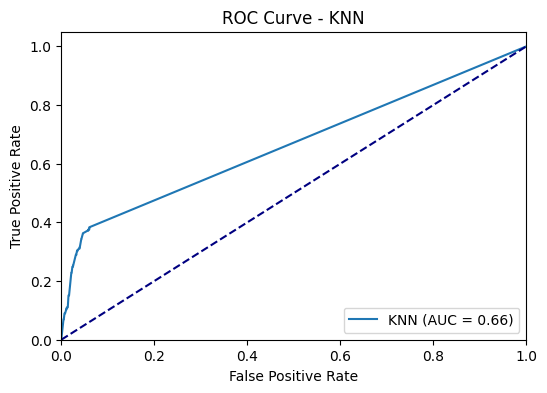



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)...
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8) training completed in 38.16 seconds.
-------------------------------------------------------------------



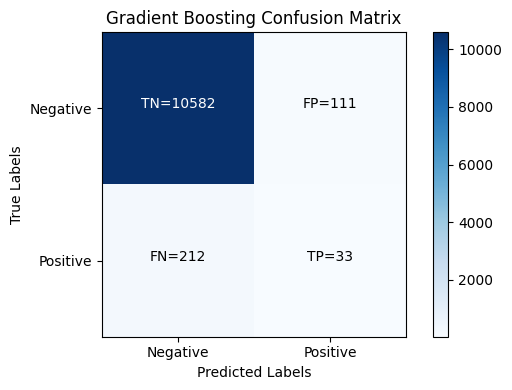


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.23      0.13      0.17       245

    accuracy                           0.97     10938
   macro avg       0.60      0.56      0.58     10938
weighted avg       0.96      0.97      0.97     10938



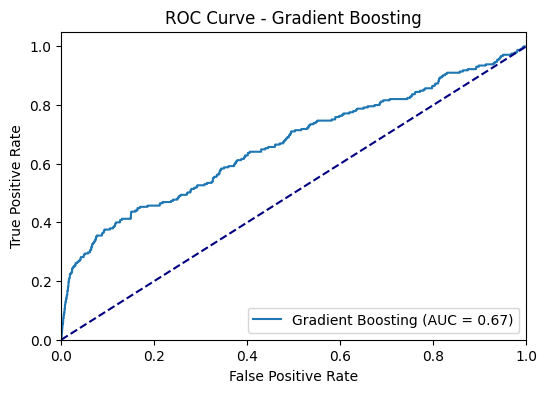



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
     

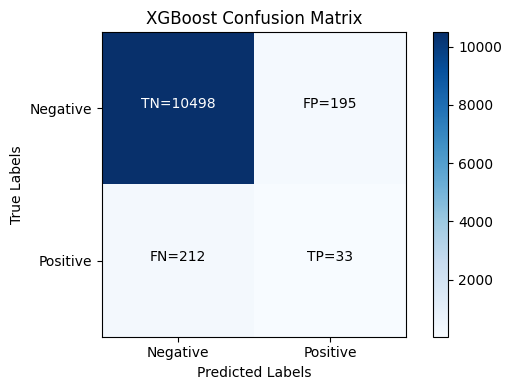


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.14      0.13      0.14       245

    accuracy                           0.96     10938
   macro avg       0.56      0.56      0.56     10938
weighted avg       0.96      0.96      0.96     10938



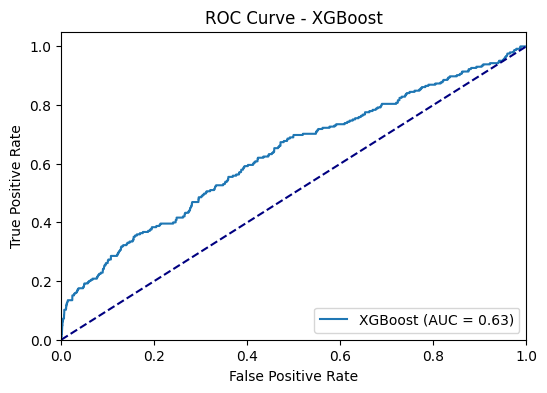



XGBoost finished.
___________________________________________________________________



In [110]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring='f1')

    used_scoring = 'f1'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_SMOTE = evaluation_df_SMOTE.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_SMOTE = evaluation_df_SMOTE.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [111]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_SMOTE.to_csv('model_evaluation_metrics_SMOTE.csv', index=False)
evaluation_df_SMOTE

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.600658,0.027937,0.497959,0.052905
1,Decision Tree,balanced,f1,0.964710,0.165877,0.142857,0.153509
2,Random Forest,balanced,f1,0.969373,0.244318,0.175510,0.204276
3,SGD,balanced,f1,0.626531,0.030103,0.502041,0.056800
4,KNN,None,f1,0.964619,0.171296,0.151020,0.160521
5,Gradient Boosting,None,f1,0.970470,0.229167,0.134694,0.169666
6,XGBoost,None,f1,0.973396,0.238636,0.085714,0.126126
7,Logistic Regression,balanced,f1,0.600658,0.027937,0.497959,0.052905
8,Decision Tree,balanced,f1,0.964710,0.165877,0.142857,0.153509
9,Random Forest,None,f1,0.968824,0.257576,0.208163,0.230248


#### CASE C: FINE TUNING (F2 SCORE) - INCLUDING CLASS WEIGHTS, WHERE FEASIBLE

*Same as case B, but here the scoring for fine tuning is f2: it's like f1, but a higher importance is given to recall. This because we would like to minimize both false positives (to avoid classifying good debtors as high risk clients) and false negatives (to avoid classyfing bad debtors as low risk clients), but for obvious reasons is more important the second scenario*

In [112]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

In [113]:
beta=2.0

# Create a scorer using the custom scoring function
f_beta = make_scorer(custom_scoring, greater_is_better=True)

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.11 seconds.
-------------------------------------------------------------------



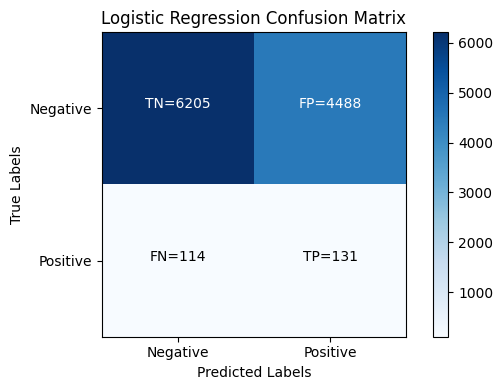


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.58      0.73     10693
           1       0.03      0.53      0.05       245

    accuracy                           0.58     10938
   macro avg       0.51      0.56      0.39     10938
weighted avg       0.96      0.58      0.71     10938



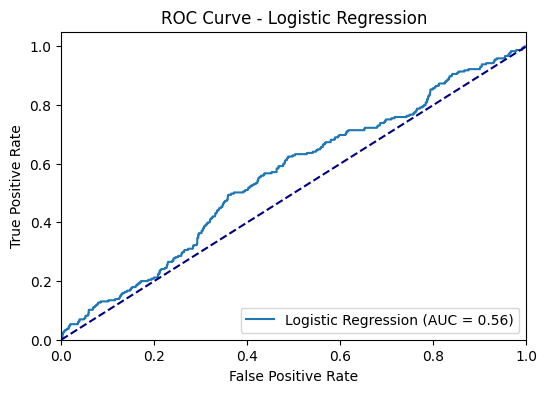



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42)...
DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42) training completed in 0.35 seconds.
-------------------------------------------------------------------



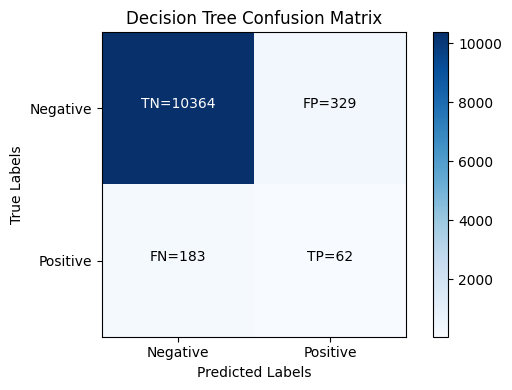


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.97      0.98     10693
           1       0.16      0.25      0.19       245

    accuracy                           0.95     10938
   macro avg       0.57      0.61      0.59     10938
weighted avg       0.96      0.95      0.96     10938



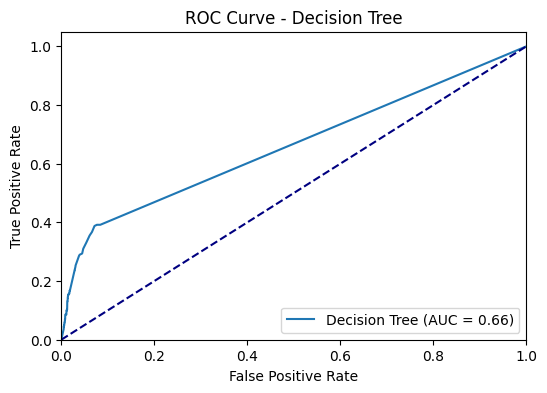



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_depth=10, max_features='log2', random_state=42)...
RandomForestClassifier(max_depth=10, max_features='log2', random_state=42) training completed in 4.12 seconds.
-------------------------------------------------------------------



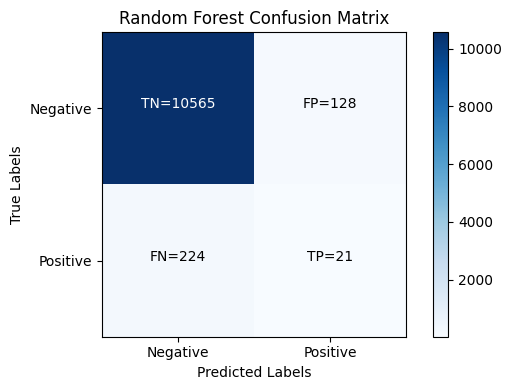


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.14      0.09      0.11       245

    accuracy                           0.97     10938
   macro avg       0.56      0.54      0.55     10938
weighted avg       0.96      0.97      0.96     10938



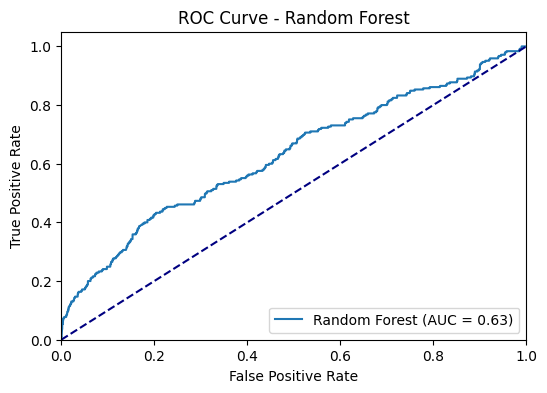



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.23 seconds.
-------------------------------------------------------------------



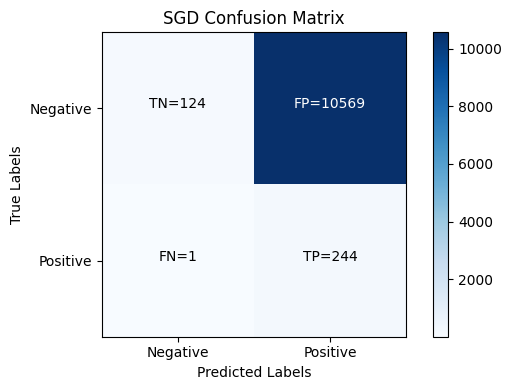


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.99      0.01      0.02     10693
           1       0.02      1.00      0.04       245

    accuracy                           0.03     10938
   macro avg       0.51      0.50      0.03     10938
weighted avg       0.97      0.03      0.02     10938



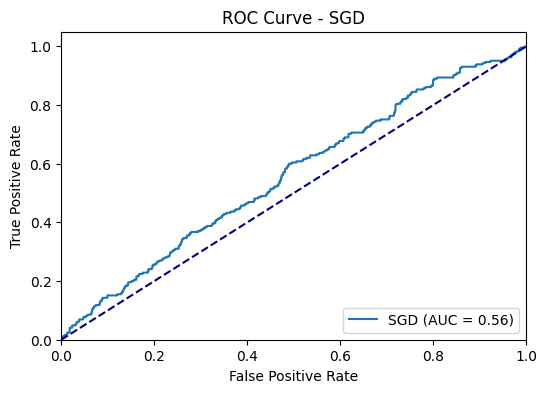



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean')...
KNeighborsClassifier(metric='euclidean') training completed in 0.01 seconds.
-------------------------------------------------------------------



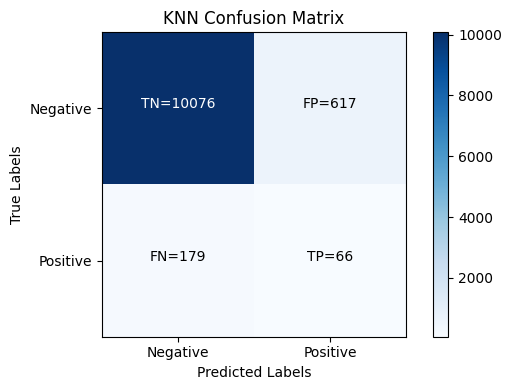


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.94      0.96     10693
           1       0.10      0.27      0.14       245

    accuracy                           0.93     10938
   macro avg       0.54      0.61      0.55     10938
weighted avg       0.96      0.93      0.94     10938



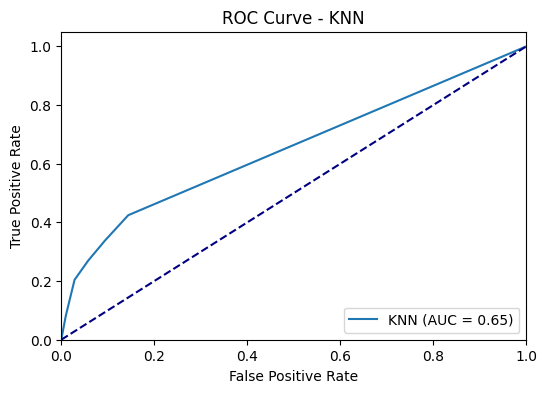



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(n_estimators=50, random_state=42)...
GradientBoostingClassifier(n_estimators=50, random_state=42) training completed in 6.76 seconds.
-------------------------------------------------------------------



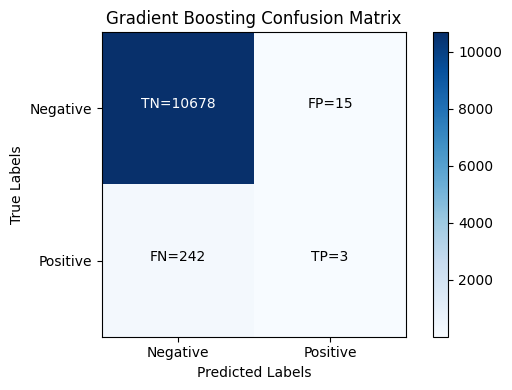


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     10693
           1       0.17      0.01      0.02       245

    accuracy                           0.98     10938
   macro avg       0.57      0.51      0.51     10938
weighted avg       0.96      0.98      0.97     10938



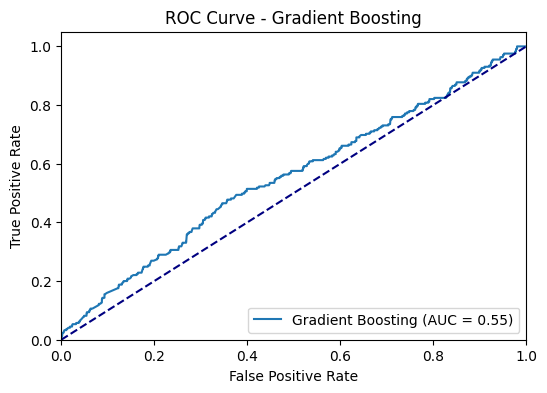



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

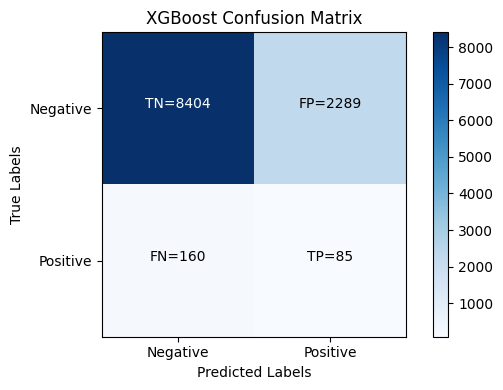


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.79      0.87     10693
           1       0.04      0.35      0.06       245

    accuracy                           0.78     10938
   macro avg       0.51      0.57      0.47     10938
weighted avg       0.96      0.78      0.85     10938



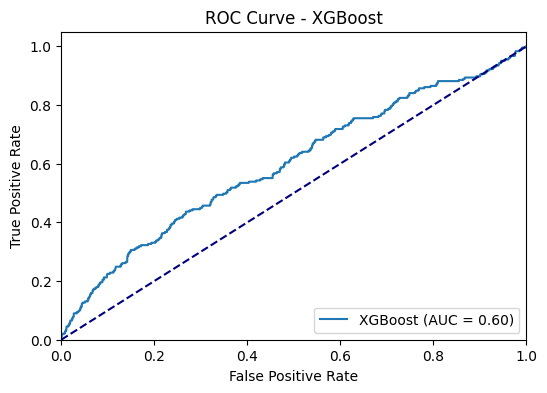



XGBoost finished.
___________________________________________________________________



In [114]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring=f_beta)

    used_scoring = 'f2'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_SMOTE = evaluation_df_SMOTE.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_SMOTE = evaluation_df_SMOTE.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [115]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_SMOTE.to_csv('model_evaluation_metrics_SMOTE.csv', index=False)
evaluation_df_SMOTE

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.600658,0.027937,0.497959,0.052905
1,Decision Tree,balanced,f1,0.964710,0.165877,0.142857,0.153509
2,Random Forest,balanced,f1,0.969373,0.244318,0.175510,0.204276
3,SGD,balanced,f1,0.626531,0.030103,0.502041,0.056800
4,KNN,None,f1,0.964619,0.171296,0.151020,0.160521
5,Gradient Boosting,None,f1,0.970470,0.229167,0.134694,0.169666
6,XGBoost,None,f1,0.973396,0.238636,0.085714,0.126126
7,Logistic Regression,balanced,f1,0.600658,0.027937,0.497959,0.052905
8,Decision Tree,balanced,f1,0.964710,0.165877,0.142857,0.153509
9,Random Forest,None,f1,0.968824,0.257576,0.208163,0.230248


#### CASE D: CASE C + PREVIOUS PCA

*Same as case C, but preliminarly to the training phase a dimensionality reduction through PCA is perfomed: there are many features, reducing the dimensionality and dropping some low correlations may be a good idea to reduce overfitting*

In [116]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

In [117]:
# Apply PCA for dimensionality reduction
num_pca_components = 20
pca = PCA(n_components=num_pca_components)
X_train_resampled_pca = pca.fit_transform(X_train_resampled)
X_test_preprocessed_pca = pca.transform(X_test_preprocessed)

selected_feature_names = [f'PCA_{i+1}' for i in range(X_train_resampled_pca.shape[1])]

X_test_pca_df = pd.DataFrame(X_test_preprocessed_pca, columns=selected_feature_names)

In [118]:
# Add a new column named "PCA" with value "no"
evaluation_df_SMOTE['PCA'] = 'no'

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.04 seconds.
-------------------------------------------------------------------



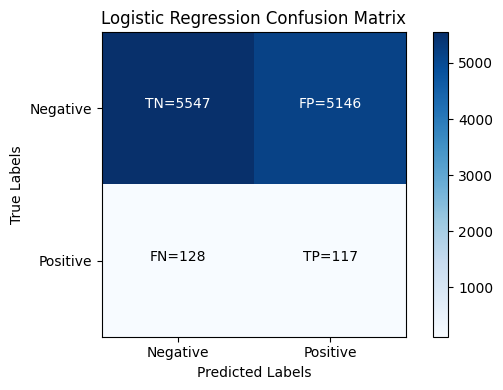


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.52      0.68     10693
           1       0.02      0.48      0.04       245

    accuracy                           0.52     10938
   macro avg       0.50      0.50      0.36     10938
weighted avg       0.96      0.52      0.66     10938



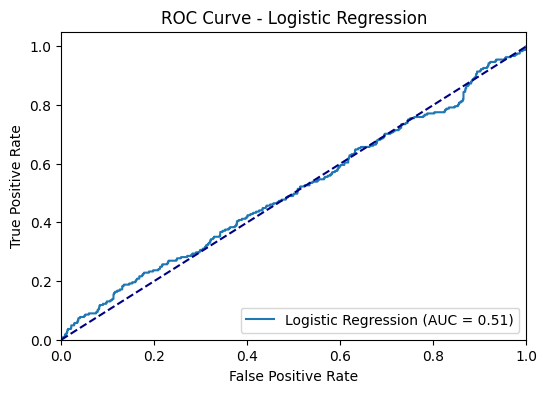



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42)...
DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42) training completed in 2.93 seconds.
-------------------------------------------------------------------



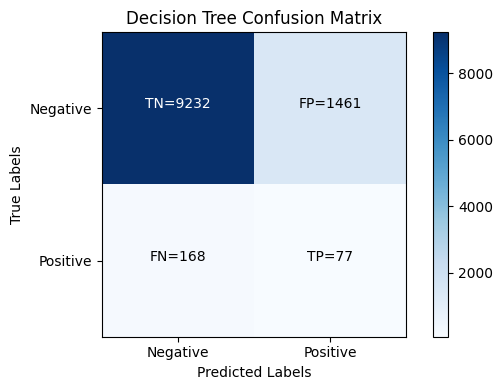


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.86      0.92     10693
           1       0.05      0.31      0.09       245

    accuracy                           0.85     10938
   macro avg       0.52      0.59      0.50     10938
weighted avg       0.96      0.85      0.90     10938



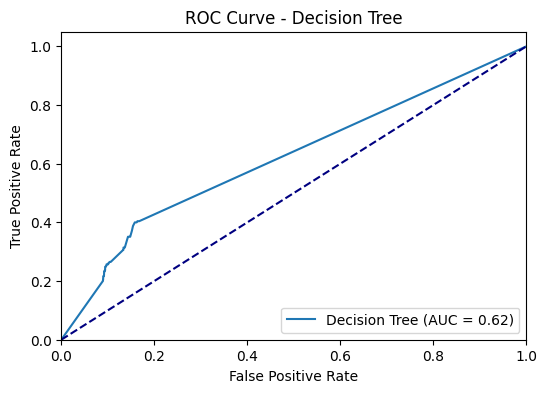



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_depth=10, max_features='log2', random_state=42)...
RandomForestClassifier(max_depth=10, max_features='log2', random_state=42) training completed in 18.20 seconds.
-------------------------------------------------------------------



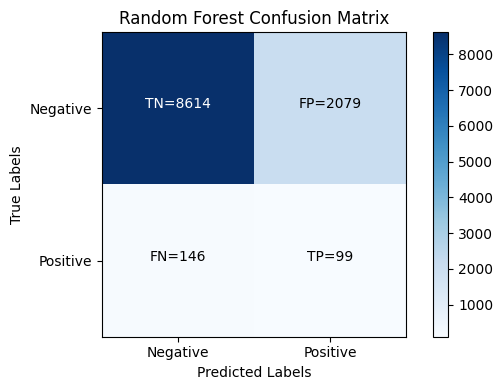


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.81      0.89     10693
           1       0.05      0.40      0.08       245

    accuracy                           0.80     10938
   macro avg       0.51      0.60      0.48     10938
weighted avg       0.96      0.80      0.87     10938



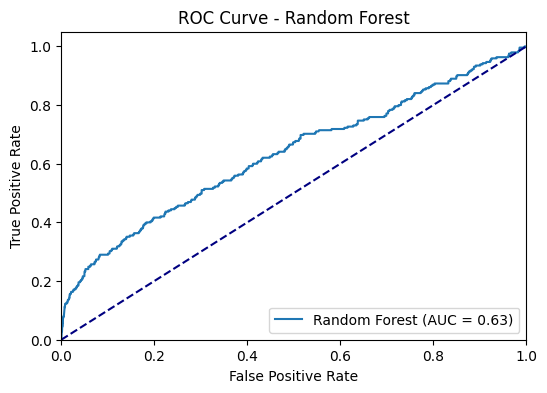



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.15 seconds.
-------------------------------------------------------------------



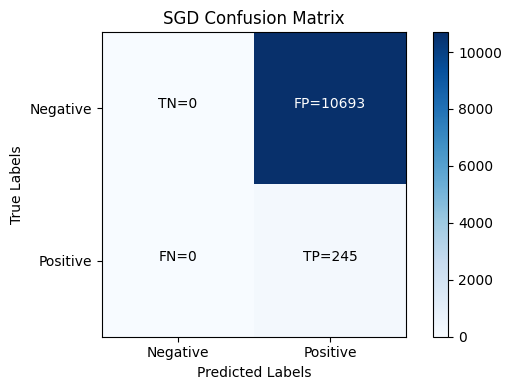


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     10693
           1       0.02      1.00      0.04       245

    accuracy                           0.02     10938
   macro avg       0.01      0.50      0.02     10938
weighted avg       0.00      0.02      0.00     10938



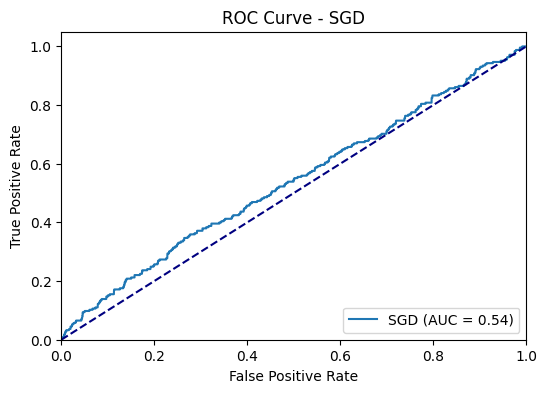



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean')...
KNeighborsClassifier(metric='euclidean') training completed in 0.01 seconds.
-------------------------------------------------------------------



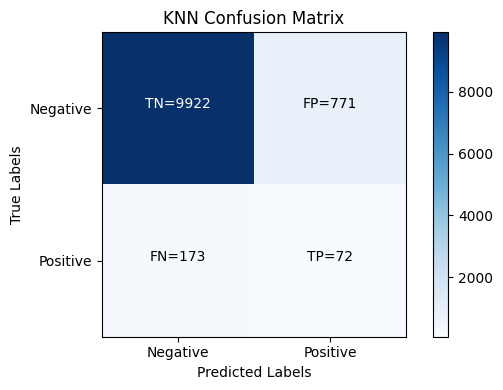


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.93      0.95     10693
           1       0.09      0.29      0.13       245

    accuracy                           0.91     10938
   macro avg       0.53      0.61      0.54     10938
weighted avg       0.96      0.91      0.94     10938



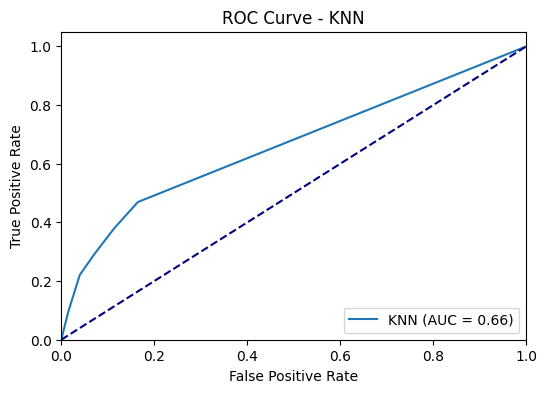



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(n_estimators=50, random_state=42)...
GradientBoostingClassifier(n_estimators=50, random_state=42) training completed in 21.82 seconds.
-------------------------------------------------------------------



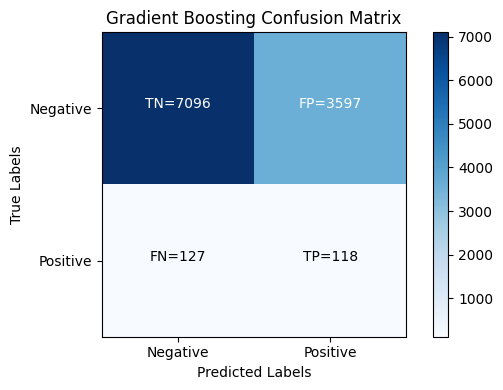


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.66      0.79     10693
           1       0.03      0.48      0.06       245

    accuracy                           0.66     10938
   macro avg       0.51      0.57      0.43     10938
weighted avg       0.96      0.66      0.78     10938



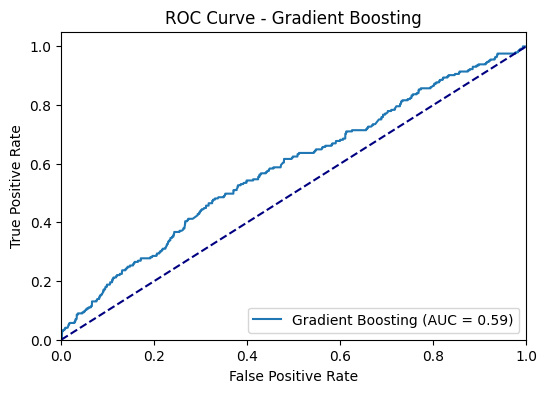



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

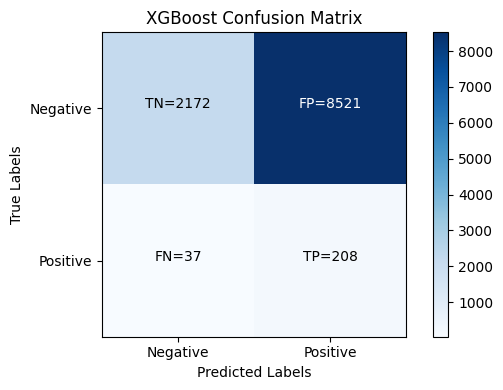


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.20      0.34     10693
           1       0.02      0.85      0.05       245

    accuracy                           0.22     10938
   macro avg       0.50      0.53      0.19     10938
weighted avg       0.96      0.22      0.33     10938



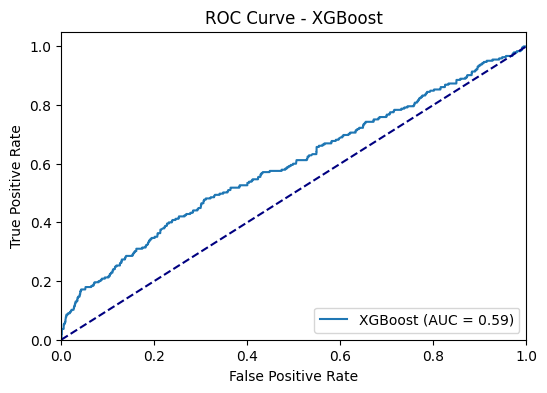



XGBoost finished.
___________________________________________________________________



In [119]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring=f_beta)

    used_scoring = 'f2'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled_pca, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed_pca)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_SMOTE = evaluation_df_SMOTE.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'PCA': 'yes'
        }, ignore_index=True)
    else:
        evaluation_df_SMOTE = evaluation_df_SMOTE.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'PCA': 'yes'
        }, ignore_index=True)

In [120]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_SMOTE.to_csv('model_evaluation_metrics_SMOTE.csv', index=False)
evaluation_df_SMOTE

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score,PCA
0,Logistic Regression,balanced,f1,0.600658,0.027937,0.497959,0.052905,no
1,Decision Tree,balanced,f1,0.964710,0.165877,0.142857,0.153509,no
2,Random Forest,balanced,f1,0.969373,0.244318,0.175510,0.204276,no
3,SGD,balanced,f1,0.626531,0.030103,0.502041,0.056800,no
4,KNN,None,f1,0.964619,0.171296,0.151020,0.160521,no
5,Gradient Boosting,None,f1,0.970470,0.229167,0.134694,0.169666,no
6,XGBoost,None,f1,0.973396,0.238636,0.085714,0.126126,no
7,Logistic Regression,balanced,f1,0.600658,0.027937,0.497959,0.052905,no
8,Decision Tree,balanced,f1,0.964710,0.165877,0.142857,0.153509,no
9,Random Forest,None,f1,0.968824,0.257576,0.208163,0.230248,no


## PREPROCESS TECHNIQUE: RUS

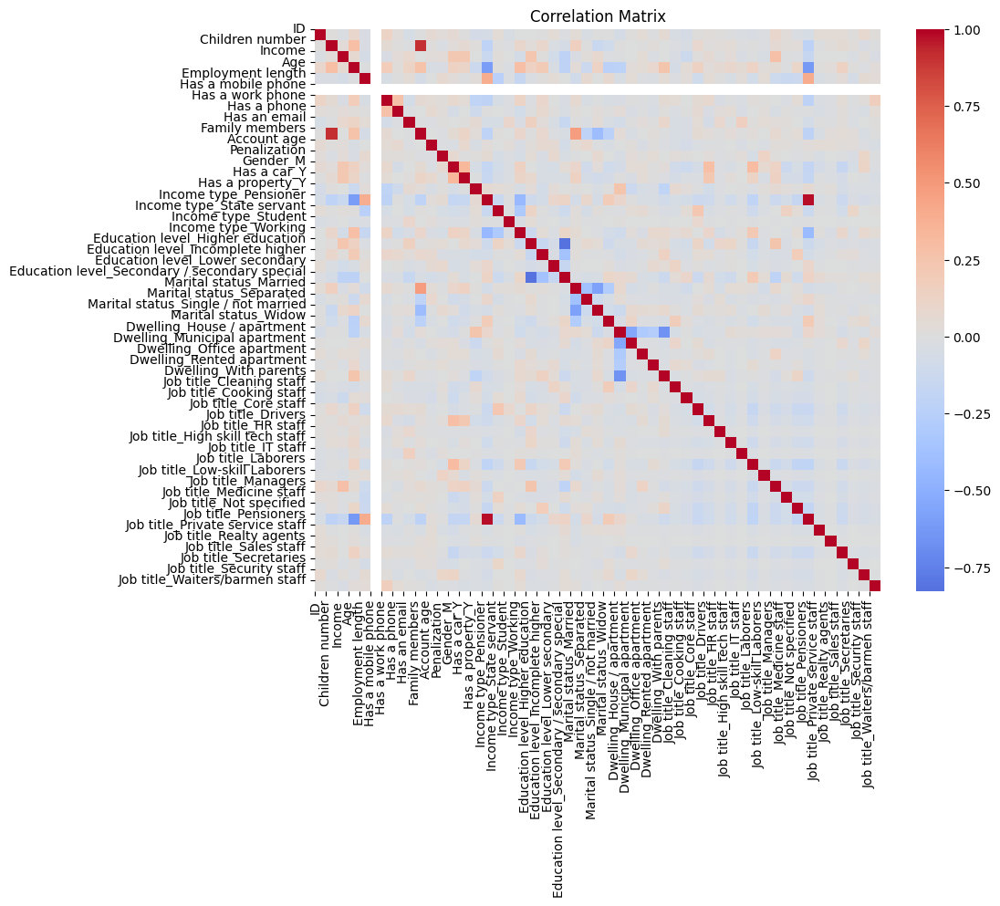

In [121]:
categorical_features = X.select_dtypes(include=['object']).columns.tolist()
X_train_resampled, X_test_preprocessed, y_train_resampled = preprocess_data(X_train, X_test, categorical_features, resampling_technique='undersampling')

corr_matrix = X_train_resampled.corr()
feature_names = X_train_resampled.columns
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0)
plt.title(f'Correlation Matrix')
plt.xticks(ticks=range(len(feature_names)), labels=feature_names, rotation=90)
plt.yticks(ticks=range(len(feature_names)), labels=feature_names, rotation=0)
plt.show()

### FEATURES CORRELATION

In [122]:
X_train_resampled=X_train_resampled.drop(['Penalization','ID', 'Has a mobile phone', 'Account age'], axis=1)
X_test_preprocessed=X_test_preprocessed.drop(['Penalization','ID', 'Has a mobile phone', 'Account age'], axis=1)

In [123]:
X_train_resampled=X_train_resampled.drop(['Children number', 'Job title_Pensioners', 'Education level_Higher education',
                                          'Income type_Pensioner', 'Dwelling_With parents'], axis=1)
X_test_preprocessed=X_test_preprocessed.drop(['Children number', 'Job title_Pensioners', 'Education level_Higher education',
                                          'Income type_Pensioner', 'Dwelling_With parents'], axis=1)

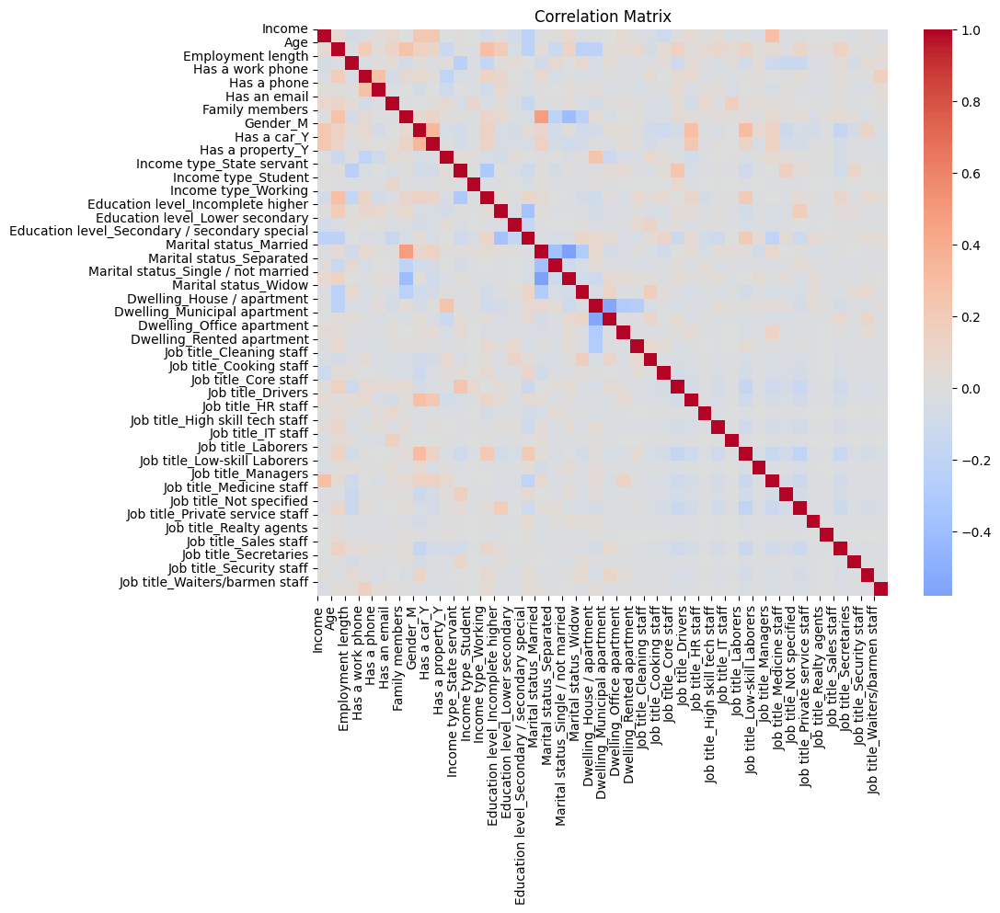

In [124]:
corr_matrix = X_train_resampled.corr()
feature_names = X_train_resampled.columns
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0)
plt.title(f'Correlation Matrix')
plt.xticks(ticks=range(len(feature_names)), labels=feature_names, rotation=90)
plt.yticks(ticks=range(len(feature_names)), labels=feature_names, rotation=0)
plt.show()

In [125]:
y_train_resampled.value_counts(normalize=True)

0    0.5
1    0.5
Name: Risk, dtype: float64

### TRAINING AND TESTING

*Exactly the same procedure as per SMOTE sampling technique...*

#### CASE A: FINE TUNING (F1 SCORE) - CLASS WEIGHTS FIXED TO 'BALANCED', WHERE FEASIBLE

In [126]:
# Dictionary of models and their corresponding hyperparameter grids for RandomizedSearchCV
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001, class_weight='balanced'), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs']
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42, class_weight='balanced'), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0, class_weight='balanced'), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3]
    }),
    'SGD': (SGDClassifier(random_state=42, class_weight='balanced', loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0]
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0]
    })

}

In [127]:
# Initialize an empty DataFrame to store the evaluation metrics
evaluation_df_RUS = pd.DataFrame(columns=['Model Name', 'Class Weights', 'Scoring Parameter', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])

Fine-tuning Logistic Regression...
Training LogisticRegression(C=1, class_weight='balanced', max_iter=1000, random_state=42,
                   tol=0.001)...
LogisticRegression(C=1, class_weight='balanced', max_iter=1000, random_state=42,
                   tol=0.001) training completed in 0.02 seconds.
-------------------------------------------------------------------



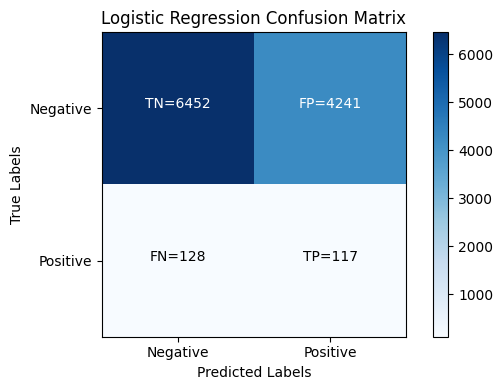


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.60      0.75     10693
           1       0.03      0.48      0.05       245

    accuracy                           0.60     10938
   macro avg       0.50      0.54      0.40     10938
weighted avg       0.96      0.60      0.73     10938



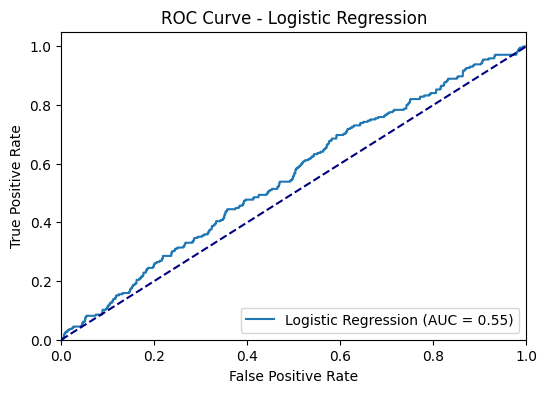



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=2, random_state=42)...
DecisionTreeClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=2, random_state=42) training completed in 0.01 seconds.
-------------------------------------------------------------------



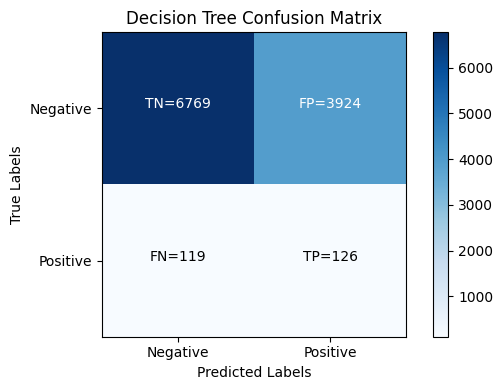


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.63      0.77     10693
           1       0.03      0.51      0.06       245

    accuracy                           0.63     10938
   macro avg       0.51      0.57      0.41     10938
weighted avg       0.96      0.63      0.75     10938



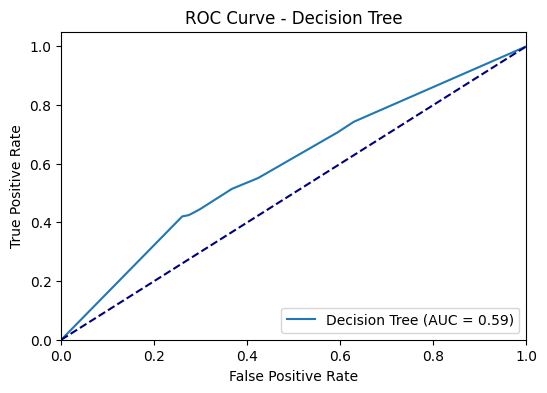



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(class_weight='balanced', random_state=42)...
RandomForestClassifier(class_weight='balanced', random_state=42) training completed in 0.29 seconds.
-------------------------------------------------------------------



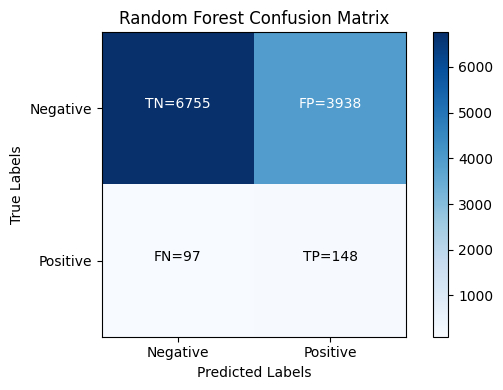


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.99      0.63      0.77     10693
           1       0.04      0.60      0.07       245

    accuracy                           0.63     10938
   macro avg       0.51      0.62      0.42     10938
weighted avg       0.96      0.63      0.75     10938



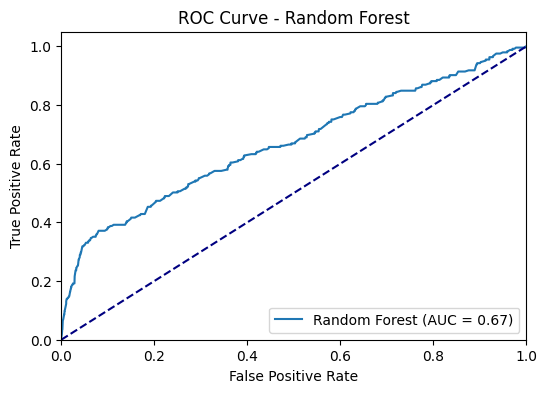



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.001, class_weight='balanced', loss='log', random_state=42)...
SGDClassifier(alpha=0.001, class_weight='balanced', loss='log', random_state=42) training completed in 0.02 seconds.
-------------------------------------------------------------------



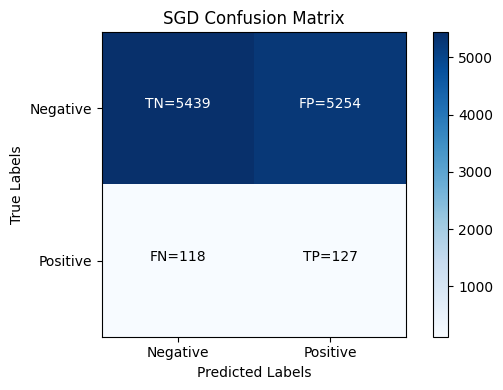


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.98      0.51      0.67     10693
           1       0.02      0.52      0.05       245

    accuracy                           0.51     10938
   macro avg       0.50      0.51      0.36     10938
weighted avg       0.96      0.51      0.66     10938



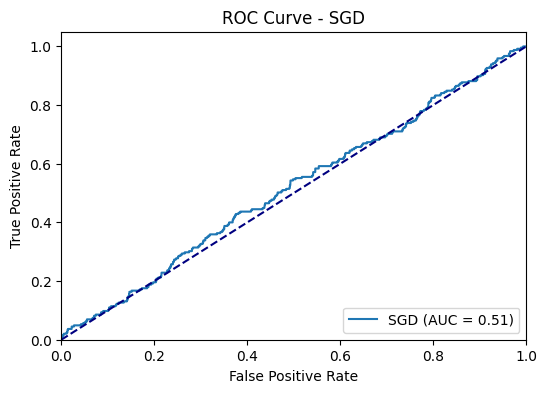



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean', n_neighbors=7, weights='distance')...
KNeighborsClassifier(metric='euclidean', n_neighbors=7, weights='distance') training completed in 0.00 seconds.
-------------------------------------------------------------------



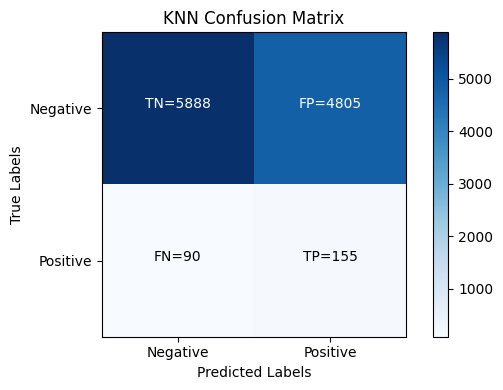


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.55      0.71     10693
           1       0.03      0.63      0.06       245

    accuracy                           0.55     10938
   macro avg       0.51      0.59      0.38     10938
weighted avg       0.96      0.55      0.69     10938



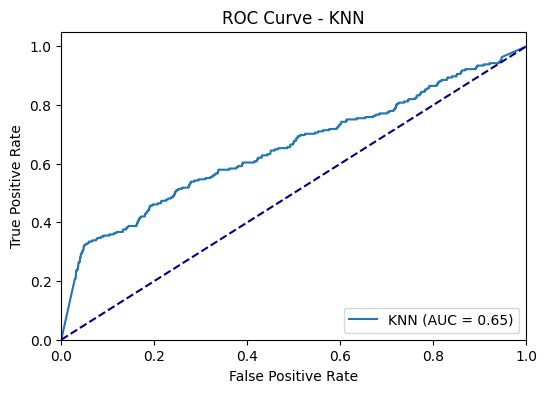



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)...
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8) training completed in 0.78 seconds.
-------------------------------------------------------------------



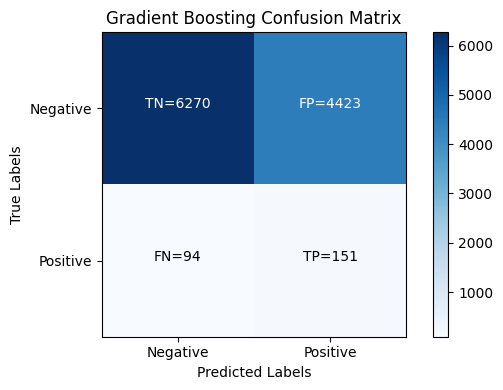


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.99      0.59      0.74     10693
           1       0.03      0.62      0.06       245

    accuracy                           0.59     10938
   macro avg       0.51      0.60      0.40     10938
weighted avg       0.96      0.59      0.72     10938



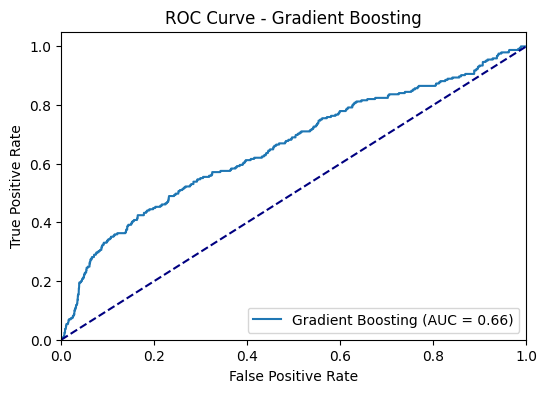



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

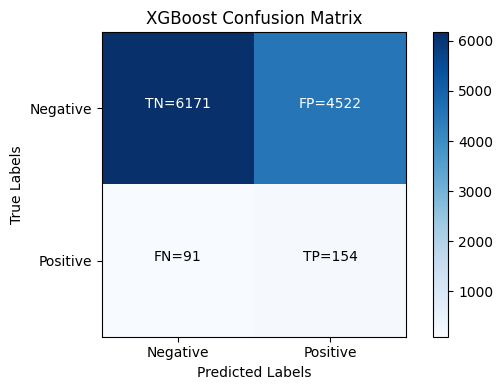


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.99      0.58      0.73     10693
           1       0.03      0.63      0.06       245

    accuracy                           0.58     10938
   macro avg       0.51      0.60      0.40     10938
weighted avg       0.96      0.58      0.71     10938



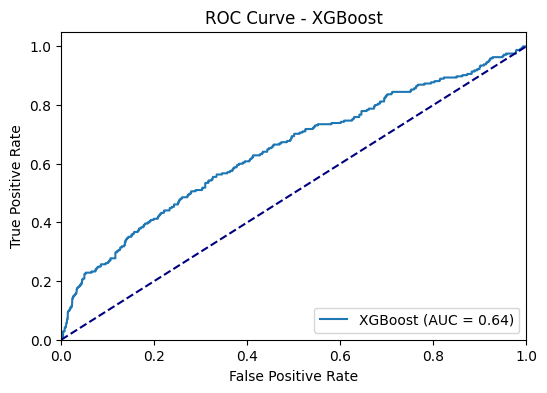



XGBoost finished.
___________________________________________________________________



In [128]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring='f1')

    used_scoring = 'f1'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_RUS = evaluation_df_RUS.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_RUS = evaluation_df_RUS.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [129]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_RUS.to_csv('model_evaluation_metrics_RUS.csv', index=False)
evaluation_df_RUS

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.600567,0.026847,0.477551,0.050836
1,Decision Tree,balanced,f1,0.630371,0.031111,0.514286,0.058673
2,Random Forest,balanced,f1,0.631103,0.036221,0.604082,0.068344
3,SGD,balanced,f1,0.508868,0.023602,0.518367,0.045148
4,KNN,None,f1,0.552478,0.031250,0.632653,0.059558
5,Gradient Boosting,None,f1,0.587036,0.033013,0.616327,0.062669
6,XGBoost,None,f1,0.578259,0.032934,0.628571,0.062589


#### CASE B: FINE TUNING (F1 SCORE) - INCLUDING CLASS WEIGHTS, WHERE FEASIBLE

In [130]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

Fine-tuning Logistic Regression...
Training LogisticRegression(C=10, class_weight='balanced', max_iter=1000,
                   random_state=42, solver='liblinear', tol=0.001)...
LogisticRegression(C=10, class_weight='balanced', max_iter=1000,
                   random_state=42, solver='liblinear', tol=0.001) training completed in 0.02 seconds.
-------------------------------------------------------------------



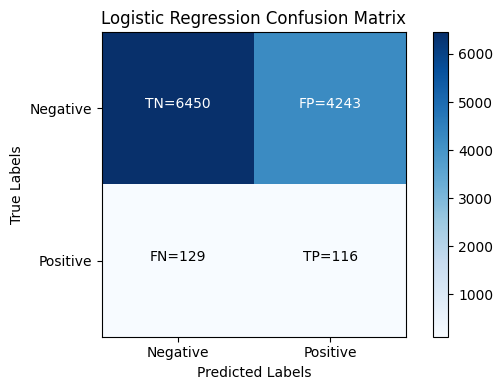


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.60      0.75     10693
           1       0.03      0.47      0.05       245

    accuracy                           0.60     10938
   macro avg       0.50      0.54      0.40     10938
weighted avg       0.96      0.60      0.73     10938



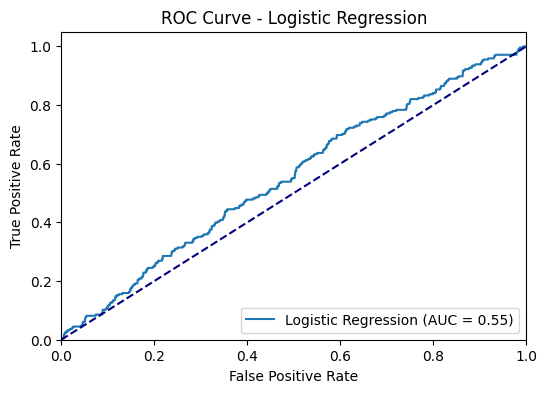



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight={0: 1, 1: 2}, max_depth=10,
                       min_samples_split=10, random_state=42)...
DecisionTreeClassifier(class_weight={0: 1, 1: 2}, max_depth=10,
                       min_samples_split=10, random_state=42) training completed in 0.01 seconds.
-------------------------------------------------------------------



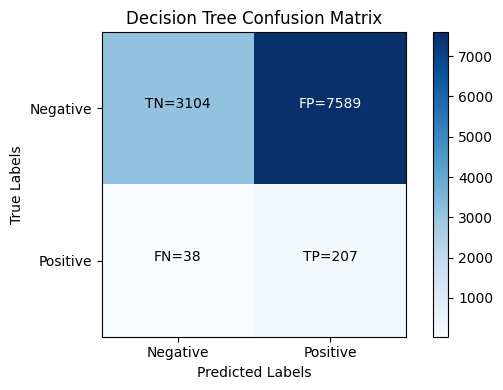


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.99      0.29      0.45     10693
           1       0.03      0.84      0.05       245

    accuracy                           0.30     10938
   macro avg       0.51      0.57      0.25     10938
weighted avg       0.97      0.30      0.44     10938



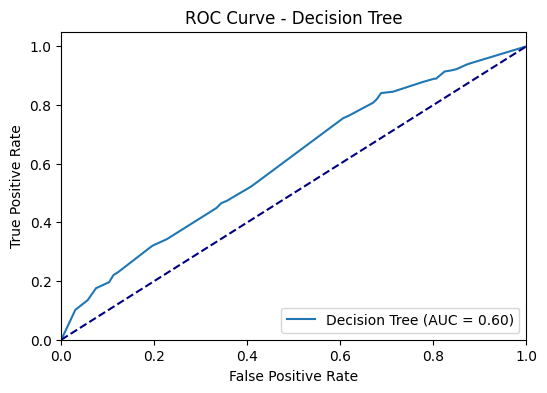



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(class_weight={0: 1, 1: 2}, max_features='log2',
                       min_samples_leaf=3, random_state=42)...
RandomForestClassifier(class_weight={0: 1, 1: 2}, max_features='log2',
                       min_samples_leaf=3, random_state=42) training completed in 0.23 seconds.
-------------------------------------------------------------------



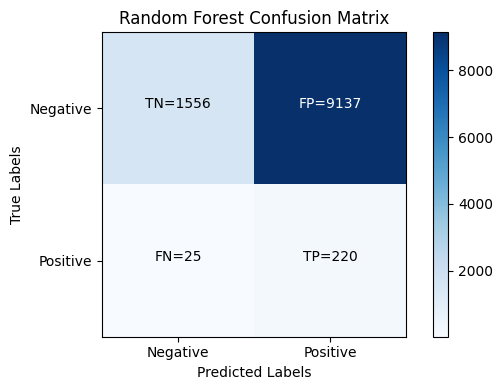


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.15      0.25     10693
           1       0.02      0.90      0.05       245

    accuracy                           0.16     10938
   macro avg       0.50      0.52      0.15     10938
weighted avg       0.96      0.16      0.25     10938



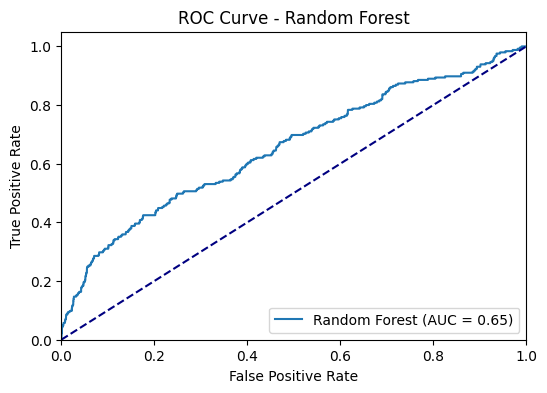



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.06 seconds.
-------------------------------------------------------------------



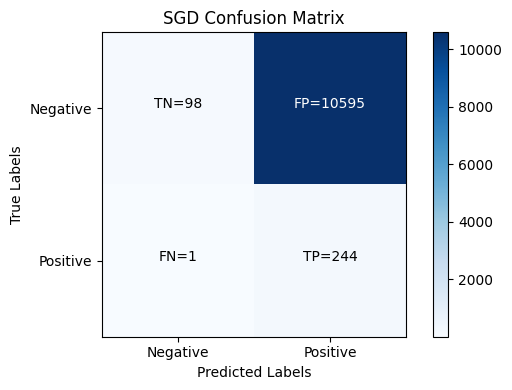


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.99      0.01      0.02     10693
           1       0.02      1.00      0.04       245

    accuracy                           0.03     10938
   macro avg       0.51      0.50      0.03     10938
weighted avg       0.97      0.03      0.02     10938



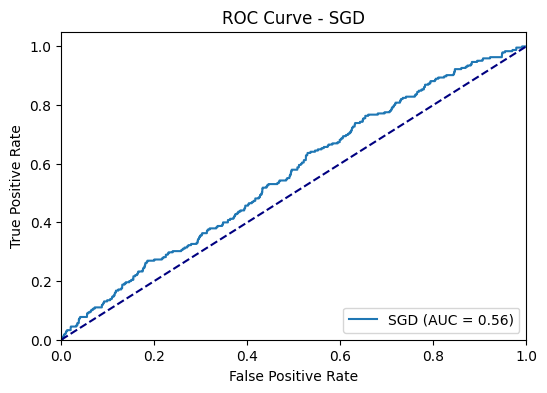



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean', n_neighbors=7, weights='distance')...
KNeighborsClassifier(metric='euclidean', n_neighbors=7, weights='distance') training completed in 0.00 seconds.
-------------------------------------------------------------------



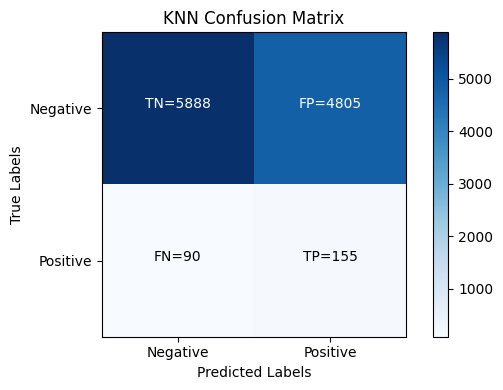


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.55      0.71     10693
           1       0.03      0.63      0.06       245

    accuracy                           0.55     10938
   macro avg       0.51      0.59      0.38     10938
weighted avg       0.96      0.55      0.69     10938



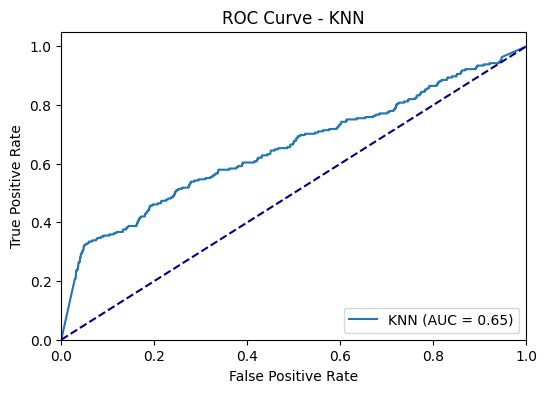



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)...
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8) training completed in 0.73 seconds.
-------------------------------------------------------------------



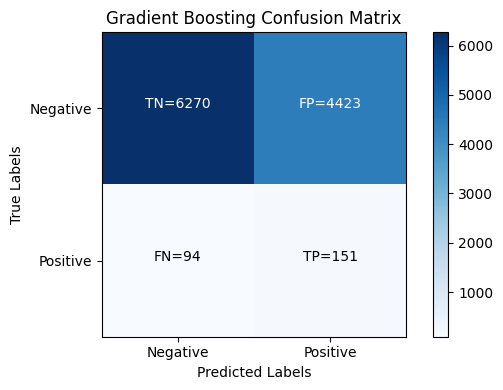


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.99      0.59      0.74     10693
           1       0.03      0.62      0.06       245

    accuracy                           0.59     10938
   macro avg       0.51      0.60      0.40     10938
weighted avg       0.96      0.59      0.72     10938



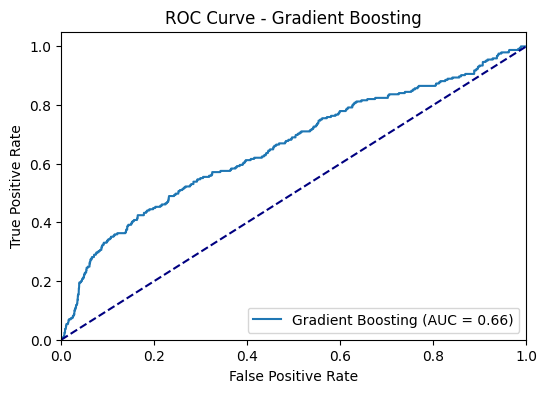



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

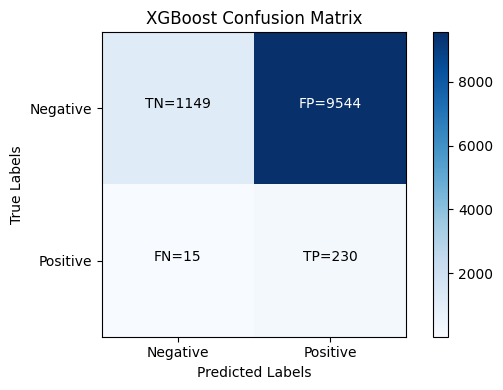


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.99      0.11      0.19     10693
           1       0.02      0.94      0.05       245

    accuracy                           0.13     10938
   macro avg       0.51      0.52      0.12     10938
weighted avg       0.97      0.13      0.19     10938



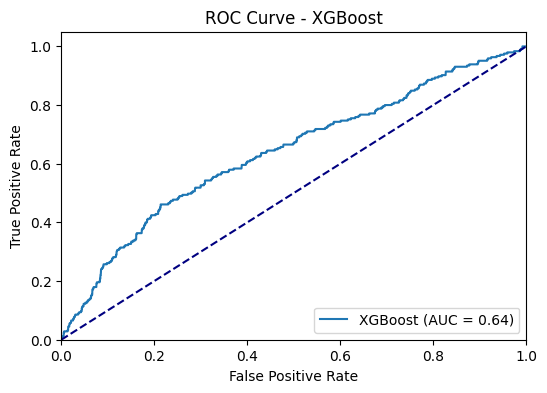



XGBoost finished.
___________________________________________________________________



In [131]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring='f1')

    used_scoring = 'f1'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_RUS = evaluation_df_RUS.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_RUS = evaluation_df_RUS.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [132]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_RUS.to_csv('model_evaluation_metrics_RUS.csv', index=False)
evaluation_df_RUS

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.600567,0.026847,0.477551,0.050836
1,Decision Tree,balanced,f1,0.630371,0.031111,0.514286,0.058673
2,Random Forest,balanced,f1,0.631103,0.036221,0.604082,0.068344
3,SGD,balanced,f1,0.508868,0.023602,0.518367,0.045148
4,KNN,None,f1,0.552478,0.031250,0.632653,0.059558
5,Gradient Boosting,None,f1,0.587036,0.033013,0.616327,0.062669
6,XGBoost,None,f1,0.578259,0.032934,0.628571,0.062589
7,Logistic Regression,balanced,f1,0.600293,0.026612,0.473469,0.050391
8,Decision Tree,"{0: 1, 1: 2}",f1,0.302706,0.026552,0.844898,0.051486
9,Random Forest,"{0: 1, 1: 2}",f1,0.162370,0.023512,0.897959,0.045824


#### CASE C: FINE TUNING (F2 SCORE) - INCLUDING CLASS WEIGHTS, WHERE FEASIBLE

In [133]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

In [134]:
beta=2.0

# Create a scorer using the custom scoring function
f_beta = make_scorer(custom_scoring, greater_is_better=True)

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.00 seconds.
-------------------------------------------------------------------



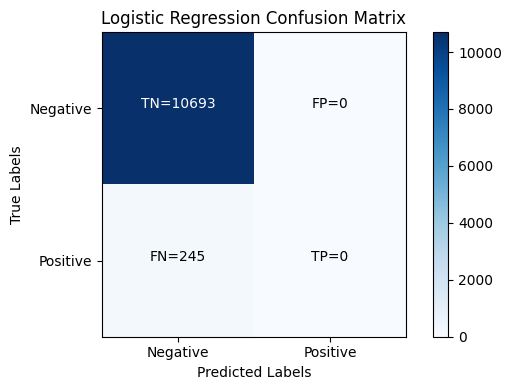


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     10693
           1       0.00      0.00      0.00       245

    accuracy                           0.98     10938
   macro avg       0.49      0.50      0.49     10938
weighted avg       0.96      0.98      0.97     10938



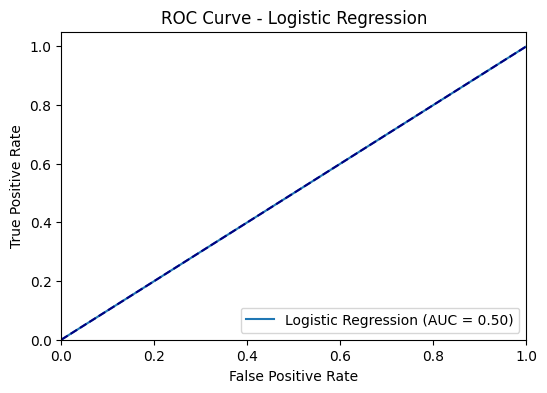



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42)...
DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42) training completed in 0.01 seconds.
-------------------------------------------------------------------



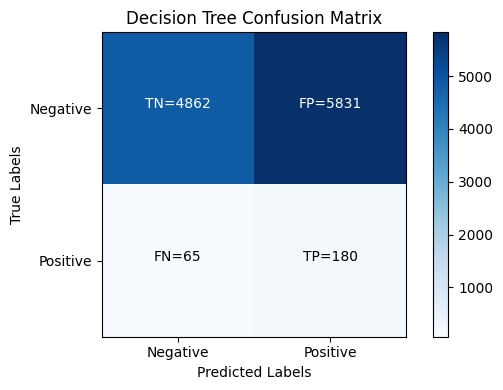


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.99      0.45      0.62     10693
           1       0.03      0.73      0.06       245

    accuracy                           0.46     10938
   macro avg       0.51      0.59      0.34     10938
weighted avg       0.97      0.46      0.61     10938



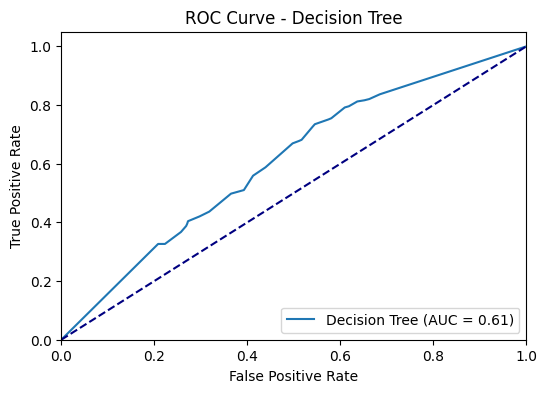



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_depth=10, max_features='log2', random_state=42)...
RandomForestClassifier(max_depth=10, max_features='log2', random_state=42) training completed in 0.31 seconds.
-------------------------------------------------------------------



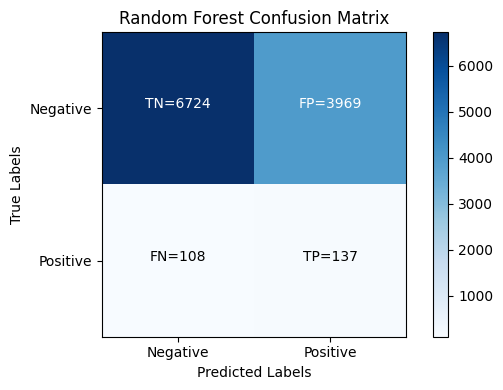


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.63      0.77     10693
           1       0.03      0.56      0.06       245

    accuracy                           0.63     10938
   macro avg       0.51      0.59      0.42     10938
weighted avg       0.96      0.63      0.75     10938



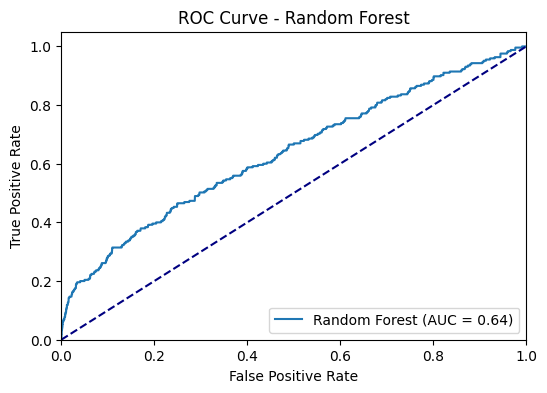



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.06 seconds.
-------------------------------------------------------------------



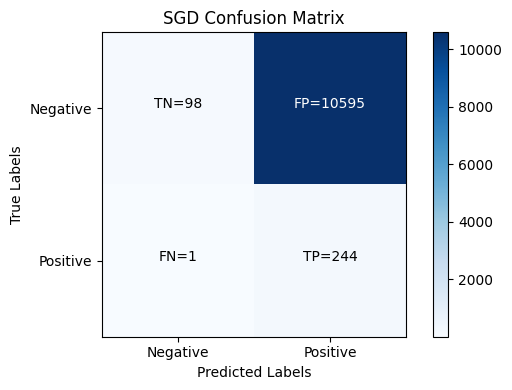


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.99      0.01      0.02     10693
           1       0.02      1.00      0.04       245

    accuracy                           0.03     10938
   macro avg       0.51      0.50      0.03     10938
weighted avg       0.97      0.03      0.02     10938



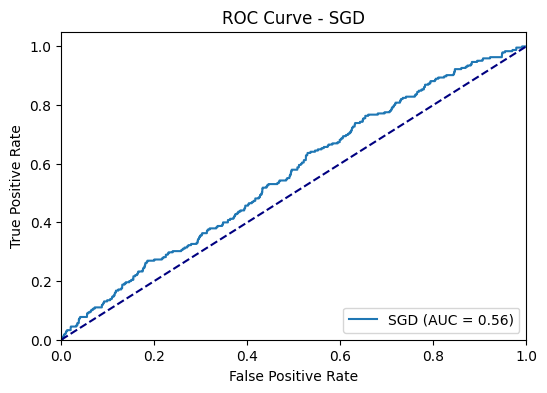



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean')...
KNeighborsClassifier(metric='euclidean') training completed in 0.00 seconds.
-------------------------------------------------------------------



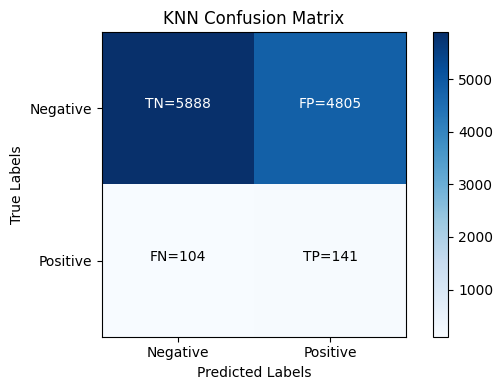


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.55      0.71     10693
           1       0.03      0.58      0.05       245

    accuracy                           0.55     10938
   macro avg       0.51      0.56      0.38     10938
weighted avg       0.96      0.55      0.69     10938



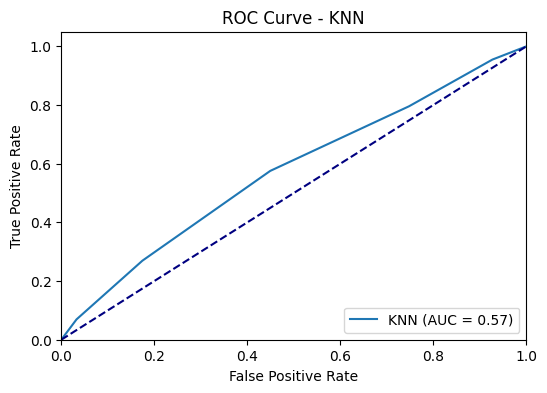



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(n_estimators=50, random_state=42)...
GradientBoostingClassifier(n_estimators=50, random_state=42) training completed in 0.21 seconds.
-------------------------------------------------------------------



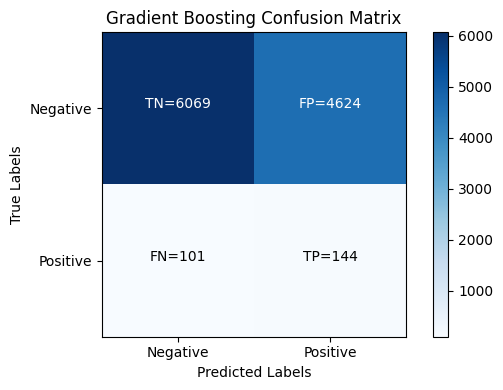


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.57      0.72     10693
           1       0.03      0.59      0.06       245

    accuracy                           0.57     10938
   macro avg       0.51      0.58      0.39     10938
weighted avg       0.96      0.57      0.70     10938



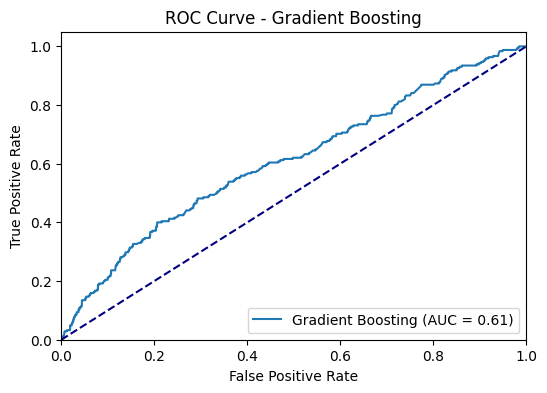



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

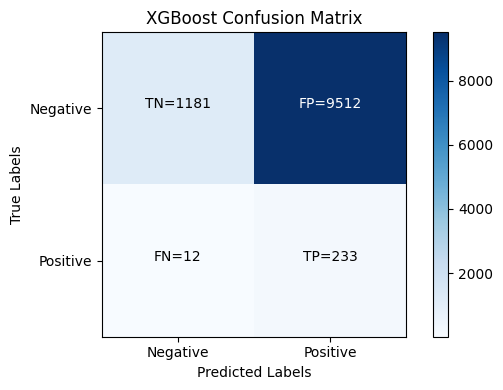


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.99      0.11      0.20     10693
           1       0.02      0.95      0.05       245

    accuracy                           0.13     10938
   macro avg       0.51      0.53      0.12     10938
weighted avg       0.97      0.13      0.20     10938



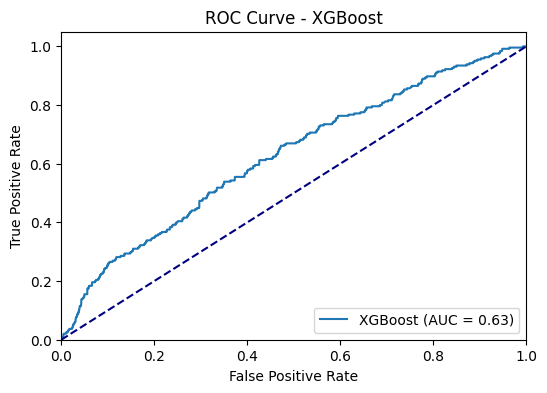



XGBoost finished.
___________________________________________________________________



In [135]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring=f_beta)

    used_scoring = 'f2'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_RUS = evaluation_df_RUS.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_RUS = evaluation_df_RUS.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [136]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_RUS.to_csv('model_evaluation_metrics_RUS.csv', index=False)
evaluation_df_RUS

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.600567,0.026847,0.477551,0.050836
1,Decision Tree,balanced,f1,0.630371,0.031111,0.514286,0.058673
2,Random Forest,balanced,f1,0.631103,0.036221,0.604082,0.068344
3,SGD,balanced,f1,0.508868,0.023602,0.518367,0.045148
4,KNN,None,f1,0.552478,0.031250,0.632653,0.059558
5,Gradient Boosting,None,f1,0.587036,0.033013,0.616327,0.062669
6,XGBoost,None,f1,0.578259,0.032934,0.628571,0.062589
7,Logistic Regression,balanced,f1,0.600293,0.026612,0.473469,0.050391
8,Decision Tree,"{0: 1, 1: 2}",f1,0.302706,0.026552,0.844898,0.051486
9,Random Forest,"{0: 1, 1: 2}",f1,0.162370,0.023512,0.897959,0.045824


#### CASE D: CASE C + PREVIOUS PCA

In [137]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

In [138]:
# Apply PCA for dimensionality reduction
num_pca_components = 20
pca = PCA(n_components=num_pca_components)
X_train_resampled_pca = pca.fit_transform(X_train_resampled)
X_test_preprocessed_pca = pca.transform(X_test_preprocessed)

selected_feature_names = [f'PCA_{i+1}' for i in range(X_train_resampled_pca.shape[1])]

X_test_pca_df = pd.DataFrame(X_test_preprocessed_pca, columns=selected_feature_names)

In [139]:
# Add a new column named "PCA" with value "no"
evaluation_df_RUS['PCA'] = 'no'

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.00 seconds.
-------------------------------------------------------------------



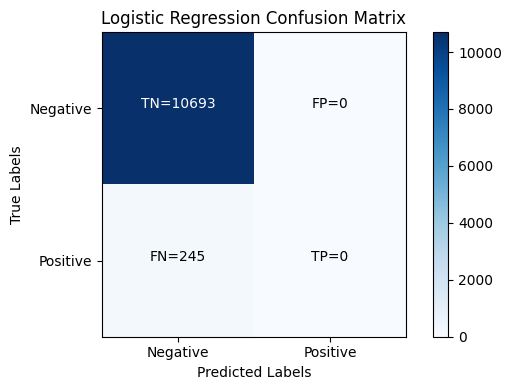


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     10693
           1       0.00      0.00      0.00       245

    accuracy                           0.98     10938
   macro avg       0.49      0.50      0.49     10938
weighted avg       0.96      0.98      0.97     10938



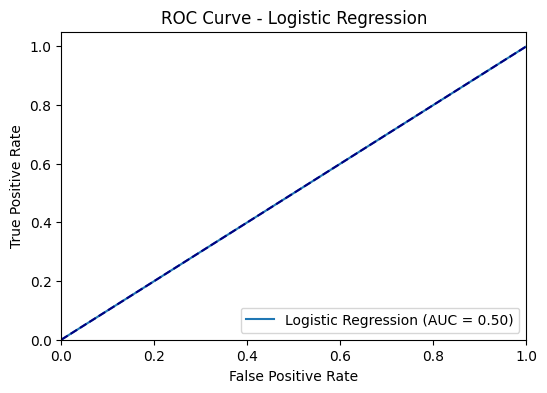



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42)...
DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42) training completed in 0.03 seconds.
-------------------------------------------------------------------



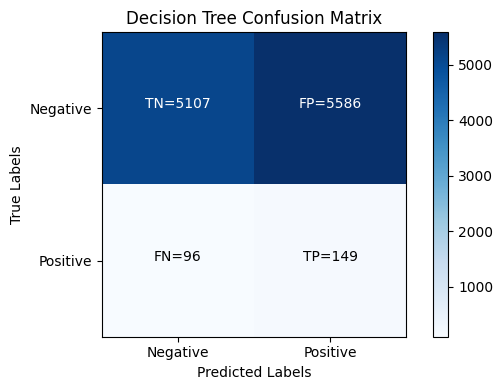


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.48      0.64     10693
           1       0.03      0.61      0.05       245

    accuracy                           0.48     10938
   macro avg       0.50      0.54      0.35     10938
weighted avg       0.96      0.48      0.63     10938



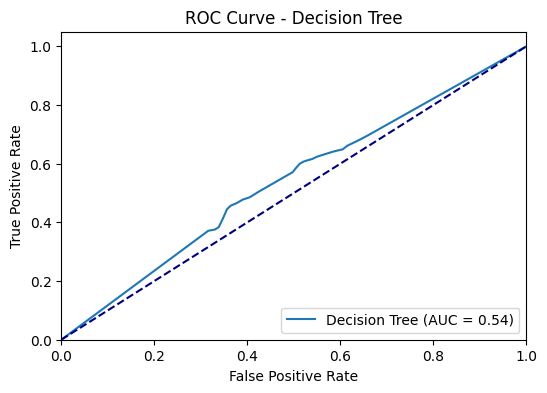



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_depth=10, max_features='log2', random_state=42)...
RandomForestClassifier(max_depth=10, max_features='log2', random_state=42) training completed in 0.48 seconds.
-------------------------------------------------------------------



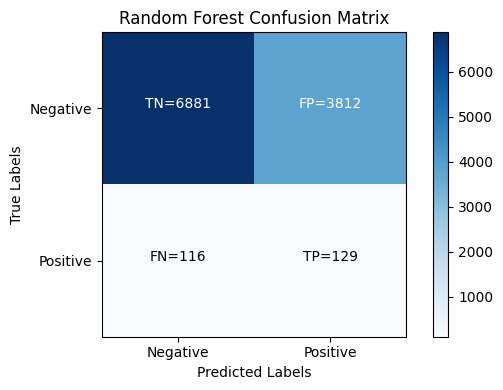


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.64      0.78     10693
           1       0.03      0.53      0.06       245

    accuracy                           0.64     10938
   macro avg       0.51      0.59      0.42     10938
weighted avg       0.96      0.64      0.76     10938



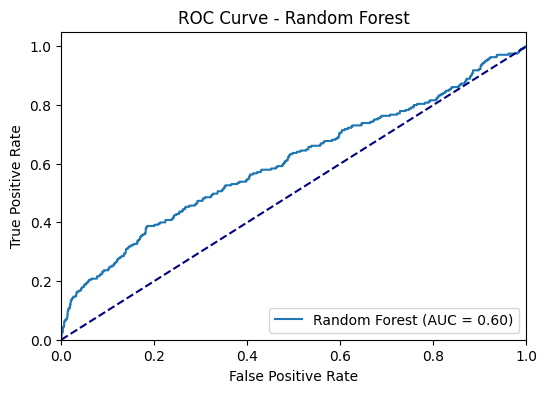



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.01 seconds.
-------------------------------------------------------------------



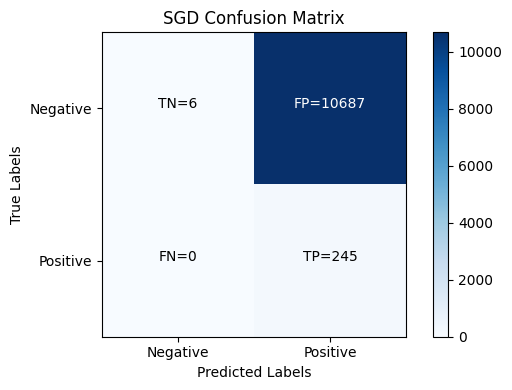


Classification Report for SGD:

              precision    recall  f1-score   support

           0       1.00      0.00      0.00     10693
           1       0.02      1.00      0.04       245

    accuracy                           0.02     10938
   macro avg       0.51      0.50      0.02     10938
weighted avg       0.98      0.02      0.00     10938



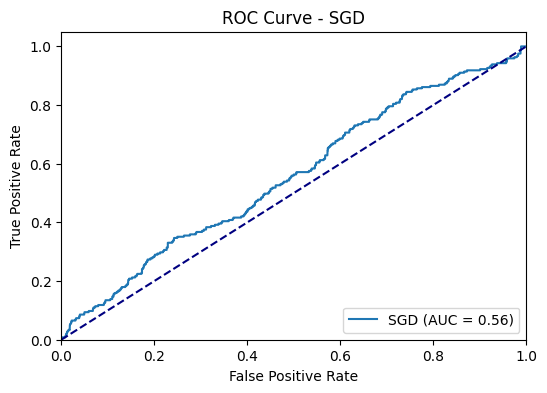



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean')...
KNeighborsClassifier(metric='euclidean') training completed in 0.00 seconds.
-------------------------------------------------------------------



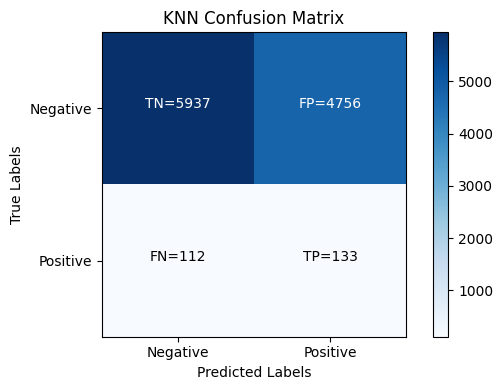


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.56      0.71     10693
           1       0.03      0.54      0.05       245

    accuracy                           0.55     10938
   macro avg       0.50      0.55      0.38     10938
weighted avg       0.96      0.55      0.69     10938



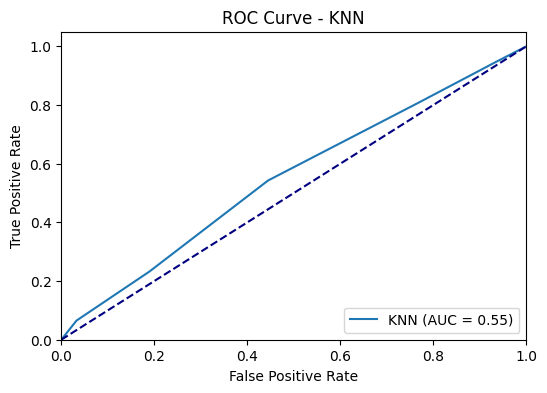



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(n_estimators=50, random_state=42)...
GradientBoostingClassifier(n_estimators=50, random_state=42) training completed in 0.42 seconds.
-------------------------------------------------------------------



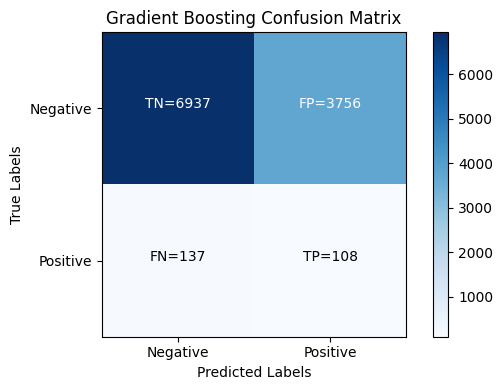


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.65      0.78     10693
           1       0.03      0.44      0.05       245

    accuracy                           0.64     10938
   macro avg       0.50      0.54      0.42     10938
weighted avg       0.96      0.64      0.76     10938



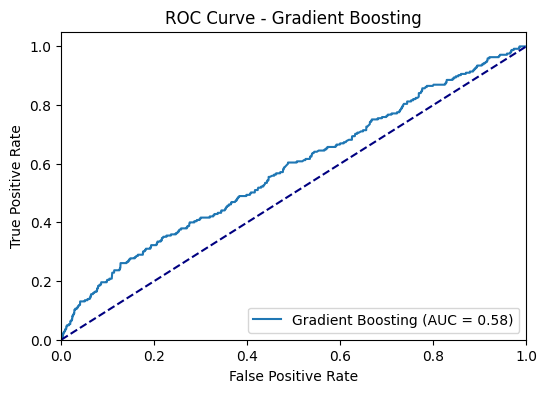



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

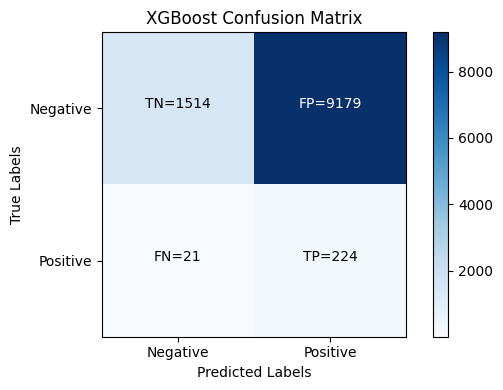


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.99      0.14      0.25     10693
           1       0.02      0.91      0.05       245

    accuracy                           0.16     10938
   macro avg       0.51      0.53      0.15     10938
weighted avg       0.96      0.16      0.24     10938



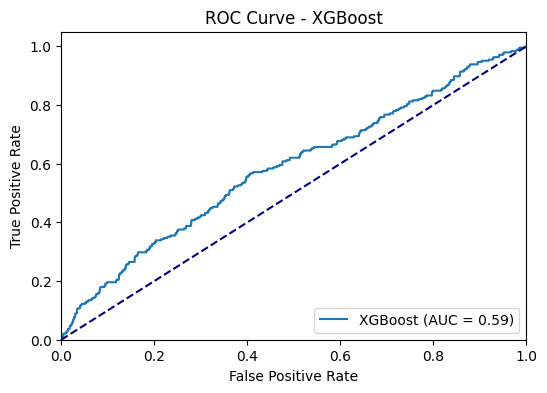



XGBoost finished.
___________________________________________________________________



In [140]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring=f_beta)

    used_scoring = 'f2'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled_pca, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed_pca)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Plot confusion matrix
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_RUS = evaluation_df_RUS.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'PCA': 'yes'
        }, ignore_index=True)
    else:
        evaluation_df_RUS = evaluation_df_RUS.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'PCA': 'yes'
        }, ignore_index=True)

In [141]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_RUS.to_csv('model_evaluation_metrics_RUS.csv', index=False)
evaluation_df_RUS

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score,PCA
0,Logistic Regression,balanced,f1,0.600567,0.026847,0.477551,0.050836,no
1,Decision Tree,balanced,f1,0.630371,0.031111,0.514286,0.058673,no
2,Random Forest,balanced,f1,0.631103,0.036221,0.604082,0.068344,no
3,SGD,balanced,f1,0.508868,0.023602,0.518367,0.045148,no
4,KNN,None,f1,0.552478,0.031250,0.632653,0.059558,no
5,Gradient Boosting,None,f1,0.587036,0.033013,0.616327,0.062669,no
6,XGBoost,None,f1,0.578259,0.032934,0.628571,0.062589,no
7,Logistic Regression,balanced,f1,0.600293,0.026612,0.473469,0.050391,no
8,Decision Tree,"{0: 1, 1: 2}",f1,0.302706,0.026552,0.844898,0.051486,no
9,Random Forest,"{0: 1, 1: 2}",f1,0.162370,0.023512,0.897959,0.045824,no


## PREPROCESS TECHNIQUE: ADASYN

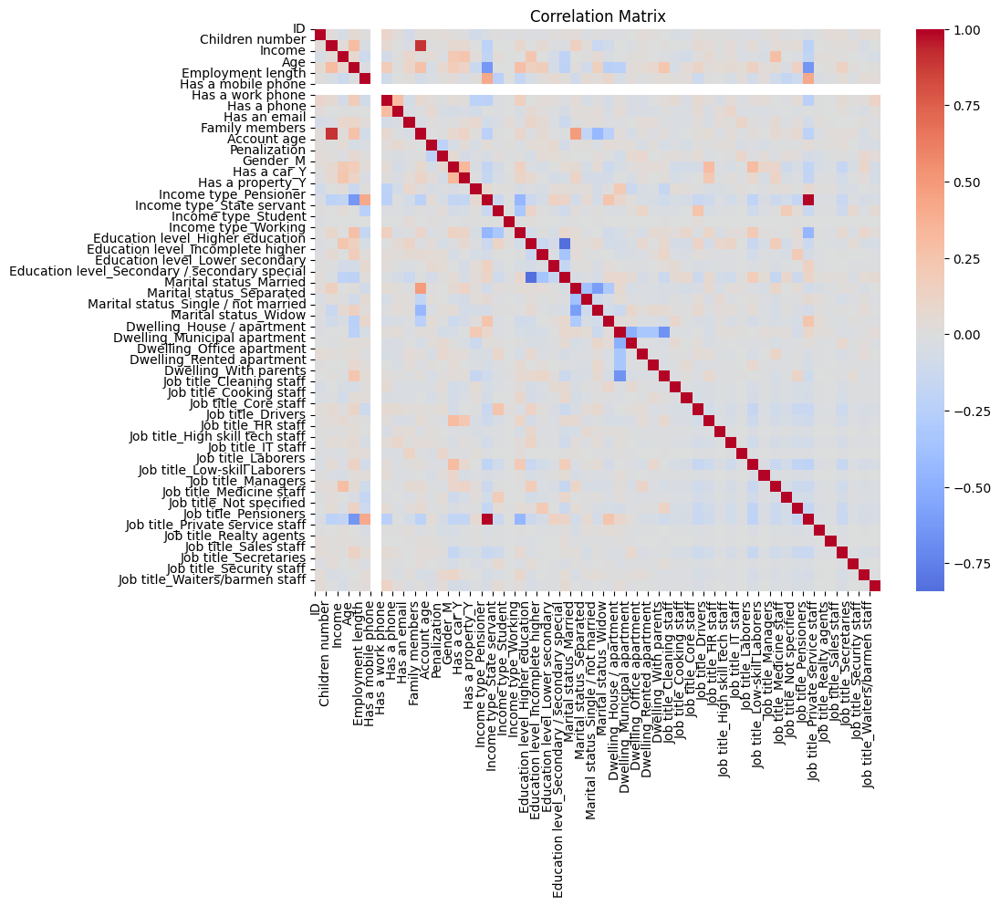

In [142]:
categorical_features = X.select_dtypes(include=['object']).columns.tolist()
X_train_resampled, X_test_preprocessed, y_train_resampled = preprocess_data(X_train, X_test, categorical_features, resampling_technique='adasyn')

corr_matrix = X_train_resampled.corr()
feature_names = X_train_resampled.columns
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0)
plt.title(f'Correlation Matrix')
plt.xticks(ticks=range(len(feature_names)), labels=feature_names, rotation=90)
plt.yticks(ticks=range(len(feature_names)), labels=feature_names, rotation=0)
plt.show()

### FEATURES CORRELATION

In [143]:
X_train_resampled=X_train_resampled.drop(['Penalization','ID', 'Has a mobile phone', 'Account age'], axis=1)
X_test_preprocessed=X_test_preprocessed.drop(['Penalization','ID', 'Has a mobile phone', 'Account age'], axis=1)

In [144]:
X_train_resampled=X_train_resampled.drop(['Children number', 'Job title_Pensioners', 'Education level_Higher education',
                                          'Income type_Pensioner', 'Dwelling_With parents'], axis=1)
X_test_preprocessed=X_test_preprocessed.drop(['Children number', 'Job title_Pensioners', 'Education level_Higher education',
                                          'Income type_Pensioner', 'Dwelling_With parents'], axis=1)

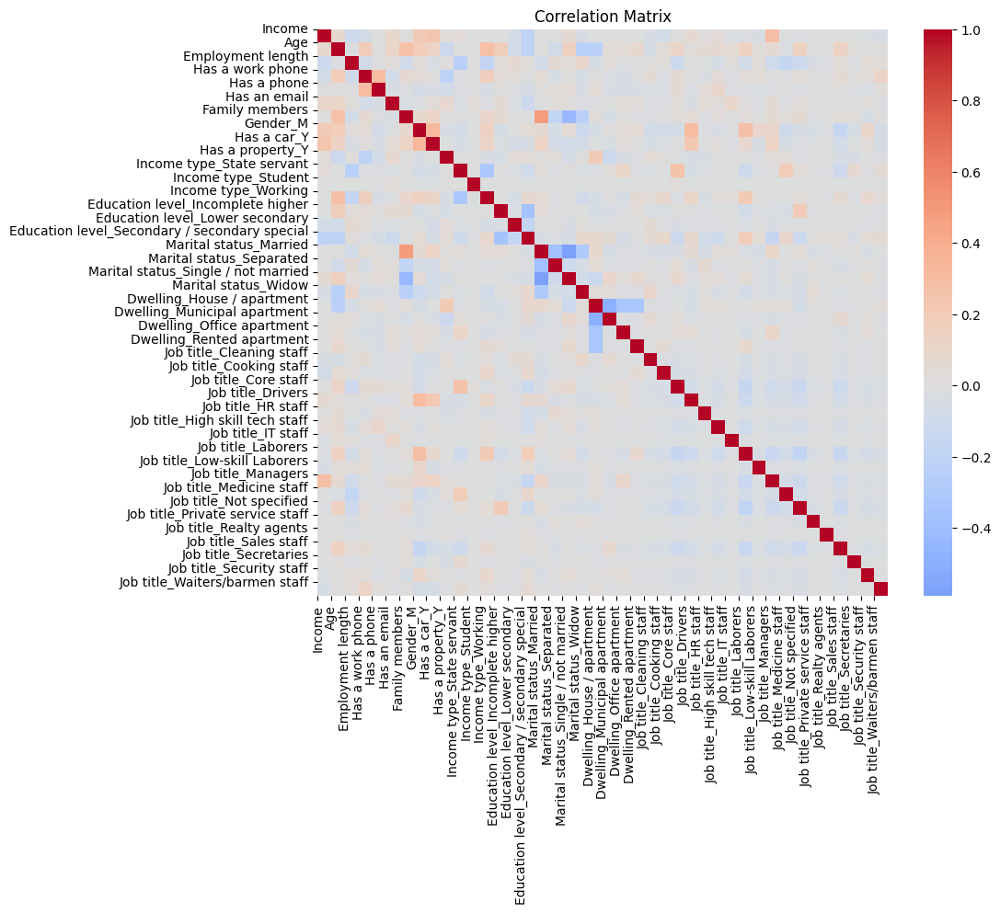

In [145]:
corr_matrix = X_train_resampled.corr()
feature_names = X_train_resampled.columns
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0)
plt.title(f'Correlation Matrix')
plt.xticks(ticks=range(len(feature_names)), labels=feature_names, rotation=90)
plt.yticks(ticks=range(len(feature_names)), labels=feature_names, rotation=0)
plt.show()

In [146]:
y_train_resampled.value_counts(normalize=True)

1    0.500631
0    0.499369
Name: Risk, dtype: float64

### TRAINING AND TESTING

*Exactly the same procedure as per SMOTE sampling technique...*

#### CASE A: FINE TUNING (F1 SCORE) - CLASS WEIGHTS FIXED TO 'BALANCED', WHERE FEASIBLE

In [147]:
# Dictionary of models and their corresponding hyperparameter grids for RandomizedSearchCV
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001, class_weight='balanced'), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs']
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42, class_weight='balanced'), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0, class_weight='balanced'), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3]
    }),
    'SGD': (SGDClassifier(random_state=42, class_weight='balanced', loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0]
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0]
    })

}

In [148]:
# Initialize an empty DataFrame to store the evaluation metrics
evaluation_df_ADASYN = pd.DataFrame(columns=['Model Name', 'Class Weights', 'Scoring Parameter', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,
                   penalty='l1', random_state=42, solver='liblinear',
                   tol=0.001)...
LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,
                   penalty='l1', random_state=42, solver='liblinear',
                   tol=0.001) training completed in 0.11 seconds.
-------------------------------------------------------------------



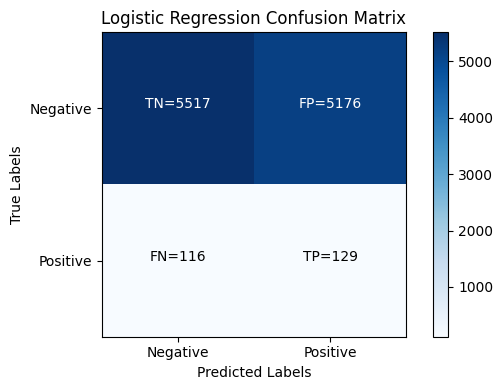


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.52      0.68     10693
           1       0.02      0.53      0.05       245

    accuracy                           0.52     10938
   macro avg       0.50      0.52      0.36     10938
weighted avg       0.96      0.52      0.66     10938



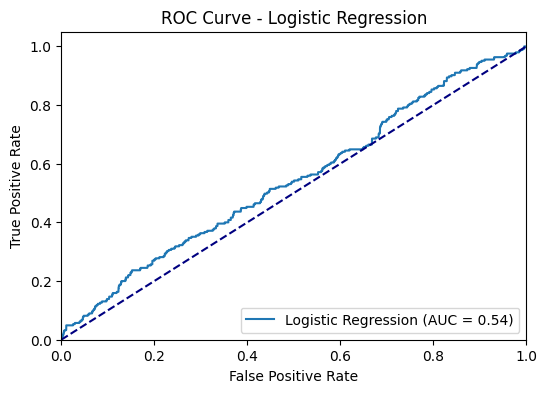



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42)...
DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42) training completed in 0.34 seconds.
-------------------------------------------------------------------



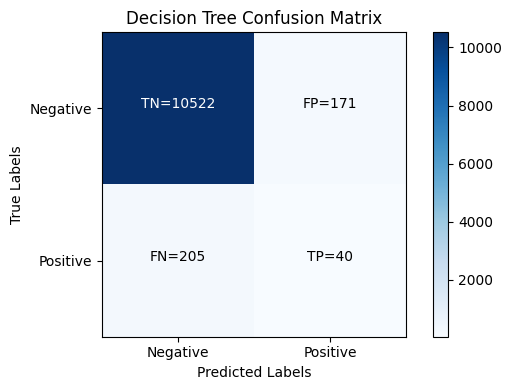


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.19      0.16      0.18       245

    accuracy                           0.97     10938
   macro avg       0.59      0.57      0.58     10938
weighted avg       0.96      0.97      0.96     10938



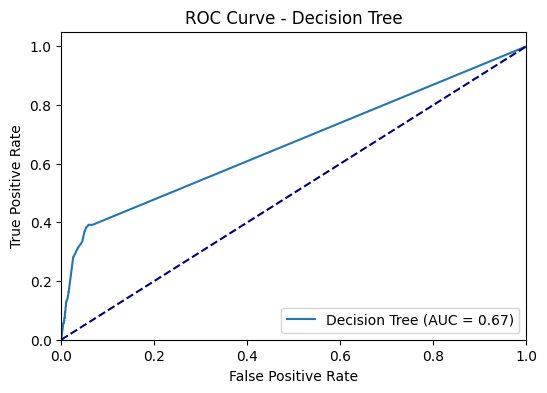



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(class_weight='balanced', random_state=42)...
RandomForestClassifier(class_weight='balanced', random_state=42) training completed in 5.96 seconds.
-------------------------------------------------------------------



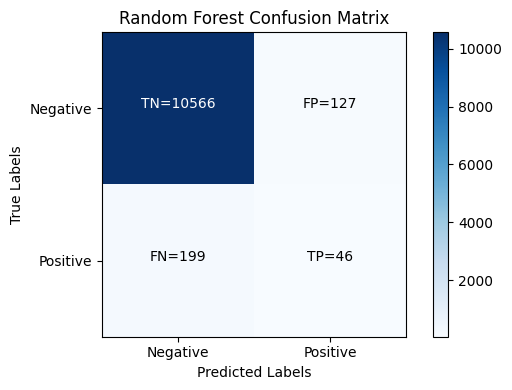


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.27      0.19      0.22       245

    accuracy                           0.97     10938
   macro avg       0.62      0.59      0.60     10938
weighted avg       0.97      0.97      0.97     10938



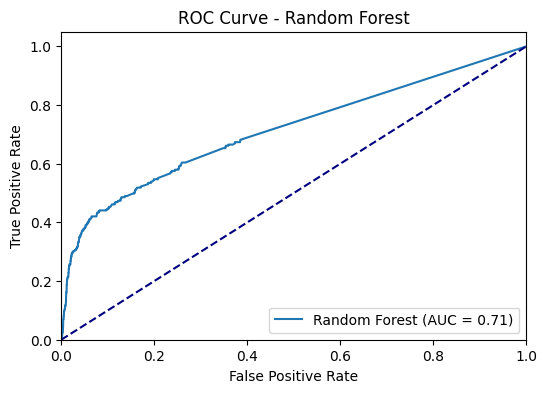



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight='balanced', loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight='balanced', loss='log', penalty='l1',
              random_state=42) training completed in 0.21 seconds.
-------------------------------------------------------------------



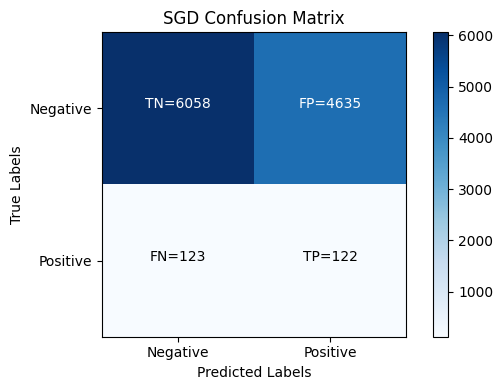


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.98      0.57      0.72     10693
           1       0.03      0.50      0.05       245

    accuracy                           0.57     10938
   macro avg       0.50      0.53      0.38     10938
weighted avg       0.96      0.57      0.70     10938



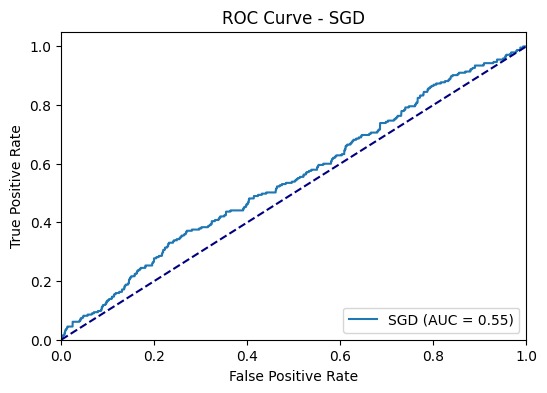



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean', weights='distance')...
KNeighborsClassifier(metric='euclidean', weights='distance') training completed in 0.01 seconds.
-------------------------------------------------------------------



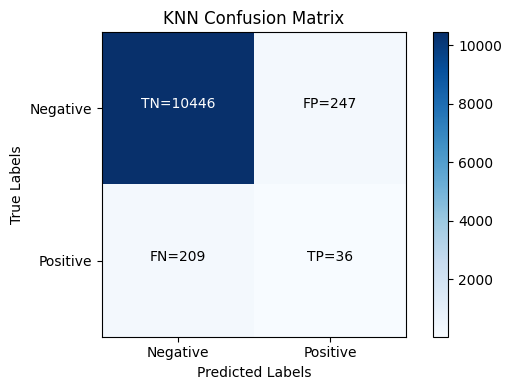


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.13      0.15      0.14       245

    accuracy                           0.96     10938
   macro avg       0.55      0.56      0.56     10938
weighted avg       0.96      0.96      0.96     10938



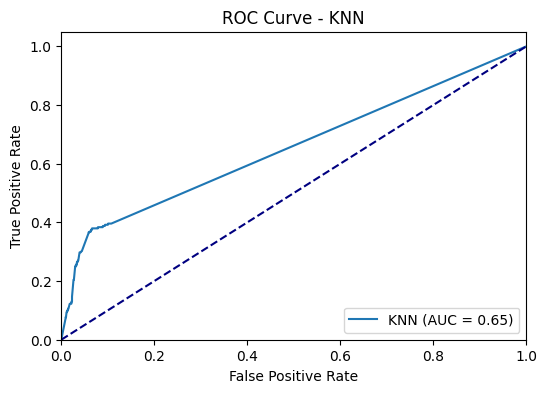



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)...
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8) training completed in 37.48 seconds.
-------------------------------------------------------------------



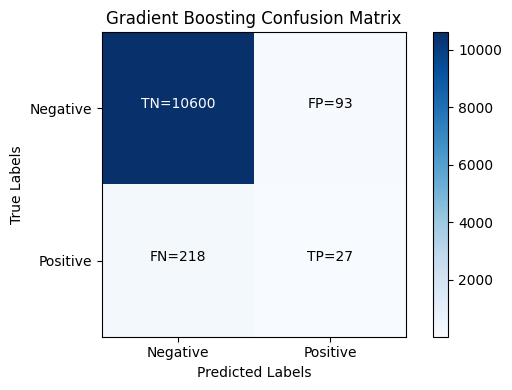


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     10693
           1       0.23      0.11      0.15       245

    accuracy                           0.97     10938
   macro avg       0.60      0.55      0.57     10938
weighted avg       0.96      0.97      0.97     10938



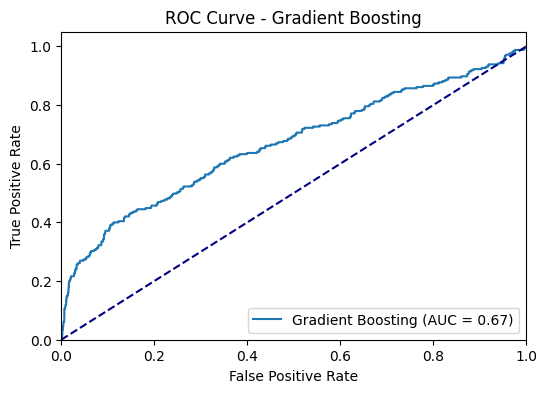



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

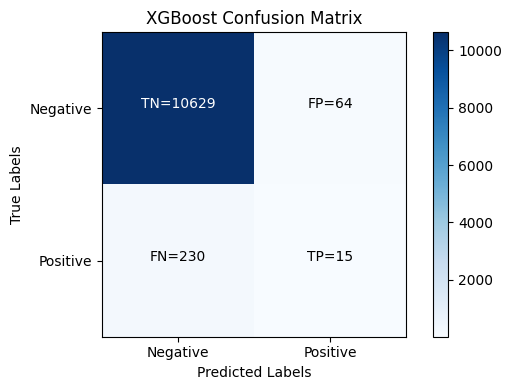


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     10693
           1       0.19      0.06      0.09       245

    accuracy                           0.97     10938
   macro avg       0.58      0.53      0.54     10938
weighted avg       0.96      0.97      0.97     10938



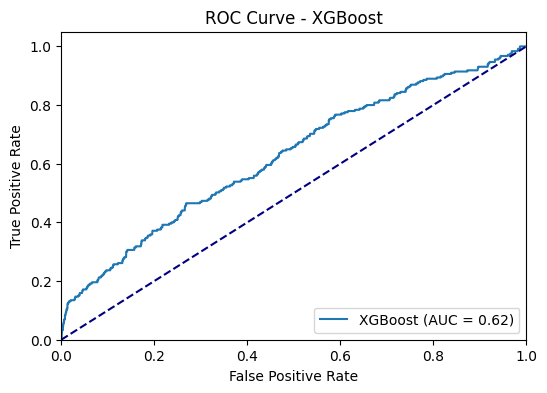



XGBoost finished.
___________________________________________________________________



In [149]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring='f1')

    used_scoring = 'f1'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_ADASYN = evaluation_df_ADASYN.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_ADASYN = evaluation_df_ADASYN.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [150]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_ADASYN.to_csv('model_evaluation_metrics_ADASYN.csv', index=False)
evaluation_df_ADASYN

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.516182,0.024317,0.526531,0.046486
1,Decision Tree,balanced,f1,0.965624,0.189573,0.163265,0.175439
2,Random Forest,balanced,f1,0.970196,0.265896,0.187755,0.220096
3,SGD,balanced,f1,0.565003,0.025646,0.497959,0.048780
4,KNN,None,f1,0.958310,0.127208,0.146939,0.136364
5,Gradient Boosting,None,f1,0.971567,0.225000,0.110204,0.147945
6,XGBoost,None,f1,0.973121,0.189873,0.061224,0.092593


#### CASE B: FINE TUNING (F1 SCORE) - INCLUDING CLASS WEIGHTS, WHERE FEASIBLE

In [151]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.11 seconds.
-------------------------------------------------------------------



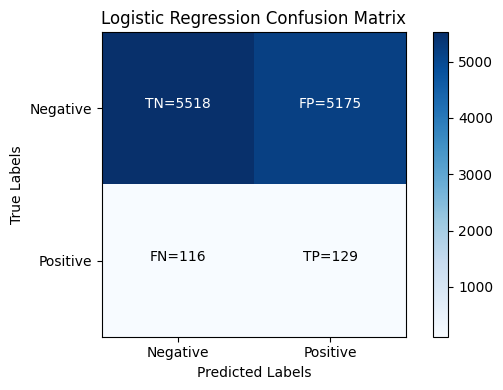


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.52      0.68     10693
           1       0.02      0.53      0.05       245

    accuracy                           0.52     10938
   macro avg       0.50      0.52      0.36     10938
weighted avg       0.96      0.52      0.66     10938



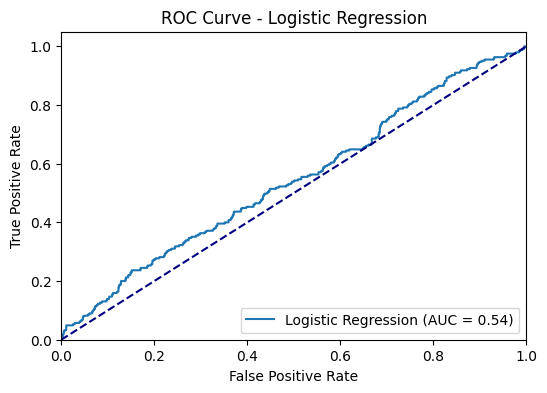



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(min_samples_leaf=2, min_samples_split=5, random_state=42)...
DecisionTreeClassifier(min_samples_leaf=2, min_samples_split=5, random_state=42) training completed in 0.32 seconds.
-------------------------------------------------------------------



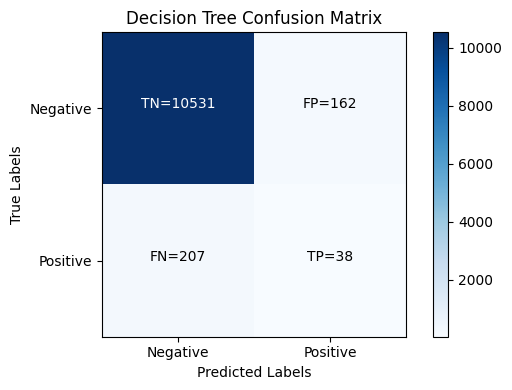


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.19      0.16      0.17       245

    accuracy                           0.97     10938
   macro avg       0.59      0.57      0.58     10938
weighted avg       0.96      0.97      0.96     10938



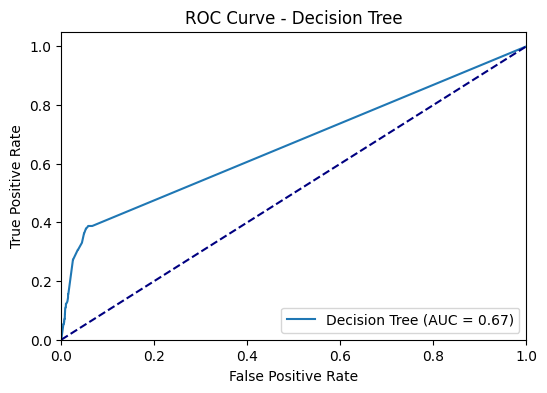



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(class_weight={0: 1, 1: 2}, max_depth=40,
                       max_features='log2', n_estimators=200, random_state=42)...
RandomForestClassifier(class_weight={0: 1, 1: 2}, max_depth=40,
                       max_features='log2', n_estimators=200, random_state=42) training completed in 10.70 seconds.
-------------------------------------------------------------------



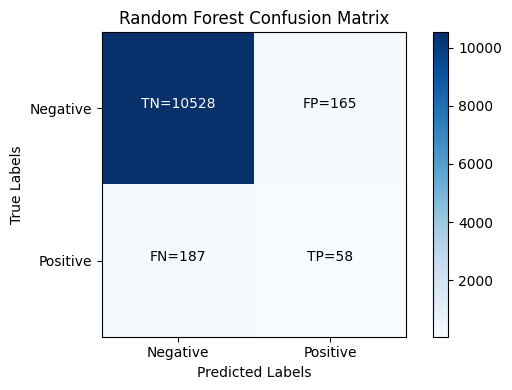


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.26      0.24      0.25       245

    accuracy                           0.97     10938
   macro avg       0.62      0.61      0.62     10938
weighted avg       0.97      0.97      0.97     10938



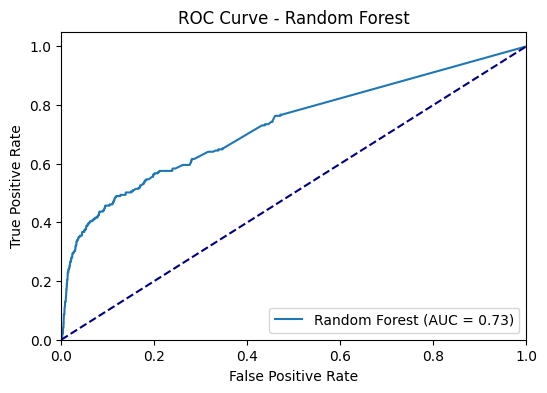



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.69 seconds.
-------------------------------------------------------------------



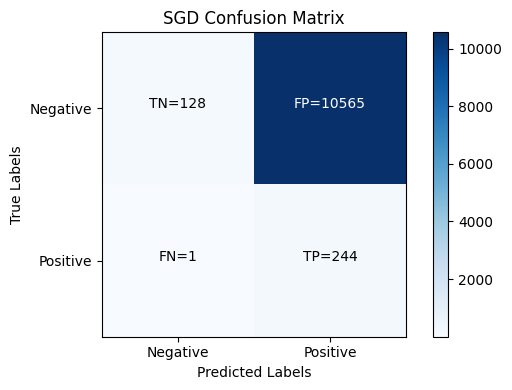


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.99      0.01      0.02     10693
           1       0.02      1.00      0.04       245

    accuracy                           0.03     10938
   macro avg       0.51      0.50      0.03     10938
weighted avg       0.97      0.03      0.02     10938



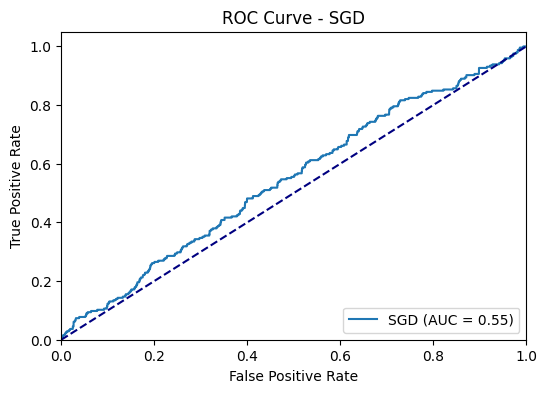



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean', weights='distance')...
KNeighborsClassifier(metric='euclidean', weights='distance') training completed in 0.01 seconds.
-------------------------------------------------------------------



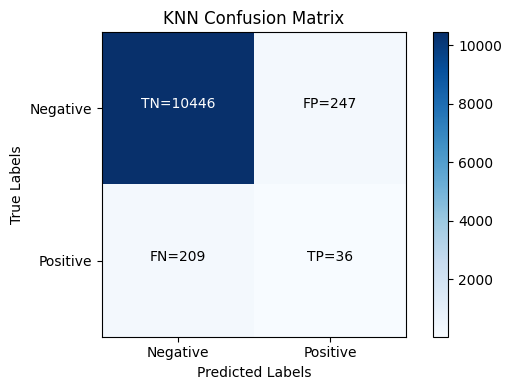


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.13      0.15      0.14       245

    accuracy                           0.96     10938
   macro avg       0.55      0.56      0.56     10938
weighted avg       0.96      0.96      0.96     10938



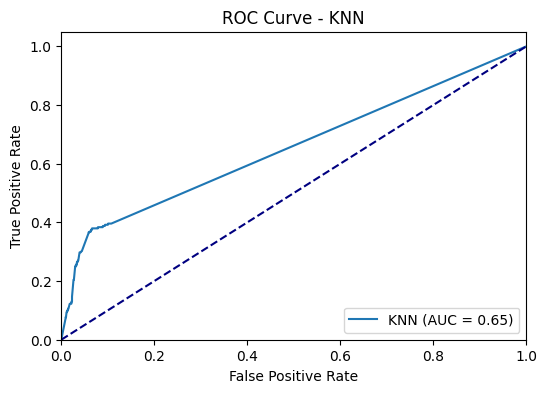



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)...
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8) training completed in 37.28 seconds.
-------------------------------------------------------------------



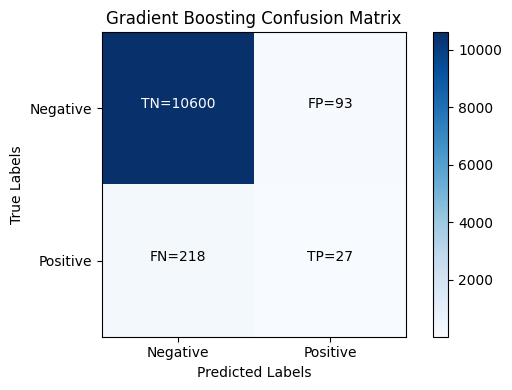


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     10693
           1       0.23      0.11      0.15       245

    accuracy                           0.97     10938
   macro avg       0.60      0.55      0.57     10938
weighted avg       0.96      0.97      0.97     10938



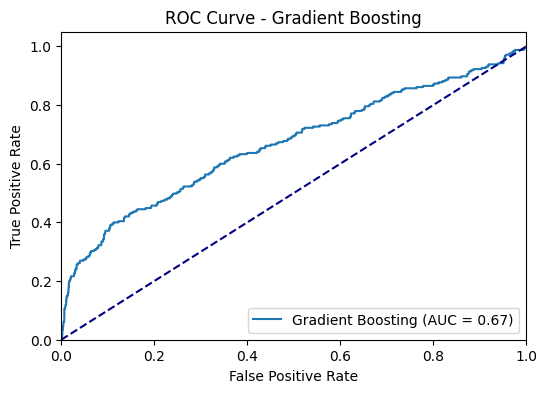



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
     

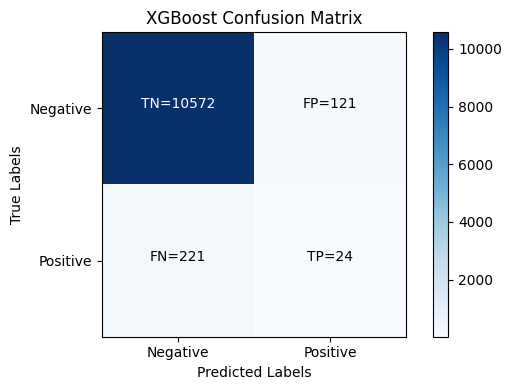


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.17      0.10      0.12       245

    accuracy                           0.97     10938
   macro avg       0.57      0.54      0.55     10938
weighted avg       0.96      0.97      0.96     10938



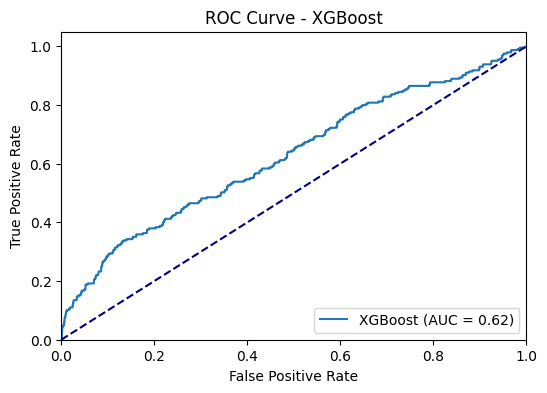



XGBoost finished.
___________________________________________________________________



In [152]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring='f1')

    used_scoring = 'f1'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_ADASYN = evaluation_df_ADASYN.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_ADASYN = evaluation_df_ADASYN.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [153]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_ADASYN.to_csv('model_evaluation_metrics_ADASYN.csv', index=False)
evaluation_df_ADASYN

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.516182,0.024317,0.526531,0.046486
1,Decision Tree,balanced,f1,0.965624,0.189573,0.163265,0.175439
2,Random Forest,balanced,f1,0.970196,0.265896,0.187755,0.220096
3,SGD,balanced,f1,0.565003,0.025646,0.497959,0.048780
4,KNN,None,f1,0.958310,0.127208,0.146939,0.136364
5,Gradient Boosting,None,f1,0.971567,0.225000,0.110204,0.147945
6,XGBoost,None,f1,0.973121,0.189873,0.061224,0.092593
7,Logistic Regression,None,f1,0.516274,0.024321,0.526531,0.046495
8,Decision Tree,None,f1,0.966264,0.190000,0.155102,0.170787
9,Random Forest,"{0: 1, 1: 2}",f1,0.967819,0.260090,0.236735,0.247863


#### CASE C: FINE TUNING (F2 SCORE) - INCLUDING CLASS WEIGHTS, WHERE FEASIBLE

In [154]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

In [155]:
beta=2.0

# Create a scorer using the custom scoring function
f_beta = make_scorer(custom_scoring, greater_is_better=True)

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.15 seconds.
-------------------------------------------------------------------



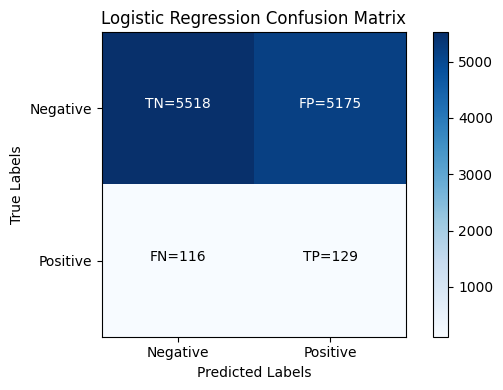


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.52      0.68     10693
           1       0.02      0.53      0.05       245

    accuracy                           0.52     10938
   macro avg       0.50      0.52      0.36     10938
weighted avg       0.96      0.52      0.66     10938



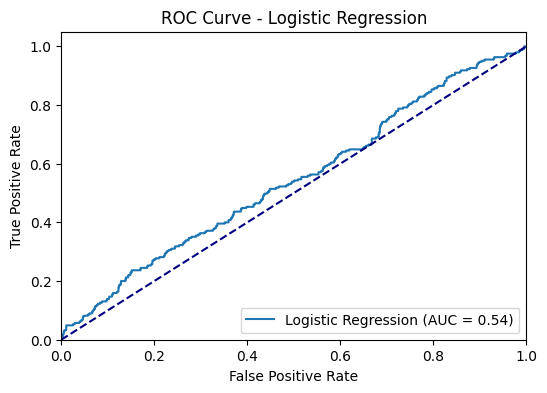



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42)...
DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42) training completed in 0.34 seconds.
-------------------------------------------------------------------



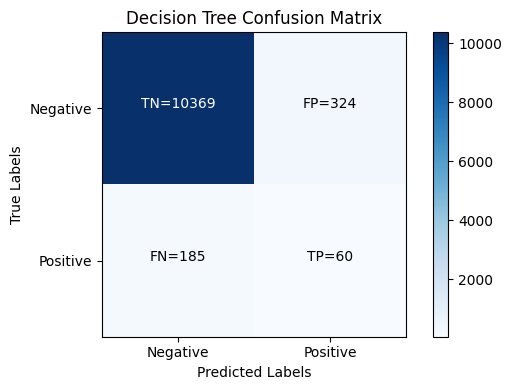


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.97      0.98     10693
           1       0.16      0.24      0.19       245

    accuracy                           0.95     10938
   macro avg       0.57      0.61      0.58     10938
weighted avg       0.96      0.95      0.96     10938



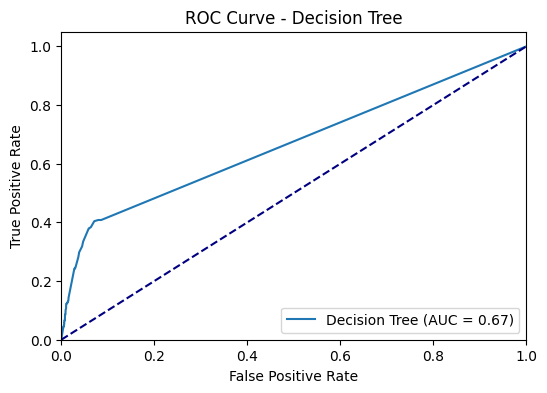



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_depth=10, max_features='log2', random_state=42)...
RandomForestClassifier(max_depth=10, max_features='log2', random_state=42) training completed in 3.60 seconds.
-------------------------------------------------------------------



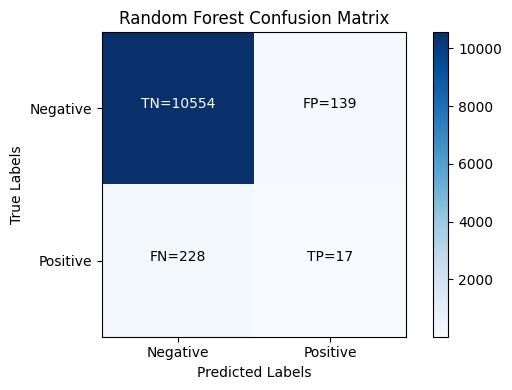


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.11      0.07      0.08       245

    accuracy                           0.97     10938
   macro avg       0.54      0.53      0.53     10938
weighted avg       0.96      0.97      0.96     10938



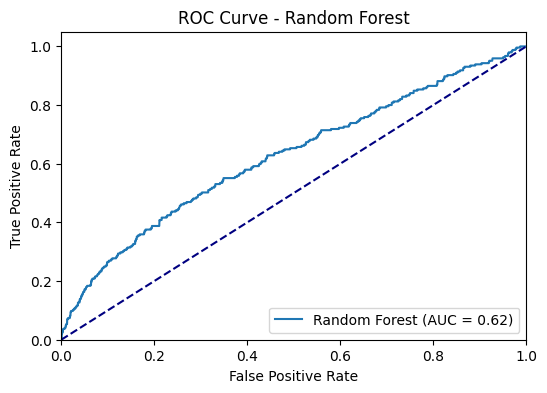



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.69 seconds.
-------------------------------------------------------------------



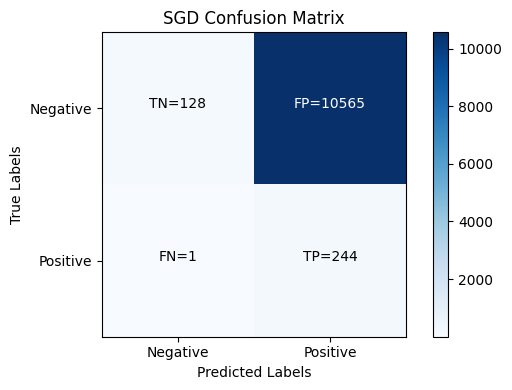


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.99      0.01      0.02     10693
           1       0.02      1.00      0.04       245

    accuracy                           0.03     10938
   macro avg       0.51      0.50      0.03     10938
weighted avg       0.97      0.03      0.02     10938



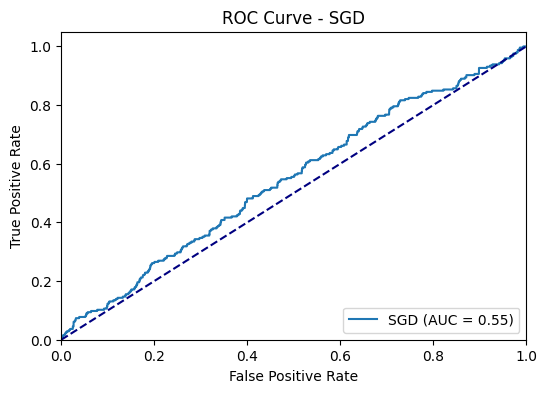



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean')...
KNeighborsClassifier(metric='euclidean') training completed in 0.01 seconds.
-------------------------------------------------------------------



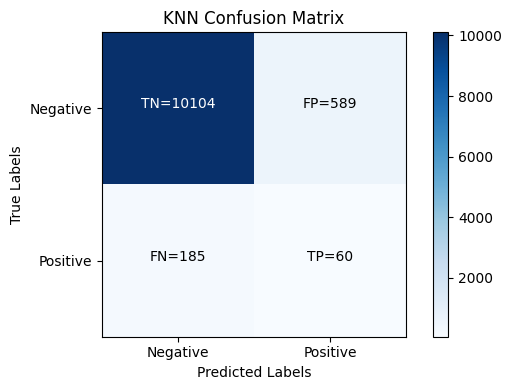


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.94      0.96     10693
           1       0.09      0.24      0.13       245

    accuracy                           0.93     10938
   macro avg       0.54      0.59      0.55     10938
weighted avg       0.96      0.93      0.94     10938



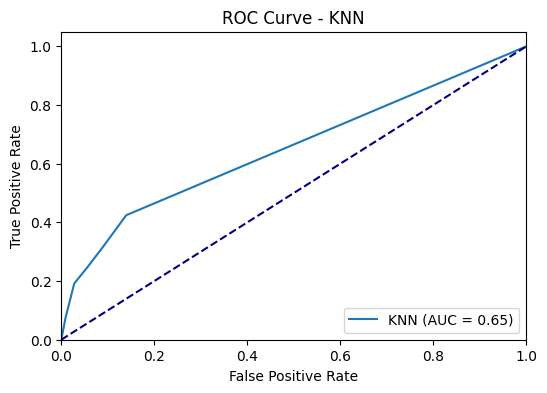



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(n_estimators=50, random_state=42)...
GradientBoostingClassifier(n_estimators=50, random_state=42) training completed in 7.11 seconds.
-------------------------------------------------------------------



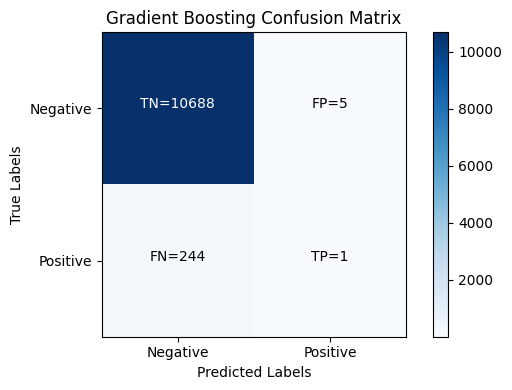


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     10693
           1       0.17      0.00      0.01       245

    accuracy                           0.98     10938
   macro avg       0.57      0.50      0.50     10938
weighted avg       0.96      0.98      0.97     10938



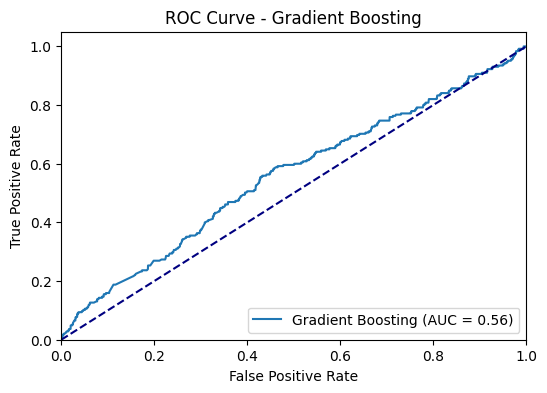



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

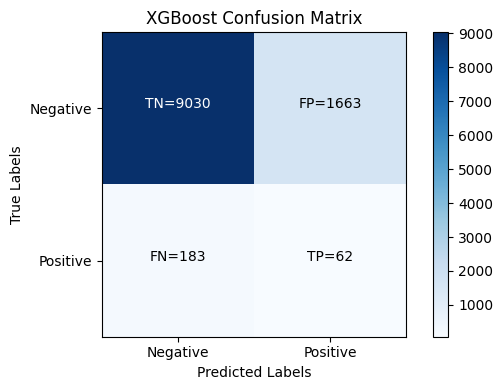


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.84      0.91     10693
           1       0.04      0.25      0.06       245

    accuracy                           0.83     10938
   macro avg       0.51      0.55      0.49     10938
weighted avg       0.96      0.83      0.89     10938



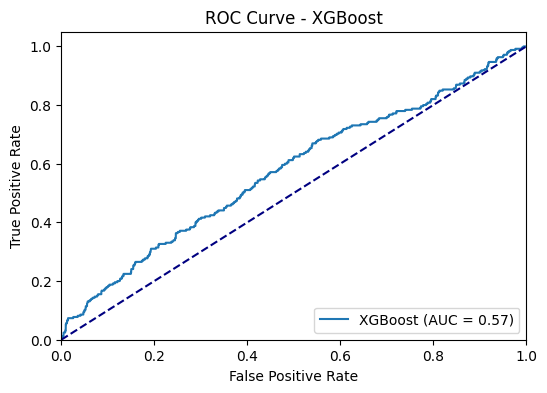



XGBoost finished.
___________________________________________________________________



In [156]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring=f_beta)

    used_scoring = 'f2'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_ADASYN = evaluation_df_ADASYN.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_ADASYN = evaluation_df_ADASYN.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [157]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_ADASYN.to_csv('model_evaluation_metrics_ADASYN.csv', index=False)
evaluation_df_ADASYN

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.516182,0.024317,0.526531,0.046486
1,Decision Tree,balanced,f1,0.965624,0.189573,0.163265,0.175439
2,Random Forest,balanced,f1,0.970196,0.265896,0.187755,0.220096
3,SGD,balanced,f1,0.565003,0.025646,0.497959,0.048780
4,KNN,None,f1,0.958310,0.127208,0.146939,0.136364
5,Gradient Boosting,None,f1,0.971567,0.225000,0.110204,0.147945
6,XGBoost,None,f1,0.973121,0.189873,0.061224,0.092593
7,Logistic Regression,None,f1,0.516274,0.024321,0.526531,0.046495
8,Decision Tree,None,f1,0.966264,0.190000,0.155102,0.170787
9,Random Forest,"{0: 1, 1: 2}",f1,0.967819,0.260090,0.236735,0.247863


#### CASE D: CASE C + PREVIOUS PCA

In [158]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

In [159]:
# Apply PCA for dimensionality reduction
num_pca_components = 20
pca = PCA(n_components=num_pca_components)
X_train_resampled_pca = pca.fit_transform(X_train_resampled)
X_test_preprocessed_pca = pca.transform(X_test_preprocessed)

selected_feature_names = [f'PCA_{i+1}' for i in range(X_train_resampled_pca.shape[1])]

X_test_pca_df = pd.DataFrame(X_test_preprocessed_pca, columns=selected_feature_names)

In [160]:
# Add a new column named "PCA" with value "no"
evaluation_df_ADASYN['PCA'] = 'no'

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.05 seconds.
-------------------------------------------------------------------



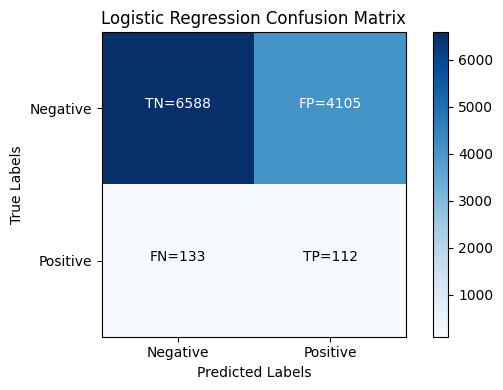


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.62      0.76     10693
           1       0.03      0.46      0.05       245

    accuracy                           0.61     10938
   macro avg       0.50      0.54      0.40     10938
weighted avg       0.96      0.61      0.74     10938



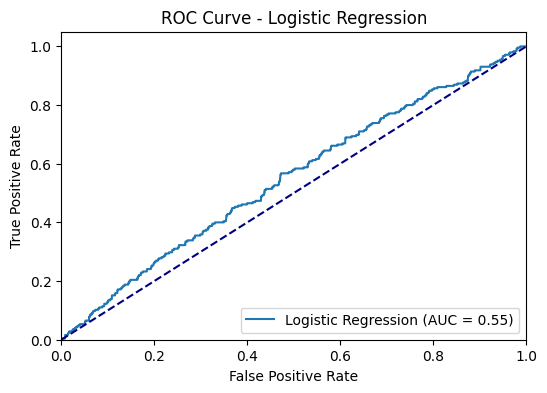



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42)...
DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42) training completed in 2.93 seconds.
-------------------------------------------------------------------



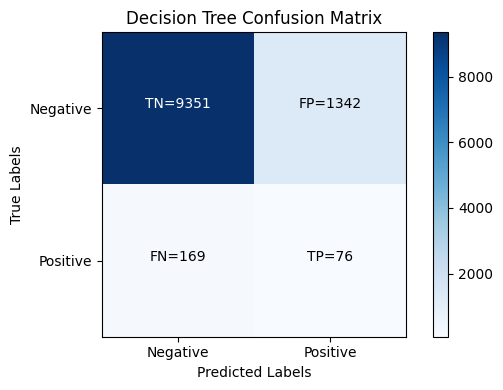


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.87      0.93     10693
           1       0.05      0.31      0.09       245

    accuracy                           0.86     10938
   macro avg       0.52      0.59      0.51     10938
weighted avg       0.96      0.86      0.91     10938



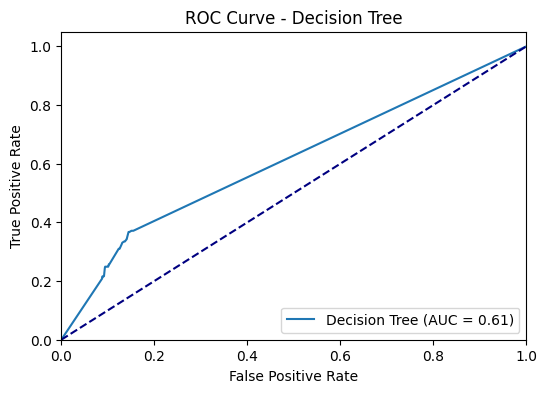



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_depth=10, max_features='log2', random_state=42)...
RandomForestClassifier(max_depth=10, max_features='log2', random_state=42) training completed in 18.97 seconds.
-------------------------------------------------------------------



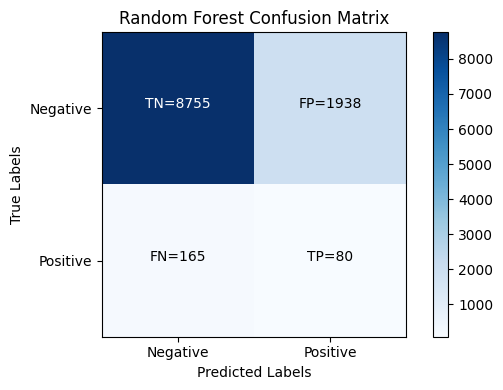


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.82      0.89     10693
           1       0.04      0.33      0.07       245

    accuracy                           0.81     10938
   macro avg       0.51      0.57      0.48     10938
weighted avg       0.96      0.81      0.87     10938



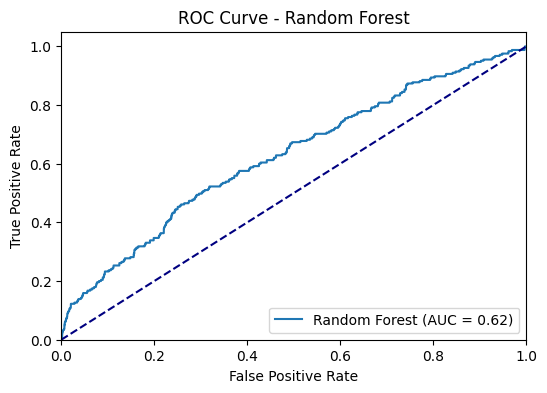



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.16 seconds.
-------------------------------------------------------------------



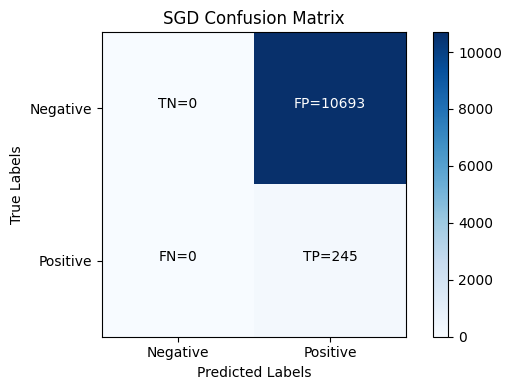


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     10693
           1       0.02      1.00      0.04       245

    accuracy                           0.02     10938
   macro avg       0.01      0.50      0.02     10938
weighted avg       0.00      0.02      0.00     10938



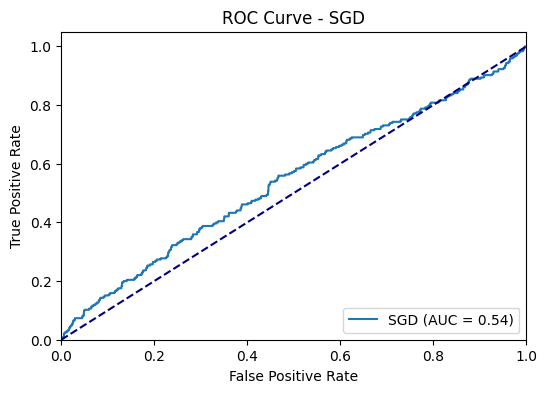



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean')...
KNeighborsClassifier(metric='euclidean') training completed in 0.01 seconds.
-------------------------------------------------------------------



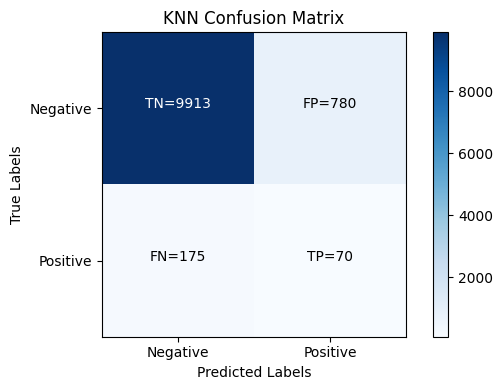


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.93      0.95     10693
           1       0.08      0.29      0.13       245

    accuracy                           0.91     10938
   macro avg       0.53      0.61      0.54     10938
weighted avg       0.96      0.91      0.94     10938



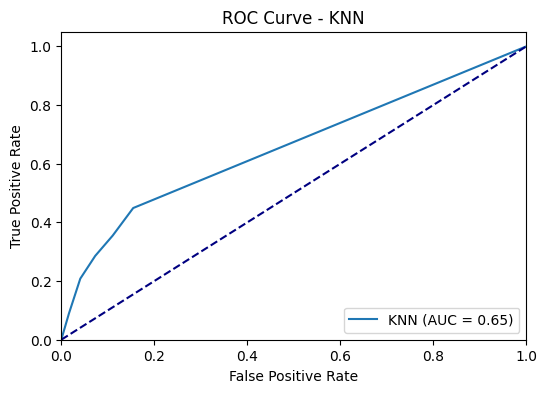



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(n_estimators=50, random_state=42)...
GradientBoostingClassifier(n_estimators=50, random_state=42) training completed in 23.52 seconds.
-------------------------------------------------------------------



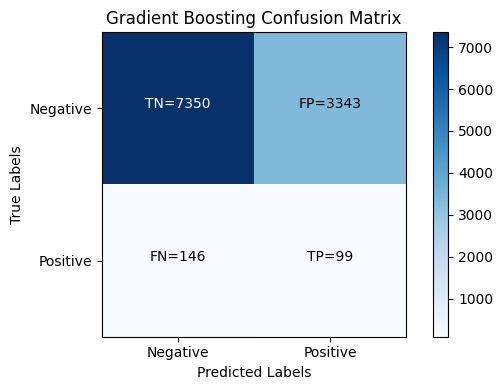


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.69      0.81     10693
           1       0.03      0.40      0.05       245

    accuracy                           0.68     10938
   macro avg       0.50      0.55      0.43     10938
weighted avg       0.96      0.68      0.79     10938



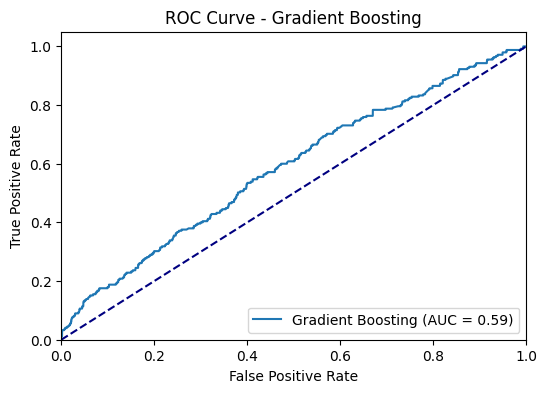



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

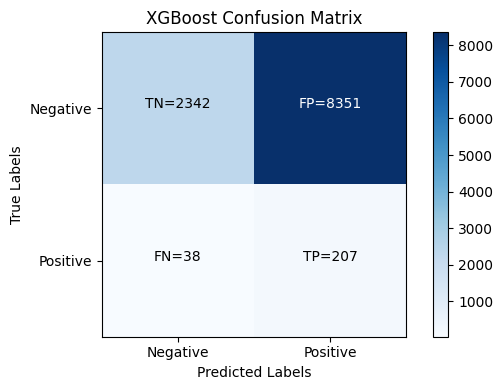


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.22      0.36     10693
           1       0.02      0.84      0.05       245

    accuracy                           0.23     10938
   macro avg       0.50      0.53      0.20     10938
weighted avg       0.96      0.23      0.35     10938



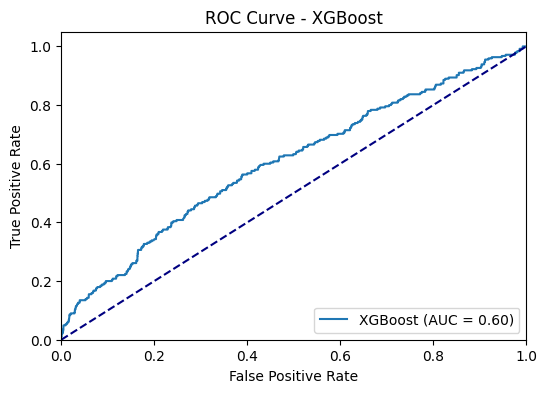



XGBoost finished.
___________________________________________________________________



In [161]:
# Train, fine-tune, and evaluate models
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring=f_beta)

    used_scoring = 'f2'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled_pca, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed_pca)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_ADASYN = evaluation_df_ADASYN.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'PCA': 'yes'
        }, ignore_index=True)
    else:
        evaluation_df_ADASYN = evaluation_df_ADASYN.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'PCA': 'yes'
        }, ignore_index=True)

In [162]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_ADASYN.to_csv('model_evaluation_metrics_ADASYN.csv', index=False)
evaluation_df_ADASYN

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score,PCA
0,Logistic Regression,balanced,f1,0.516182,0.024317,0.526531,0.046486,no
1,Decision Tree,balanced,f1,0.965624,0.189573,0.163265,0.175439,no
2,Random Forest,balanced,f1,0.970196,0.265896,0.187755,0.220096,no
3,SGD,balanced,f1,0.565003,0.025646,0.497959,0.048780,no
4,KNN,None,f1,0.958310,0.127208,0.146939,0.136364,no
5,Gradient Boosting,None,f1,0.971567,0.225000,0.110204,0.147945,no
6,XGBoost,None,f1,0.973121,0.189873,0.061224,0.092593,no
7,Logistic Regression,None,f1,0.516274,0.024321,0.526531,0.046495,no
8,Decision Tree,None,f1,0.966264,0.190000,0.155102,0.170787,no
9,Random Forest,"{0: 1, 1: 2}",f1,0.967819,0.260090,0.236735,0.247863,no


## PREPROCESS TECHNIQUE: SMOTEENN

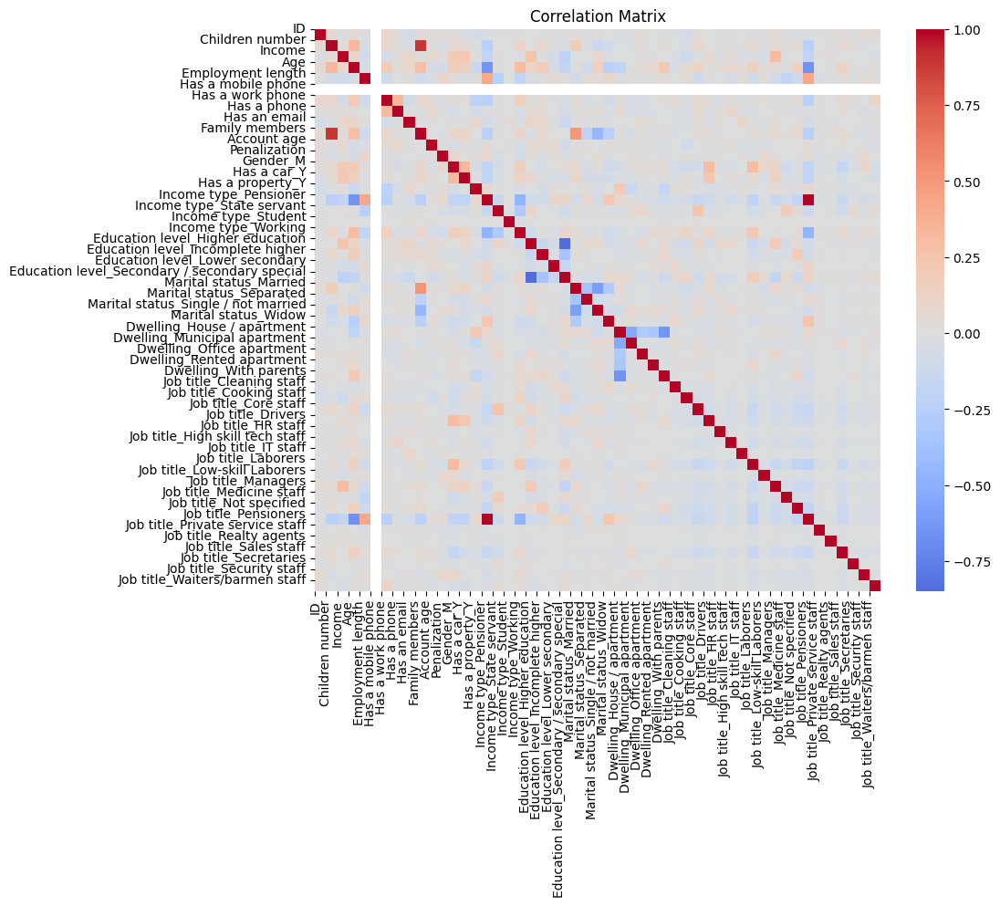

In [78]:
categorical_features = X.select_dtypes(include=['object']).columns.tolist()
X_train_resampled, X_test_preprocessed, y_train_resampled = preprocess_data(X_train, X_test, categorical_features, resampling_technique='smoteenn')

corr_matrix = X_train_resampled.corr()
feature_names = X_train_resampled.columns
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0)
plt.title(f'Correlation Matrix')
plt.xticks(ticks=range(len(feature_names)), labels=feature_names, rotation=90)
plt.yticks(ticks=range(len(feature_names)), labels=feature_names, rotation=0)
plt.show()

### FEATURES CORRELATION

In [79]:
X_train_resampled=X_train_resampled.drop(['Penalization','ID', 'Has a mobile phone', 'Account age'], axis=1)
X_test_preprocessed=X_test_preprocessed.drop(['Penalization','ID', 'Has a mobile phone', 'Account age'], axis=1)

In [80]:
X_train_resampled=X_train_resampled.drop(['Children number', 'Job title_Pensioners', 'Education level_Higher education',
                                          'Income type_Pensioner', 'Dwelling_With parents'], axis=1)
X_test_preprocessed=X_test_preprocessed.drop(['Children number', 'Job title_Pensioners', 'Education level_Higher education',
                                          'Income type_Pensioner', 'Dwelling_With parents'], axis=1)

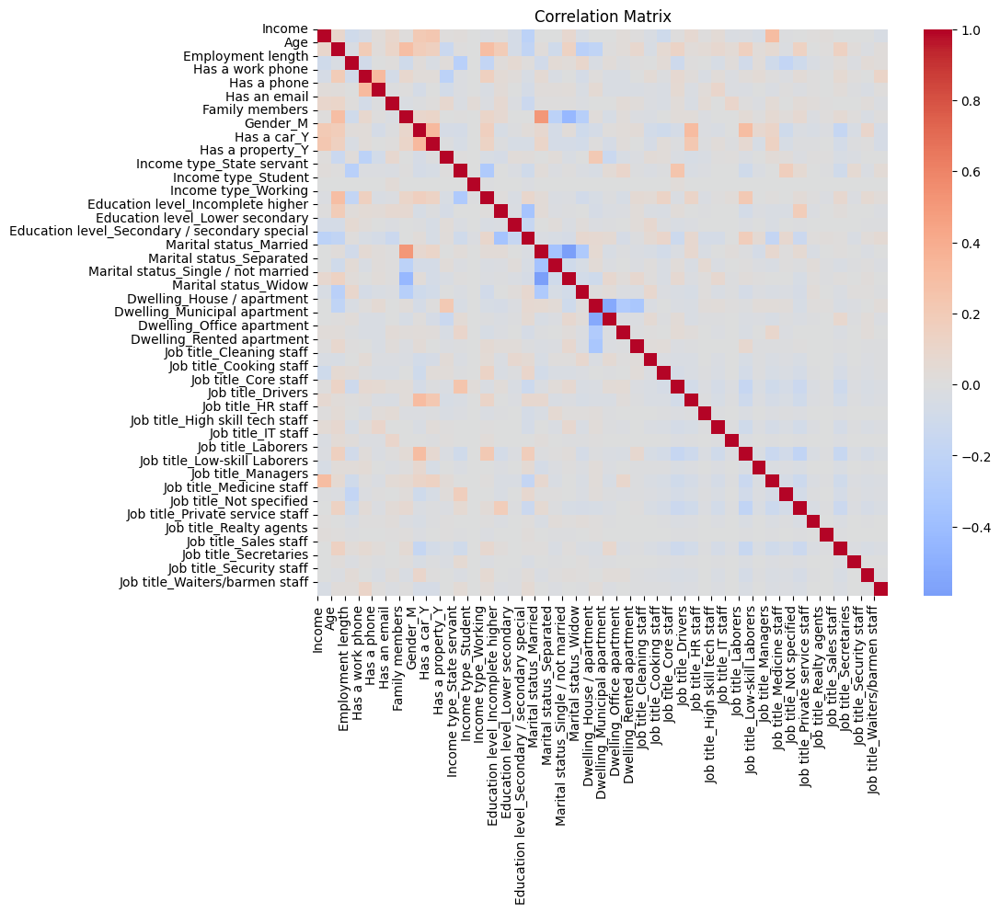

In [81]:
corr_matrix = X_train_resampled.corr()
feature_names = X_train_resampled.columns
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0)
plt.title(f'Correlation Matrix')
plt.xticks(ticks=range(len(feature_names)), labels=feature_names, rotation=90)
plt.yticks(ticks=range(len(feature_names)), labels=feature_names, rotation=0)
plt.show()

In [82]:
y_train_resampled.value_counts(normalize=True)

1    0.504183
0    0.495817
Name: Risk, dtype: float64

### TRAINING AND TESTING

*Exactly the same procedure as per SMOTE sampling technique...*

#### CASE A: FINE TUNING (F1 SCORE) - CLASS WEIGHTS FIXED TO 'BALANCED', WHERE FEASIBLE

In [83]:
# Dictionary of models and their corresponding hyperparameter grids for RandomizedSearchCV - BALANCED WEIGHT WHERE FEASIBLE
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001, class_weight='balanced'), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs']
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42, class_weight='balanced'), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0, class_weight='balanced'), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3]
    }),
    'SGD': (SGDClassifier(random_state=42, class_weight='balanced', loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0]
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0]
    })

}

In [84]:
# Initialize an empty DataFrame to store the evaluation metrics
evaluation_df_SMOTEENN = pd.DataFrame(columns=['Model Name', 'Class Weights', 'Scoring Parameter', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])

Fine-tuning Logistic Regression...
Training LogisticRegression(C=10, class_weight='balanced', max_iter=1000, penalty='l1',
                   random_state=42, solver='liblinear', tol=0.001)...
LogisticRegression(C=10, class_weight='balanced', max_iter=1000, penalty='l1',
                   random_state=42, solver='liblinear', tol=0.001) training completed in 0.30 seconds.
-------------------------------------------------------------------



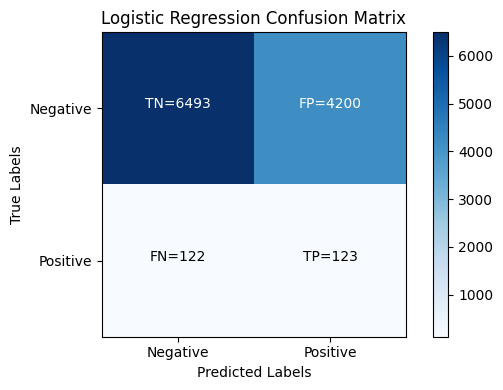


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.61      0.75     10693
           1       0.03      0.50      0.05       245

    accuracy                           0.60     10938
   macro avg       0.51      0.55      0.40     10938
weighted avg       0.96      0.60      0.73     10938



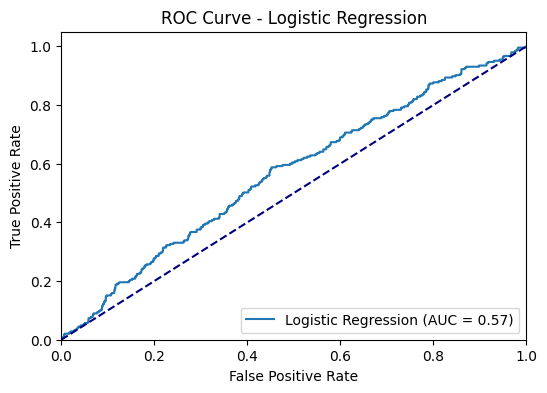



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42)...
DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42) training completed in 0.33 seconds.
-------------------------------------------------------------------



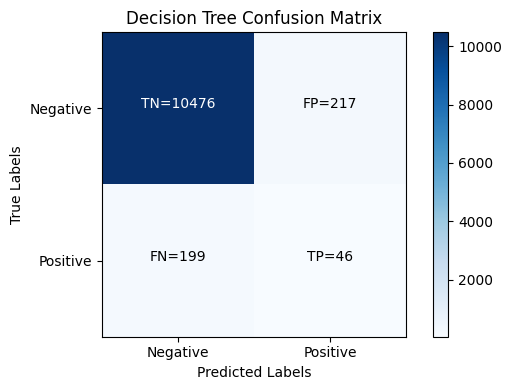


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.17      0.19      0.18       245

    accuracy                           0.96     10938
   macro avg       0.58      0.58      0.58     10938
weighted avg       0.96      0.96      0.96     10938



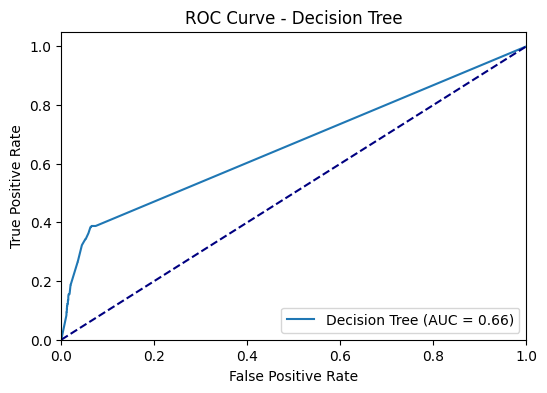



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(class_weight='balanced', max_features='log2',
                       min_samples_split=5, random_state=42)...
RandomForestClassifier(class_weight='balanced', max_features='log2',
                       min_samples_split=5, random_state=42) training completed in 4.94 seconds.
-------------------------------------------------------------------



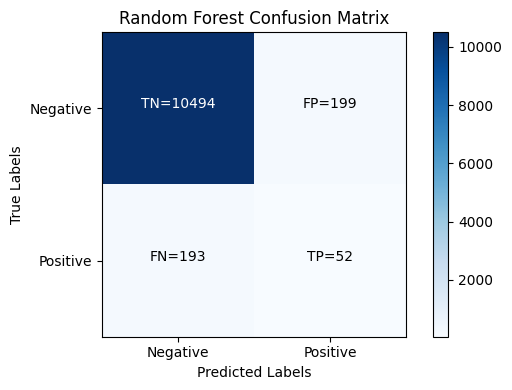


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.21      0.21      0.21       245

    accuracy                           0.96     10938
   macro avg       0.59      0.60      0.60     10938
weighted avg       0.96      0.96      0.96     10938



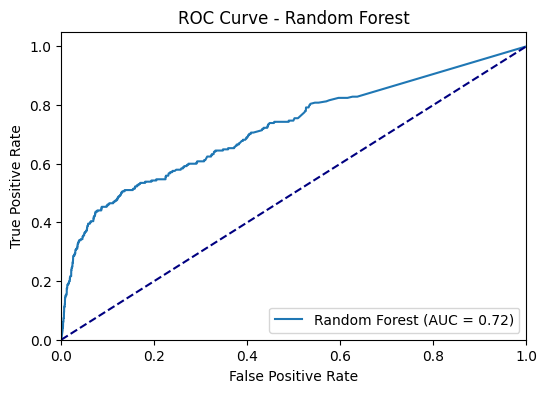



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.001, class_weight='balanced', loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.001, class_weight='balanced', loss='log', penalty='l1',
              random_state=42) training completed in 0.31 seconds.
-------------------------------------------------------------------



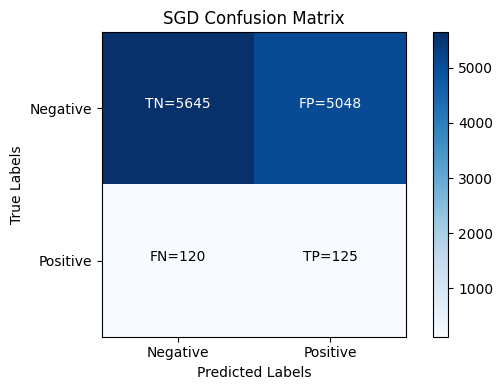


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.98      0.53      0.69     10693
           1       0.02      0.51      0.05       245

    accuracy                           0.53     10938
   macro avg       0.50      0.52      0.37     10938
weighted avg       0.96      0.53      0.67     10938



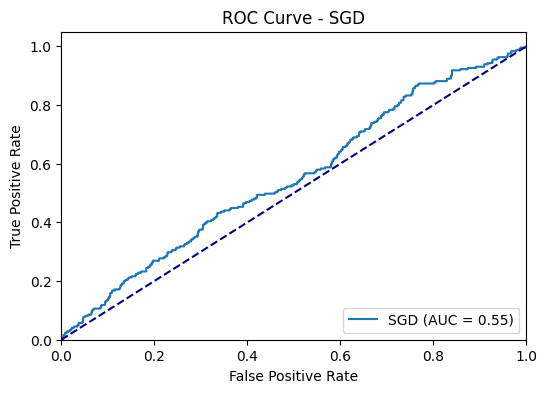



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance')...
KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance') training completed in 0.01 seconds.
-------------------------------------------------------------------



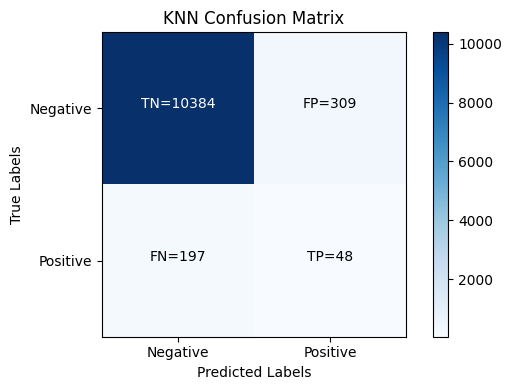


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.97      0.98     10693
           1       0.13      0.20      0.16       245

    accuracy                           0.95     10938
   macro avg       0.56      0.58      0.57     10938
weighted avg       0.96      0.95      0.96     10938



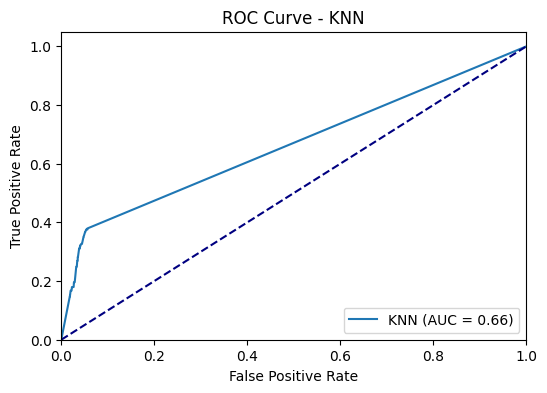



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)...
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8) training completed in 37.98 seconds.
-------------------------------------------------------------------



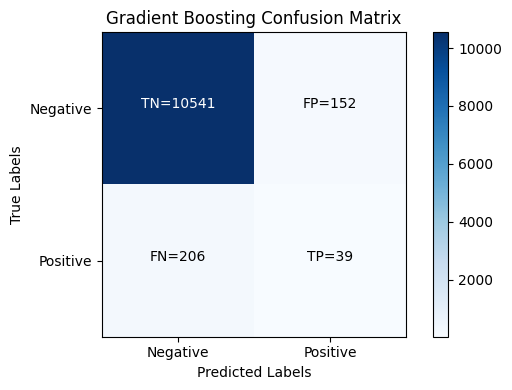


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.20      0.16      0.18       245

    accuracy                           0.97     10938
   macro avg       0.59      0.57      0.58     10938
weighted avg       0.96      0.97      0.97     10938



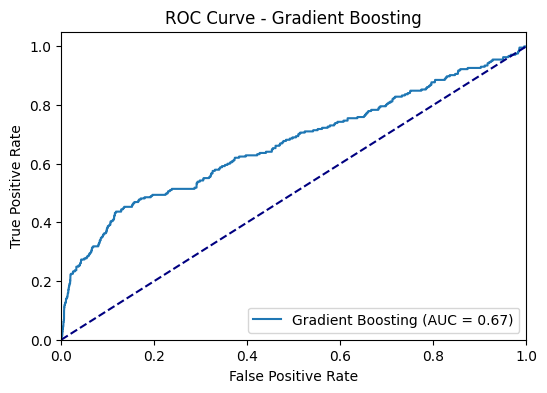



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

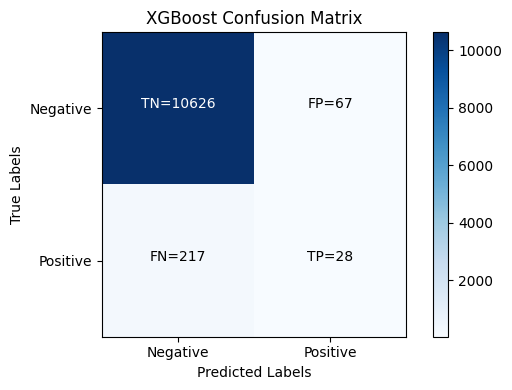


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     10693
           1       0.29      0.11      0.16       245

    accuracy                           0.97     10938
   macro avg       0.64      0.55      0.58     10938
weighted avg       0.96      0.97      0.97     10938



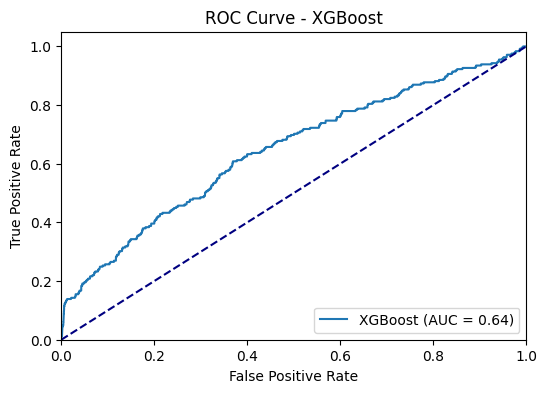



XGBoost finished.
___________________________________________________________________



In [85]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring='f1')

    used_scoring = 'f1'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_SMOTEENN = evaluation_df_SMOTEENN.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_SMOTEENN = evaluation_df_SMOTEENN.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [86]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_SMOTEENN.to_csv('model_evaluation_metrics_SMOTEENN.csv', index=False)
evaluation_df_SMOTEENN

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.604864,0.028452,0.502041,0.053853
1,Decision Tree,balanced,f1,0.961967,0.174905,0.187755,0.181102
2,Random Forest,balanced,f1,0.964162,0.207171,0.212245,0.209677
3,SGD,balanced,f1,0.527519,0.024164,0.510204,0.046142
4,KNN,None,f1,0.953739,0.134454,0.195918,0.159468
5,Gradient Boosting,None,f1,0.967270,0.204188,0.159184,0.178899
6,XGBoost,None,f1,0.974035,0.294737,0.114286,0.164706


#### CASE B: FINE TUNING (F1 SCORE) - INCLUDING CLASS WEIGHTS, WHERE FEASIBLE

In [87]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

Fine-tuning Logistic Regression...
Training LogisticRegression(C=10, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=10, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.38 seconds.
-------------------------------------------------------------------



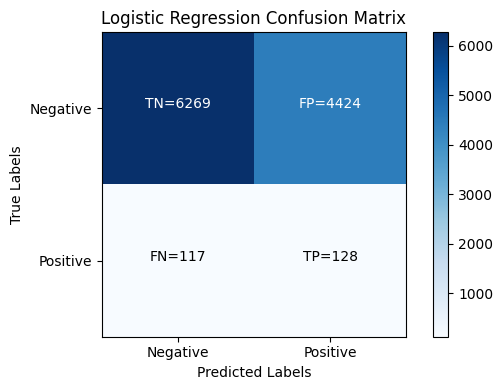


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.59      0.73     10693
           1       0.03      0.52      0.05       245

    accuracy                           0.58     10938
   macro avg       0.50      0.55      0.39     10938
weighted avg       0.96      0.58      0.72     10938



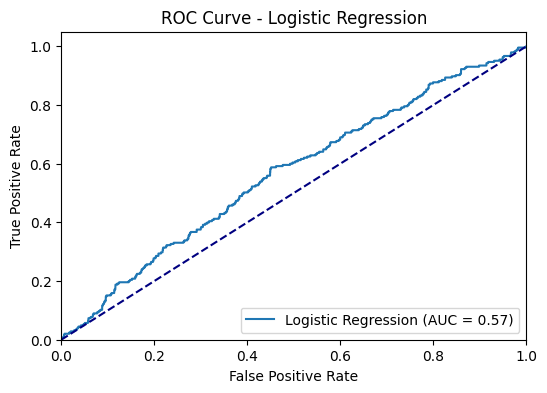



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42)...
DecisionTreeClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, min_samples_split=5,
                       random_state=42) training completed in 0.34 seconds.
-------------------------------------------------------------------



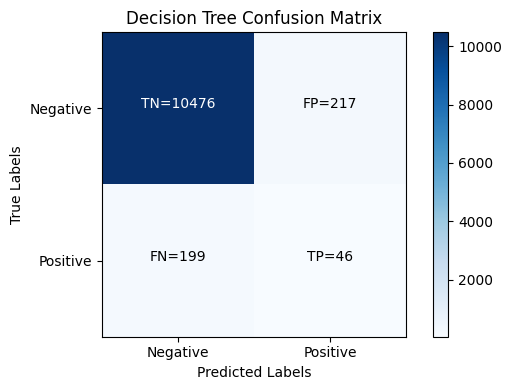


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.17      0.19      0.18       245

    accuracy                           0.96     10938
   macro avg       0.58      0.58      0.58     10938
weighted avg       0.96      0.96      0.96     10938



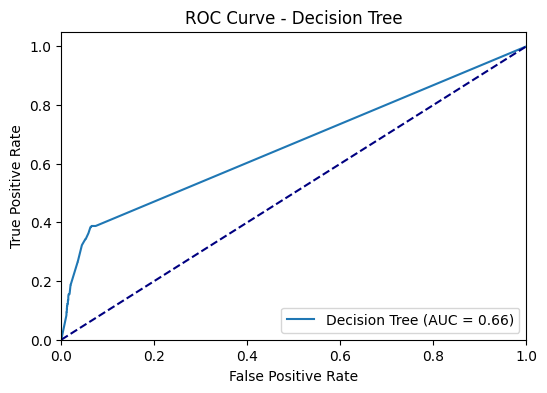



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_features='log2', n_estimators=200, random_state=42)...
RandomForestClassifier(max_features='log2', n_estimators=200, random_state=42) training completed in 10.07 seconds.
-------------------------------------------------------------------



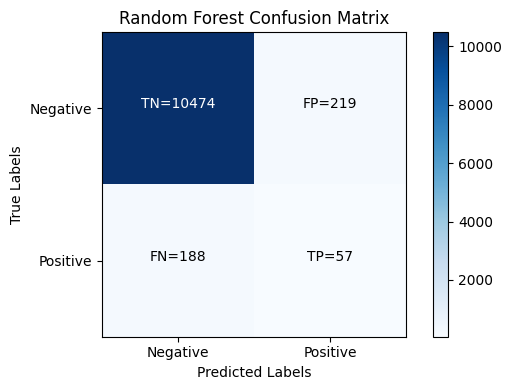


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.21      0.23      0.22       245

    accuracy                           0.96     10938
   macro avg       0.59      0.61      0.60     10938
weighted avg       0.96      0.96      0.96     10938



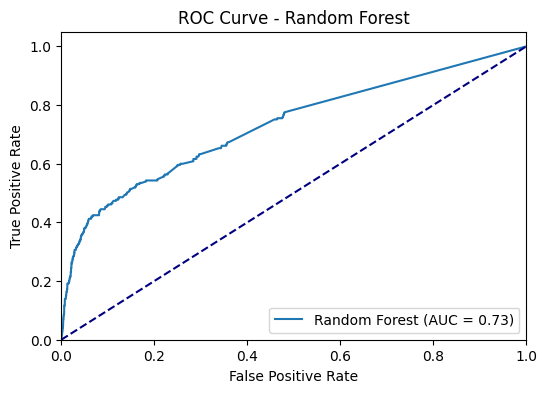



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log',
              random_state=42) training completed in 0.18 seconds.
-------------------------------------------------------------------



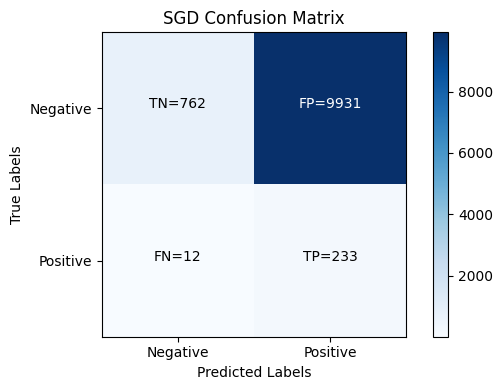


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.98      0.07      0.13     10693
           1       0.02      0.95      0.04       245

    accuracy                           0.09     10938
   macro avg       0.50      0.51      0.09     10938
weighted avg       0.96      0.09      0.13     10938



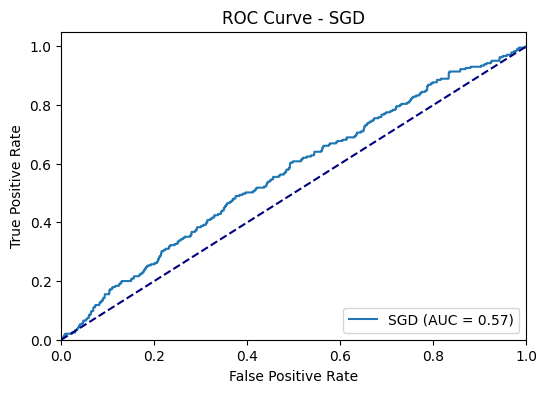



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance')...
KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance') training completed in 0.01 seconds.
-------------------------------------------------------------------



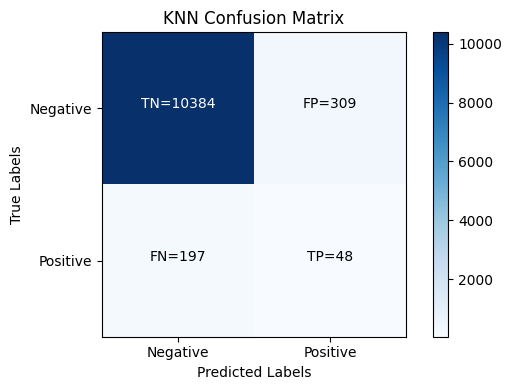


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.97      0.98     10693
           1       0.13      0.20      0.16       245

    accuracy                           0.95     10938
   macro avg       0.56      0.58      0.57     10938
weighted avg       0.96      0.95      0.96     10938



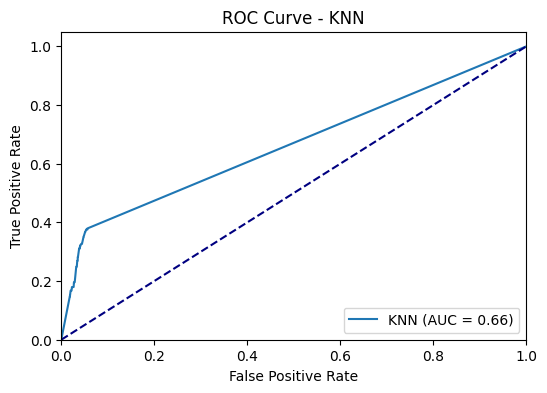



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)...
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8) training completed in 37.96 seconds.
-------------------------------------------------------------------



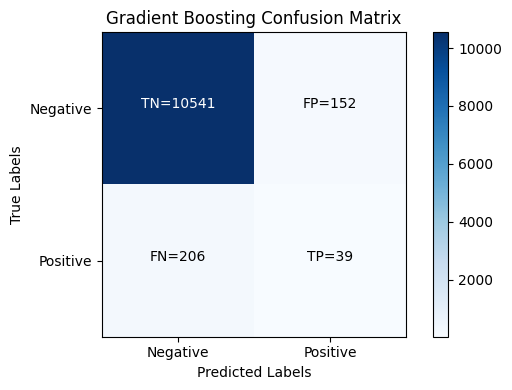


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     10693
           1       0.20      0.16      0.18       245

    accuracy                           0.97     10938
   macro avg       0.59      0.57      0.58     10938
weighted avg       0.96      0.97      0.97     10938



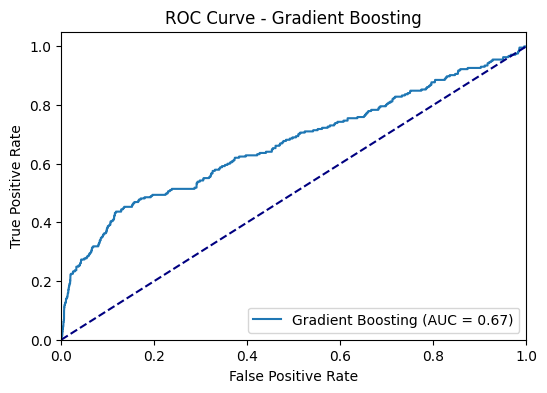



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
     

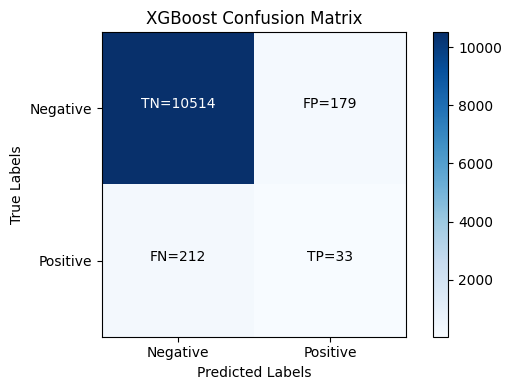


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.16      0.13      0.14       245

    accuracy                           0.96     10938
   macro avg       0.57      0.56      0.56     10938
weighted avg       0.96      0.96      0.96     10938



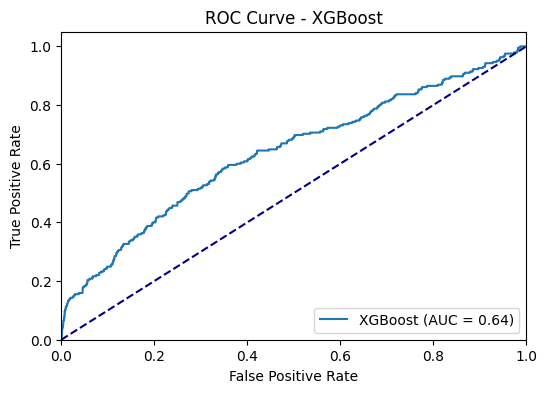



XGBoost finished.
___________________________________________________________________



In [88]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring='f1')

    used_scoring = 'f1'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_SMOTEENN = evaluation_df_SMOTEENN.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_SMOTEENN = evaluation_df_SMOTEENN.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [89]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_SMOTEENN.to_csv('model_evaluation_metrics_SMOTEENN.csv', index=False)
evaluation_df_SMOTEENN

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.604864,0.028452,0.502041,0.053853
1,Decision Tree,balanced,f1,0.961967,0.174905,0.187755,0.181102
2,Random Forest,balanced,f1,0.964162,0.207171,0.212245,0.209677
3,SGD,balanced,f1,0.527519,0.024164,0.510204,0.046142
4,KNN,None,f1,0.953739,0.134454,0.195918,0.159468
5,Gradient Boosting,None,f1,0.967270,0.204188,0.159184,0.178899
6,XGBoost,None,f1,0.974035,0.294737,0.114286,0.164706
7,Logistic Regression,None,f1,0.584842,0.028120,0.522449,0.053367
8,Decision Tree,balanced,f1,0.961967,0.174905,0.187755,0.181102
9,Random Forest,None,f1,0.962790,0.206522,0.232653,0.218810


#### CASE C: FINE TUNING (F2 SCORE) - INCLUDING CLASS WEIGHTS, WHERE FEASIBLE

In [90]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

In [91]:
beta=2.0

# Create a scorer using the custom scoring function
f_beta = make_scorer(custom_scoring, greater_is_better=True)

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.12 seconds.
-------------------------------------------------------------------



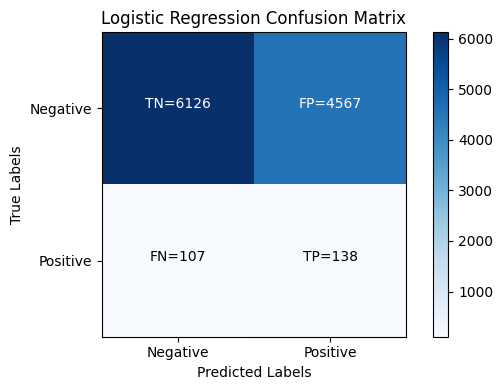


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.57      0.72     10693
           1       0.03      0.56      0.06       245

    accuracy                           0.57     10938
   macro avg       0.51      0.57      0.39     10938
weighted avg       0.96      0.57      0.71     10938



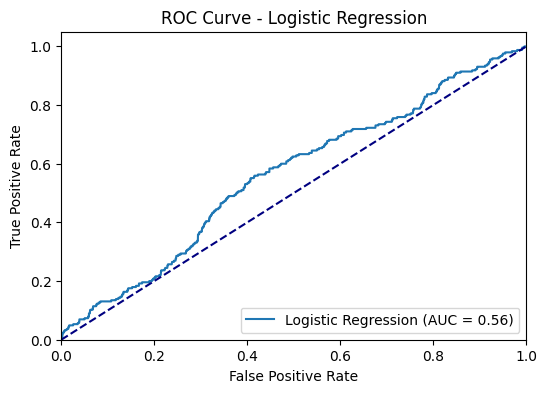



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42)...
DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42) training completed in 0.51 seconds.
-------------------------------------------------------------------



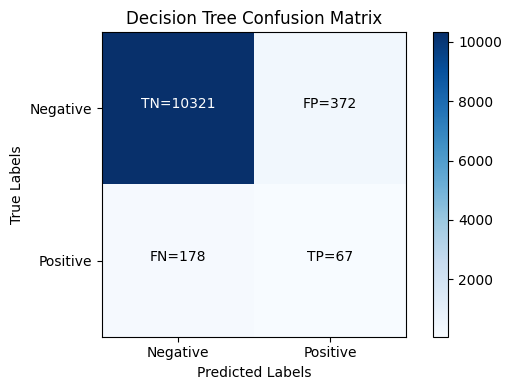


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.97      0.97     10693
           1       0.15      0.27      0.20       245

    accuracy                           0.95     10938
   macro avg       0.57      0.62      0.58     10938
weighted avg       0.96      0.95      0.96     10938



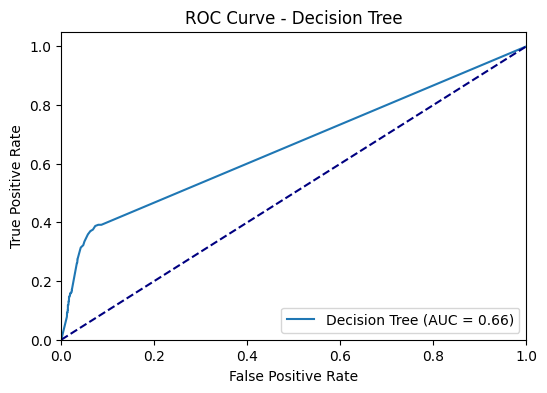



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_depth=10, max_features='log2', random_state=42)...
RandomForestClassifier(max_depth=10, max_features='log2', random_state=42) training completed in 4.18 seconds.
-------------------------------------------------------------------



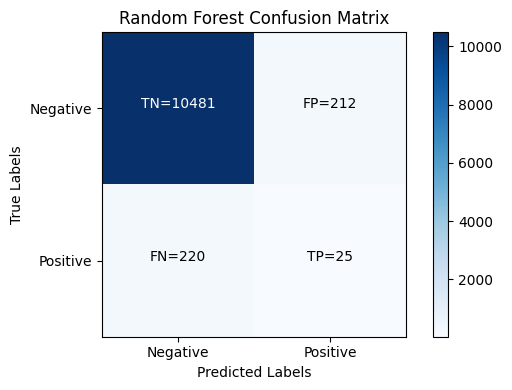


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10693
           1       0.11      0.10      0.10       245

    accuracy                           0.96     10938
   macro avg       0.54      0.54      0.54     10938
weighted avg       0.96      0.96      0.96     10938



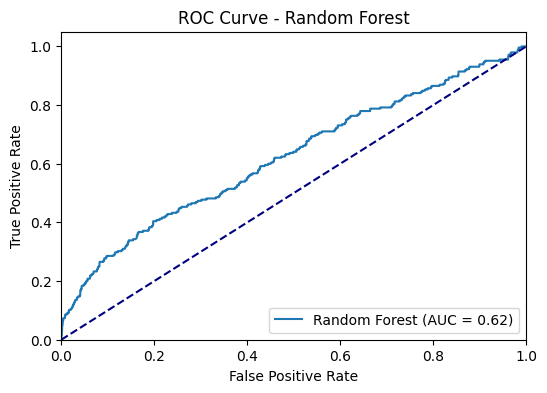



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.35 seconds.
-------------------------------------------------------------------



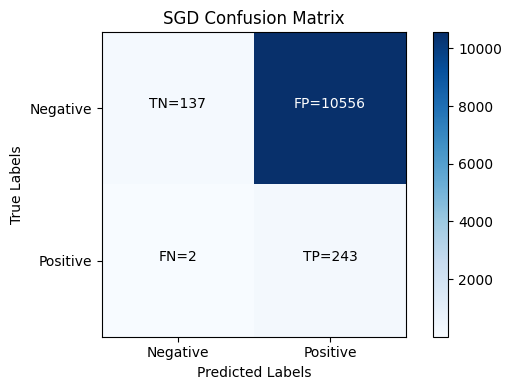


Classification Report for SGD:

              precision    recall  f1-score   support

           0       0.99      0.01      0.03     10693
           1       0.02      0.99      0.04       245

    accuracy                           0.03     10938
   macro avg       0.50      0.50      0.03     10938
weighted avg       0.96      0.03      0.03     10938



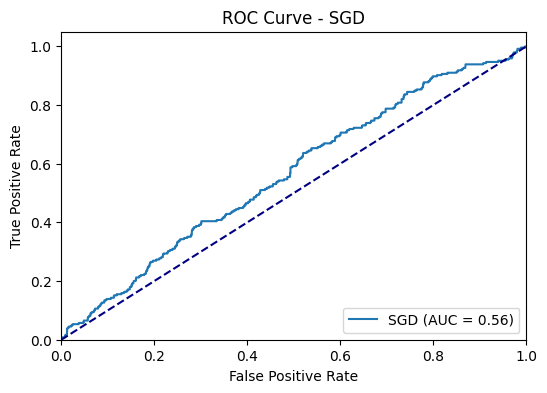



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean')...
KNeighborsClassifier(metric='euclidean') training completed in 0.01 seconds.
-------------------------------------------------------------------



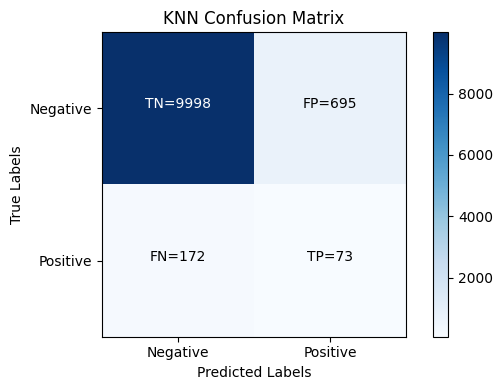


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.94      0.96     10693
           1       0.10      0.30      0.14       245

    accuracy                           0.92     10938
   macro avg       0.54      0.62      0.55     10938
weighted avg       0.96      0.92      0.94     10938



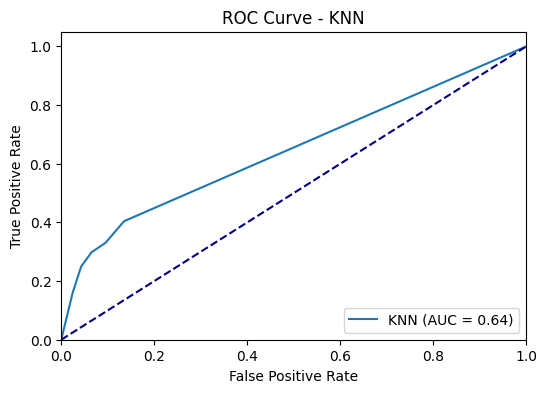



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(n_estimators=50, random_state=42)...
GradientBoostingClassifier(n_estimators=50, random_state=42) training completed in 7.13 seconds.
-------------------------------------------------------------------



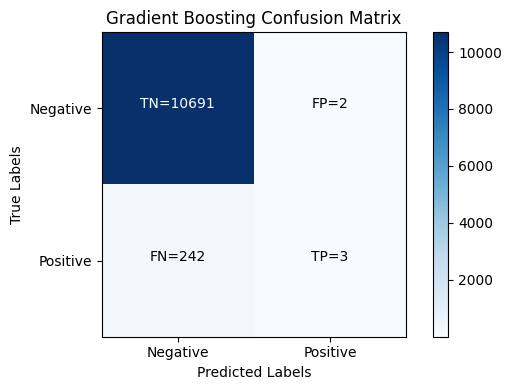


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     10693
           1       0.60      0.01      0.02       245

    accuracy                           0.98     10938
   macro avg       0.79      0.51      0.51     10938
weighted avg       0.97      0.98      0.97     10938



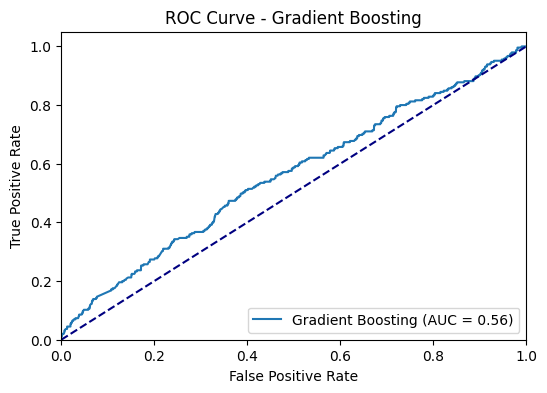



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

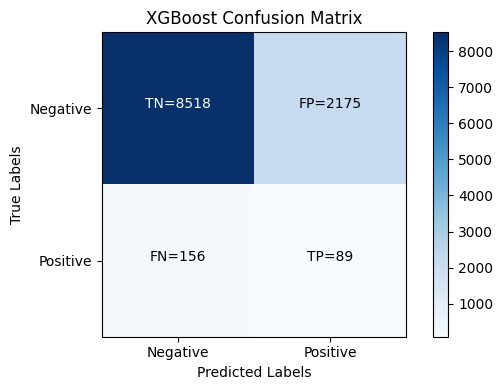


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.80      0.88     10693
           1       0.04      0.36      0.07       245

    accuracy                           0.79     10938
   macro avg       0.51      0.58      0.48     10938
weighted avg       0.96      0.79      0.86     10938



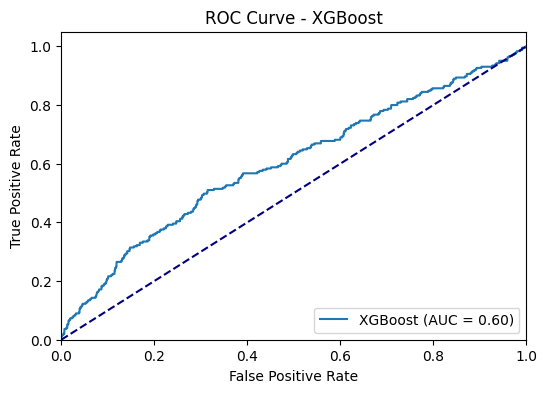



XGBoost finished.
___________________________________________________________________



In [92]:
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring=f_beta)

    used_scoring = 'f2'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_SMOTEENN = evaluation_df_SMOTEENN.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)
    else:
        evaluation_df_SMOTEENN = evaluation_df_SMOTEENN.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }, ignore_index=True)

In [93]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_SMOTEENN.to_csv('model_evaluation_metrics_SMOTEENN.csv', index=False)
evaluation_df_SMOTEENN

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,balanced,f1,0.604864,0.028452,0.502041,0.053853
1,Decision Tree,balanced,f1,0.961967,0.174905,0.187755,0.181102
2,Random Forest,balanced,f1,0.964162,0.207171,0.212245,0.209677
3,SGD,balanced,f1,0.527519,0.024164,0.510204,0.046142
4,KNN,None,f1,0.953739,0.134454,0.195918,0.159468
5,Gradient Boosting,None,f1,0.967270,0.204188,0.159184,0.178899
6,XGBoost,None,f1,0.974035,0.294737,0.114286,0.164706
7,Logistic Regression,None,f1,0.584842,0.028120,0.522449,0.053367
8,Decision Tree,balanced,f1,0.961967,0.174905,0.187755,0.181102
9,Random Forest,None,f1,0.962790,0.206522,0.232653,0.218810


#### CASE D: CASE C + PREVIOUS PCA

In [94]:
models = {
    'Logistic Regression': (LogisticRegression(random_state=42, max_iter=1000, verbose=0, tol=0.001), {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'lbfgs'],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'Random Forest': (RandomForestClassifier(random_state=42, verbose=0), {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 3],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'SGD': (SGDClassifier(random_state=42, loss='log'), {
        'alpha': [0.001, 0.01],
        'penalty': ['l1', 'l2'],
        'max_iter': [1000],
        'tol': [0.001],
        'class_weight': [None, 'balanced', {0: 1, 1: 2}]
    }),
    'KNN': (KNeighborsClassifier(), {
        'n_neighbors': [5, 7],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'subsample': [0.8, 1.0],
    }),
    'XGBoost': (XGBClassifier(random_state=42), {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [None, 2, 5]
    })
}

In [95]:
# Apply PCA for dimensionality reduction
num_pca_components = 20
pca = PCA(n_components=num_pca_components)
X_train_resampled_pca = pca.fit_transform(X_train_resampled)
X_test_preprocessed_pca = pca.transform(X_test_preprocessed)

selected_feature_names = [f'PCA_{i+1}' for i in range(X_train_resampled_pca.shape[1])]

X_test_pca_df = pd.DataFrame(X_test_preprocessed_pca, columns=selected_feature_names)

In [96]:
# Add a new column named "PCA" with value "no"
evaluation_df_SMOTEENN['PCA'] = 'no'

Fine-tuning Logistic Regression...
Training LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001)...
LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.001) training completed in 0.04 seconds.
-------------------------------------------------------------------



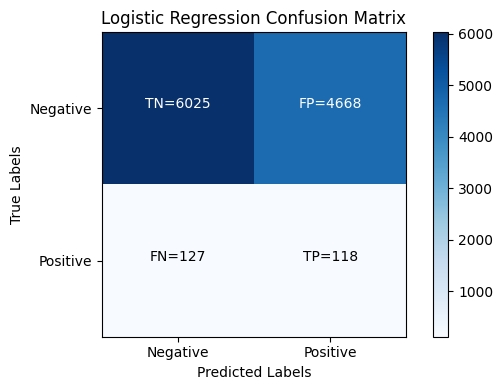


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.98      0.56      0.72     10693
           1       0.02      0.48      0.05       245

    accuracy                           0.56     10938
   macro avg       0.50      0.52      0.38     10938
weighted avg       0.96      0.56      0.70     10938



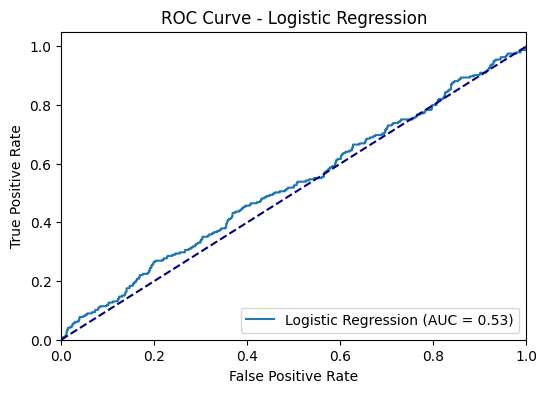



Logistic Regression finished.
___________________________________________________________________

Fine-tuning Decision Tree...
Training DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42)...
DecisionTreeClassifier(class_weight={0: 1, 1: 2}, min_samples_leaf=2,
                       min_samples_split=10, random_state=42) training completed in 3.06 seconds.
-------------------------------------------------------------------



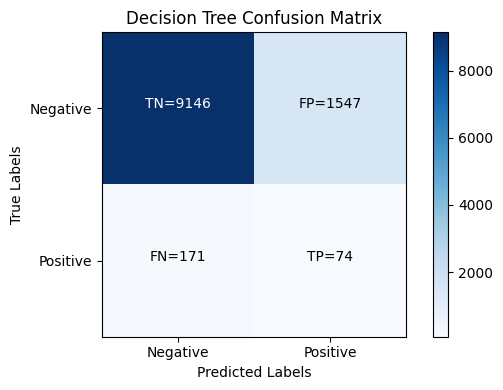


Classification Report for Decision Tree:

              precision    recall  f1-score   support

           0       0.98      0.86      0.91     10693
           1       0.05      0.30      0.08       245

    accuracy                           0.84     10938
   macro avg       0.51      0.58      0.50     10938
weighted avg       0.96      0.84      0.90     10938



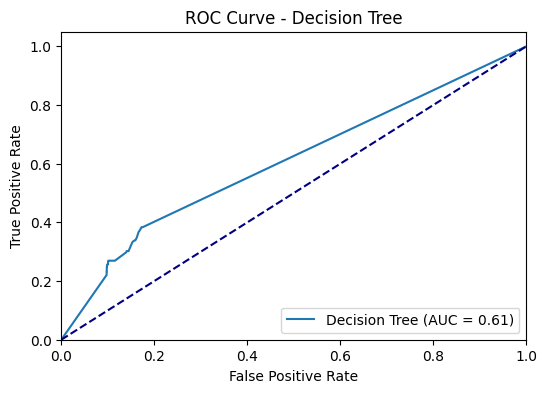



Decision Tree finished.
___________________________________________________________________

Fine-tuning Random Forest...
Training RandomForestClassifier(max_depth=10, max_features='log2', random_state=42)...
RandomForestClassifier(max_depth=10, max_features='log2', random_state=42) training completed in 18.55 seconds.
-------------------------------------------------------------------



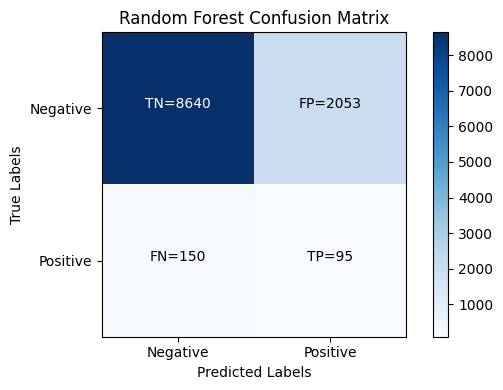


Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.98      0.81      0.89     10693
           1       0.04      0.39      0.08       245

    accuracy                           0.80     10938
   macro avg       0.51      0.60      0.48     10938
weighted avg       0.96      0.80      0.87     10938



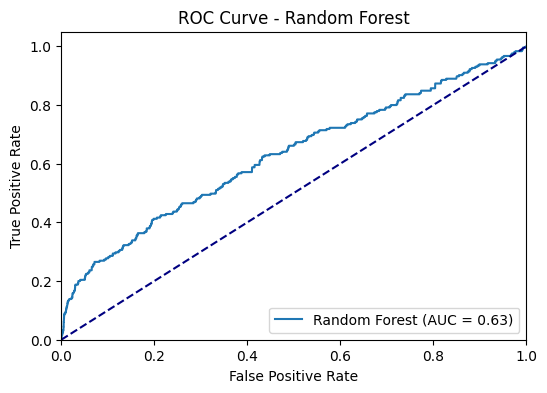



Random Forest finished.
___________________________________________________________________

Fine-tuning SGD...
Training SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42)...
SGDClassifier(alpha=0.01, class_weight={0: 1, 1: 2}, loss='log', penalty='l1',
              random_state=42) training completed in 0.14 seconds.
-------------------------------------------------------------------



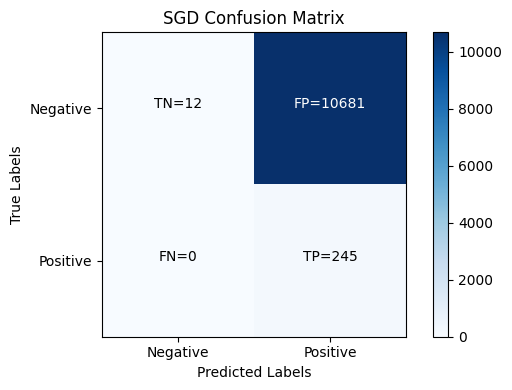


Classification Report for SGD:

              precision    recall  f1-score   support

           0       1.00      0.00      0.00     10693
           1       0.02      1.00      0.04       245

    accuracy                           0.02     10938
   macro avg       0.51      0.50      0.02     10938
weighted avg       0.98      0.02      0.00     10938



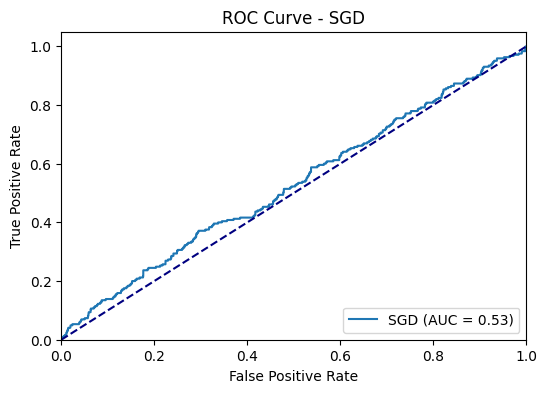



SGD finished.
___________________________________________________________________

Fine-tuning KNN...
Training KNeighborsClassifier(metric='euclidean')...
KNeighborsClassifier(metric='euclidean') training completed in 0.01 seconds.
-------------------------------------------------------------------



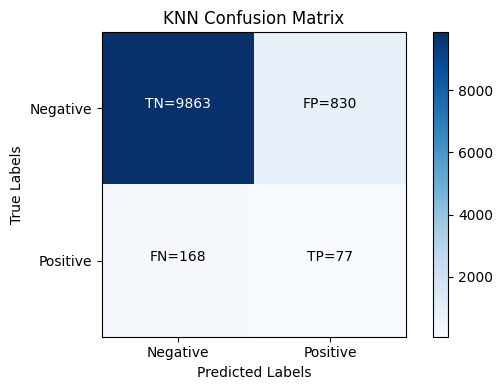


Classification Report for KNN:

              precision    recall  f1-score   support

           0       0.98      0.92      0.95     10693
           1       0.08      0.31      0.13       245

    accuracy                           0.91     10938
   macro avg       0.53      0.62      0.54     10938
weighted avg       0.96      0.91      0.93     10938



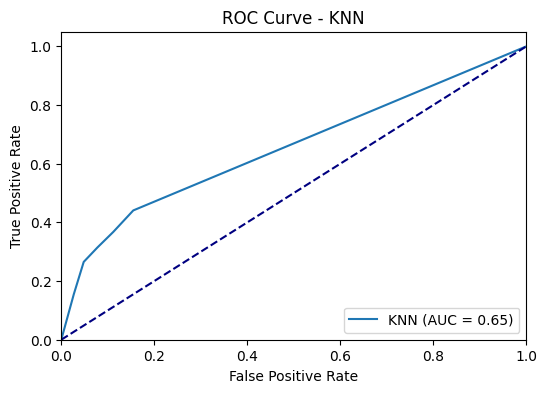



KNN finished.
___________________________________________________________________

Fine-tuning Gradient Boosting...
Training GradientBoostingClassifier(n_estimators=50, random_state=42)...
GradientBoostingClassifier(n_estimators=50, random_state=42) training completed in 22.41 seconds.
-------------------------------------------------------------------



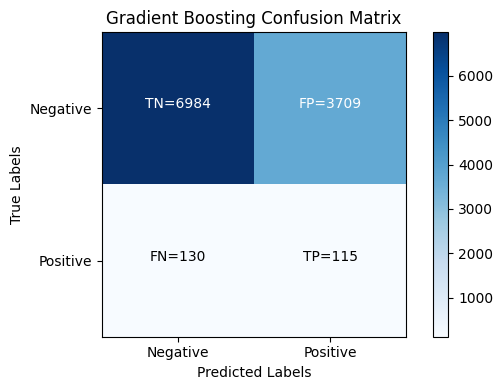


Classification Report for Gradient Boosting:

              precision    recall  f1-score   support

           0       0.98      0.65      0.78     10693
           1       0.03      0.47      0.06       245

    accuracy                           0.65     10938
   macro avg       0.51      0.56      0.42     10938
weighted avg       0.96      0.65      0.77     10938



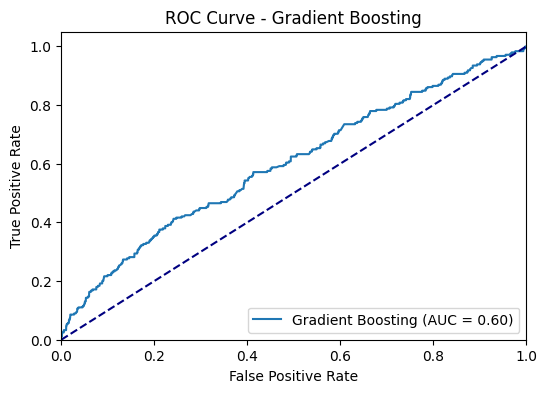



Gradient Boosting finished.
___________________________________________________________________

Fine-tuning XGBoost...
Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)...
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
   

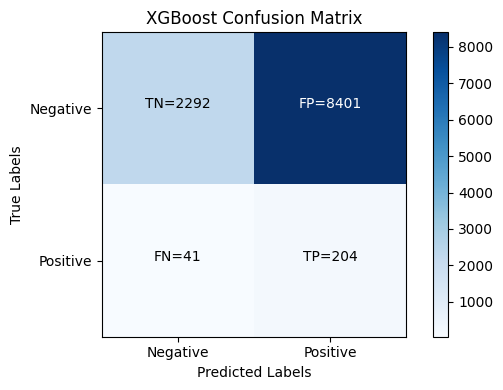


Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.98      0.21      0.35     10693
           1       0.02      0.83      0.05       245

    accuracy                           0.23     10938
   macro avg       0.50      0.52      0.20     10938
weighted avg       0.96      0.23      0.35     10938



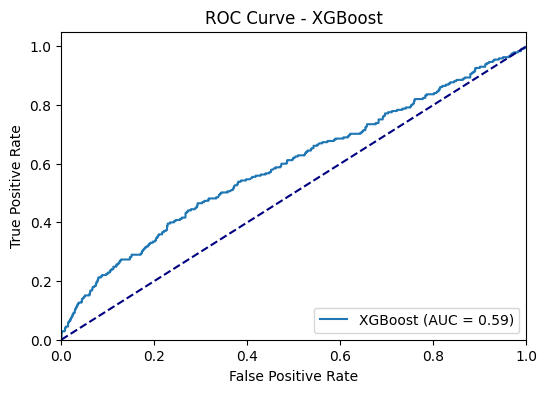



XGBoost finished.
___________________________________________________________________



In [97]:
# Train, fine-tune, and evaluate models
for model_name, (model, param_grid) in models.items():
    print(f"Fine-tuning {model_name}...")

    best_model = fine_tune_model(model, param_grid, X_train_resampled, y_train_resampled, scoring=f_beta)

    used_scoring = 'f2'

    # Train and evaluate the best model
    best_model = train_model(X_train_resampled_pca, y_train_resampled, best_model)

    # Calculate predicted probabilities for the positive class
    y_score = best_model.predict_proba(X_test_preprocessed_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    # Calculate evaluation metrics
    y_pred = best_model.predict(X_test_preprocessed_pca)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(conf_matrix, model_name)

    # Print classification report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Plot ROC curve
    plot_roc_curve(fpr, tpr, roc_auc, model_name)

    print(f"{model_name} finished.")
    print('___________________________________________________________________\n')

    # Append evaluation metrics to the DataFrame
    if model_name == 'XGBoost':
        class_weights = best_model.get_params().get('scale_pos_weight')
        evaluation_df_SMOTEENN = evaluation_df_SMOTEENN.append({
            'Model Name': model_name,
            'Class Weights': {0: 1, 1: class_weights} if class_weights else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'PCA': 'yes'
        }, ignore_index=True)
    else:
        evaluation_df_SMOTEENN = evaluation_df_SMOTEENN.append({
            'Model Name': model_name,
            'Class Weights': best_model.class_weight if hasattr(best_model, 'class_weight') else None,
            'Scoring Parameter': used_scoring,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'PCA': 'yes'
        }, ignore_index=True)

In [98]:
# Save the evaluation DataFrame to a CSV file
evaluation_df_SMOTEENN.to_csv('model_evaluation_metrics_SMOTEENN.csv', index=False)
evaluation_df_SMOTEENN

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score,PCA
0,Logistic Regression,balanced,f1,0.604864,0.028452,0.502041,0.053853,no
1,Decision Tree,balanced,f1,0.961967,0.174905,0.187755,0.181102,no
2,Random Forest,balanced,f1,0.964162,0.207171,0.212245,0.209677,no
3,SGD,balanced,f1,0.527519,0.024164,0.510204,0.046142,no
4,KNN,None,f1,0.953739,0.134454,0.195918,0.159468,no
5,Gradient Boosting,None,f1,0.967270,0.204188,0.159184,0.178899,no
6,XGBoost,None,f1,0.974035,0.294737,0.114286,0.164706,no
7,Logistic Regression,None,f1,0.584842,0.028120,0.522449,0.053367,no
8,Decision Tree,balanced,f1,0.961967,0.174905,0.187755,0.181102,no
9,Random Forest,None,f1,0.962790,0.206522,0.232653,0.218810,no


# CONCLUSIONS

*Collected metrics are merged in a unique dataframe and we will analyze the best models (with accuracy at least of 0.85)*

In [163]:
df1 = pd.read_csv('model_evaluation_metrics_SMOTE.csv')
df2 = pd.read_csv('model_evaluation_metrics_RUS.csv')
df3 = pd.read_csv('model_evaluation_metrics_ADASYN.csv')
df4 = pd.read_csv('model_evaluation_metrics_SMOTEENN.csv')

# Add a new column for each dataframe indicating the sampling technique
df1['Sampling_technique'] = 'SMOTE'
df2['Sampling_technique'] = 'RUS'
df3['Sampling_technique'] = 'ADASYN'
df4['Sampling_technique'] = 'SMOTEENN'

In [170]:
merged_df = pd.concat([df1, df2, df3, df4], ignore_index=True)
filtered_df = merged_df[merged_df['Accuracy'] > 0.9]
sorted_df = filtered_df.sort_values(by='Recall', ascending=False)

In [171]:
sorted_df

,Model Name,Class Weights,Scoring Parameter,Accuracy,Precision,Recall,F1 Score,PCA,Sampling_technique
109,KNN,NaN,f2,0.908758,0.084895,0.314286,0.133681,yes,SMOTEENN
102,KNN,NaN,f2,0.920735,0.095052,0.297959,0.144126,no,SMOTEENN
25,KNN,NaN,f2,0.913695,0.085409,0.293878,0.132353,yes,SMOTE
81,KNN,NaN,f2,0.912690,0.082353,0.285714,0.127854,yes,ADASYN
99,Decision Tree,"{0: 1, 1: 2}",f2,0.949717,0.152620,0.273469,0.195906,no,SMOTEENN
18,KNN,NaN,f2,0.927226,0.096633,0.269388,0.142241,no,SMOTE
15,Decision Tree,"{0: 1, 1: 2}",f2,0.953191,0.158568,0.253061,0.194969,no,SMOTE
74,KNN,NaN,f2,0.929238,0.092450,0.244898,0.134228,no,ADASYN
71,Decision Tree,"{0: 1, 1: 2}",f2,0.953465,0.156250,0.244898,0.190779,no,ADASYN
65,Random Forest,"{0: 1, 1: 2}",f1,0.967819,0.260090,0.236735,0.247863,no,ADASYN


*Listed above are the most promising models (here sorted by recall because I think in a Credit Risk prediction model to minimize the false negatives is the main interest of a bank).*

*The criticality of this Machine Learning algorithm is the high imbalance of target labels: High risk profiles are just 2% of total.*

*In addition, the high number of features may have contributed in creating overfitting patterns. PCA seems to behave well in that sense and some interesting PCA-models mantain a good accuracy when trying to reach higher vaues of recall too (A further optimization analysis could be performed on PCA number of components, here 20, but due to time and resources reasons this has not been done).*

*Different types of fine tune scoring + hyperparameters and/or more models may be taken into consideration, but, again, time and resources reasons prevented to dive deeper.*

*Last but not least, the bank can choose the most suitable model between the ones shown above, depending on what they consider more important among accuracy, precision, recall, f1 and f2 scores. Costs evelautions and optimizations should be performed to choose the best one.*